# Home Credit Analysis

## Background

Sebuah perusahaan di Indonesia ingin mengoptimalkan pemberian suatu credit kepada customer agar dapat meminimalisir kerugian jika ada customer yang gagal bayar. Akan dilakukan pemodelan machine learning, untuk memprediksi potential customer dalam digital advertising. Dengan mengasumsikan diri kita sebagai Data Scientist pada sebuah perusahaan pembiayaan berbasis teknologi.

## Problem

Tim bisnis ingin meminimalkan kerugian yang didapat dari customer yang telah gagal bayar mengoptimalkan pemberian suatu credit kepada customer.


## Goals

Membuat machine learning model yang dapat mendeteksi potential customer untuk dapat membayar atau gagal membayar setelah mendapat persetujuan credit.

## Bussines Metric
Target rate

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from warnings import filterwarnings
filterwarnings('ignore')

In [2]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

## Load Data

In [3]:
df = pd.read_csv("application_train.csv")
df.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

# Exploratory Data Analysis

## Descriptive Statistic

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB


- Dataset memiliki 122 kolom dan 307511 baris data




In [5]:
df.columns.values

array(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'CODE_GENDER',
       'FLAG_OWN_CAR', 'FLAG_OWN_REALTY', 'CNT_CHILDREN',
       'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE',
       'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED',
       'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE',
       'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE',
       'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'OCCUPATION_TYPE',
       'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT',
       'REGION_RATING_CLIENT_W_CITY', 'WEEKDAY_APPR_PROCESS_START',
       'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION',
       'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION',
       'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY',
       'LIVE_CITY_NOT_WORK_CITY', 'ORGANIZATION_TYPE', 'EXT_SOURCE_1',
       'EXT_SOURCE_2', 'EXT_SOURCE_3',

In [6]:
#Categorical
cat_df = df.select_dtypes(include='object')
cats = cat_df.columns
print(cats)

#Numerical
nums = [col for col in df.columns if df[col].dtype != "O"
                  and col not in "TARGET"
                  and col not in "SK_ID_CURR"
                  and col not in cats]               
print(nums)                                  

Index(['NAME_CONTRACT_TYPE', 'CODE_GENDER', 'FLAG_OWN_CAR', 'FLAG_OWN_REALTY',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'NAME_HOUSING_TYPE', 'OCCUPATION_TYPE',
       'WEEKDAY_APPR_PROCESS_START', 'ORGANIZATION_TYPE', 'FONDKAPREMONT_MODE',
       'HOUSETYPE_MODE', 'WALLSMATERIAL_MODE', 'EMERGENCYSTATE_MODE'],
      dtype='object')
['CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_ANNUITY', 'AMT_GOODS_PRICE', 'REGION_POPULATION_RELATIVE', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'DAYS_REGISTRATION', 'DAYS_ID_PUBLISH', 'OWN_CAR_AGE', 'FLAG_MOBIL', 'FLAG_EMP_PHONE', 'FLAG_WORK_PHONE', 'FLAG_CONT_MOBILE', 'FLAG_PHONE', 'FLAG_EMAIL', 'CNT_FAM_MEMBERS', 'REGION_RATING_CLIENT', 'REGION_RATING_CLIENT_W_CITY', 'HOUR_APPR_PROCESS_START', 'REG_REGION_NOT_LIVE_REGION', 'REG_REGION_NOT_WORK_REGION', 'LIVE_REGION_NOT_WORK_REGION', 'REG_CITY_NOT_LIVE_CITY', 'REG_CITY_NOT_WORK_CITY', 'LIVE_CITY_NOT_WORK_CITY', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SO

### Categorical

In [7]:
df[cats].describe().T

,count,unique,top,freq
NAME_CONTRACT_TYPE,307511,2,Cash loans,278232
CODE_GENDER,307511,3,F,202448
FLAG_OWN_CAR,307511,2,N,202924
FLAG_OWN_REALTY,307511,2,Y,213312
NAME_TYPE_SUITE,306219,7,Unaccompanied,248526
NAME_INCOME_TYPE,307511,8,Working,158774
NAME_EDUCATION_TYPE,307511,5,Secondary / secondary special,218391
NAME_FAMILY_STATUS,307511,6,Married,196432
NAME_HOUSING_TYPE,307511,6,House / apartment,272868
OCCUPATION_TYPE,211120,18,Laborers,55186


- Kolom CODE_GENDER tidak wajar karena memiliki 3 jenis value (seharusnya 2, yaitu F dan M)
- Kolom ORGANIZATION_TYPE memiliki kardinalitas (jumlah unique values) yang cukup tinggi (58). Tampaknya kita perlu exclude fitur ini dari dataset untuk pemodelan.

In [8]:
for column in cats:
    print(df[column].value_counts())
    print("-" * 40)

Cash loans         278232
Revolving loans     29279
Name: NAME_CONTRACT_TYPE, dtype: int64
----------------------------------------
F      202448
M      105059
XNA         4
Name: CODE_GENDER, dtype: int64
----------------------------------------
N    202924
Y    104587
Name: FLAG_OWN_CAR, dtype: int64
----------------------------------------
Y    213312
N     94199
Name: FLAG_OWN_REALTY, dtype: int64
----------------------------------------
Unaccompanied      248526
Family              40149
Spouse, partner     11370
Children             3267
Other_B              1770
Other_A               866
Group of people       271
Name: NAME_TYPE_SUITE, dtype: int64
----------------------------------------
Working                 158774
Commercial associate     71617
Pensioner                55362
State servant            21703
Unemployed                  22
Student                     18
Businessman                 10
Maternity leave              5
Name: NAME_INCOME_TYPE, dtype: int64
----------

### Numerical

In [9]:
df[nums].describe().T

,count,mean,std,min,25%,50%,75%,max
CNT_CHILDREN,307511.0,0.417052,0.722121,0.000000e+00,0.000000,0.000000,1.000000,1.900000e+01
AMT_INCOME_TOTAL,307511.0,168797.919297,237123.146279,2.565000e+04,112500.000000,147150.000000,202500.000000,1.170000e+08
AMT_CREDIT,307511.0,599025.999706,402490.776996,4.500000e+04,270000.000000,513531.000000,808650.000000,4.050000e+06
AMT_ANNUITY,307499.0,27108.573909,14493.737315,1.615500e+03,16524.000000,24903.000000,34596.000000,2.580255e+05
AMT_GOODS_PRICE,307233.0,538396.207429,369446.460540,4.050000e+04,238500.000000,450000.000000,679500.000000,4.050000e+06
REGION_POPULATION_RELATIVE,307511.0,0.020868,0.013831,2.900000e-04,0.010006,0.018850,0.028663,7.250800e-02
DAYS_BIRTH,307511.0,-16036.995067,4363.988632,-2.522900e+04,-19682.000000,-15750.000000,-12413.000000,-7.489000e+03
DAYS_EMPLOYED,307511.0,63815.045904,141275.766519,-1.791200e+04,-2760.000000,-1213.000000,-289.000000,3.652430e+05
DAYS_REGISTRATION,307511.0,-4986.120328,3522.886321,-2.467200e+04,-7479.500000,-4504.000000,-2010.000000,0.000000e+00
DAYS_ID_PUBLISH,307511.0,-2994.202373,1509.450419,-7.197000e+03,-4299.000000,-3254.000000,-1720.000000,0.000000e+00


### Cek Duplikat dan Null

In [10]:
def missing_data(data):
    total = data.isnull().sum().sort_values(ascending = False)
    percent = (data.isnull().sum()/data.isnull().count()*100).sort_values(ascending = False)
    return pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])

In [11]:
cek_null = missing_data(df)
cek_null[cek_null['Total'] > 0]

,Total,Percent
COMMONAREA_MEDI,214865,69.872297
COMMONAREA_AVG,214865,69.872297
COMMONAREA_MODE,214865,69.872297
NONLIVINGAPARTMENTS_MODE,213514,69.432963
NONLIVINGAPARTMENTS_AVG,213514,69.432963
NONLIVINGAPARTMENTS_MEDI,213514,69.432963
FONDKAPREMONT_MODE,210295,68.386172
LIVINGAPARTMENTS_MODE,210199,68.354953
LIVINGAPARTMENTS_AVG,210199,68.354953
LIVINGAPARTMENTS_MEDI,210199,68.354953


- Ada 67 kolom yang terdapat missing value

## Univariate Analysis

Text(0.5, 1.0, 'Distribution of Target')

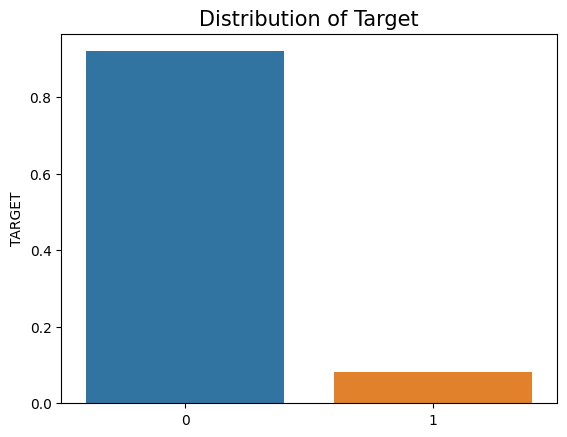

In [21]:
# Distribution of Target
sns.barplot(x=[0,1], y=df['TARGET'].value_counts(normalize=True))
plt.title('Distribution of Target', fontsize=15)

Data target yang akan kita gunakan ternyata memiliki label yang Imbalanced (tidak seimbang) sehingga kita tidak perlu melakukan preprocessing untuk mengatasi imbalanced class.

### Categorical

In [12]:
def plot_categorical(dataframe,cat_cols):
    for col in cat_cols:
         temp = dataframe[col].value_counts()
         df1 = pd.DataFrame({col: temp.index, 'Number of contracts': temp.values})
         fig, ax1 = plt.subplots(ncols=1, figsize=(12, 6))
         sns.set_color_codes("pastel")
         sns.barplot(ax=ax1, x=col, y="Number of contracts", data=df1)
         plt.show();

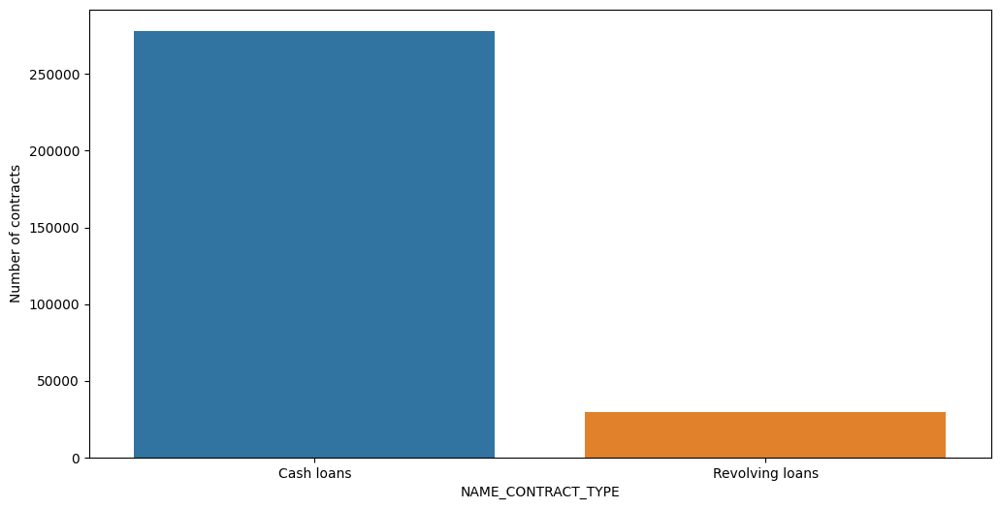

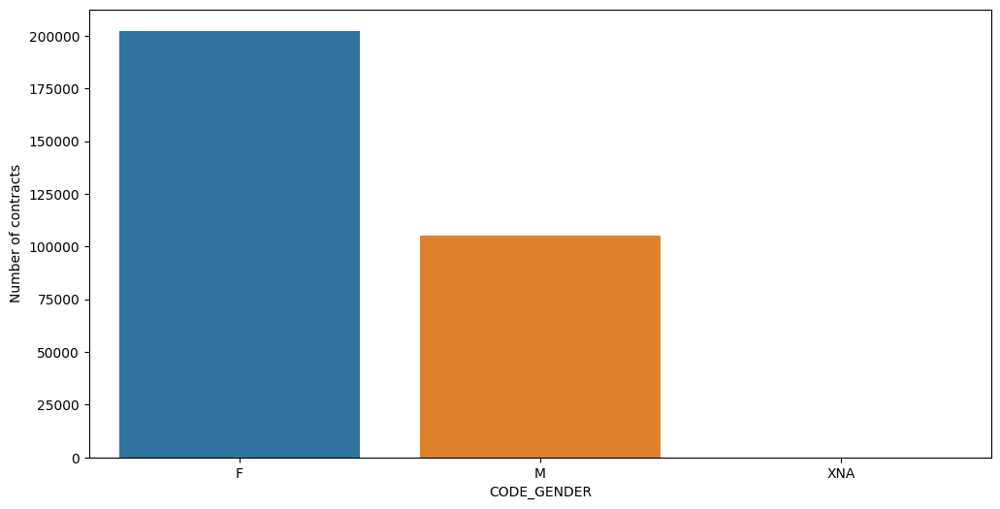

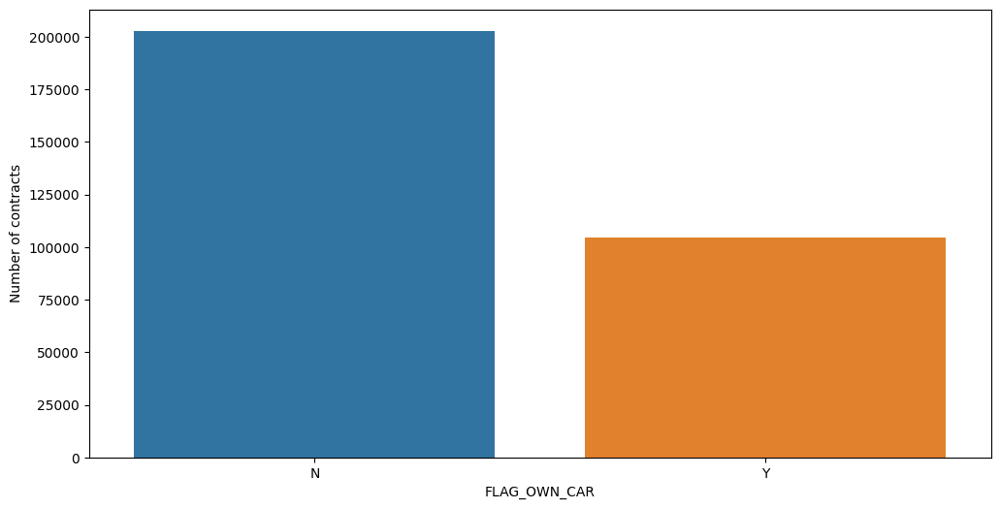

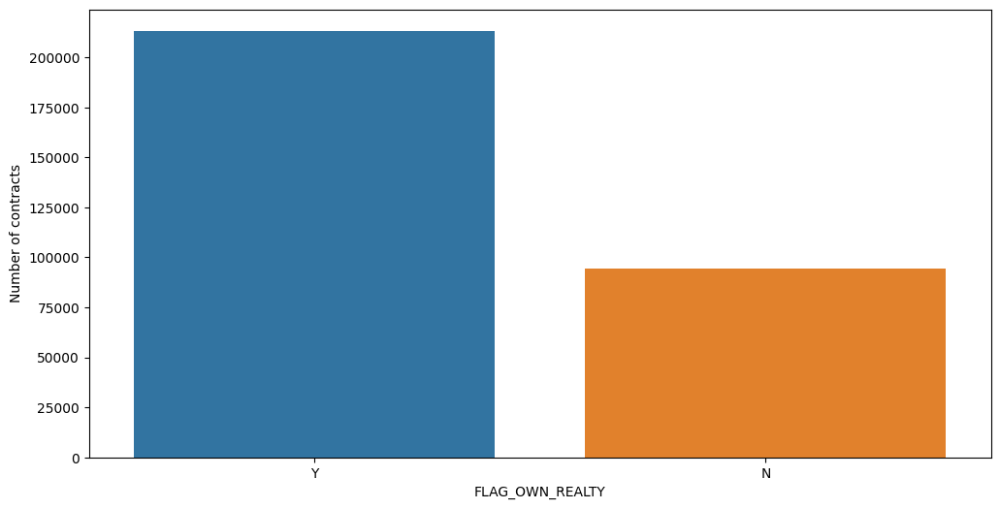

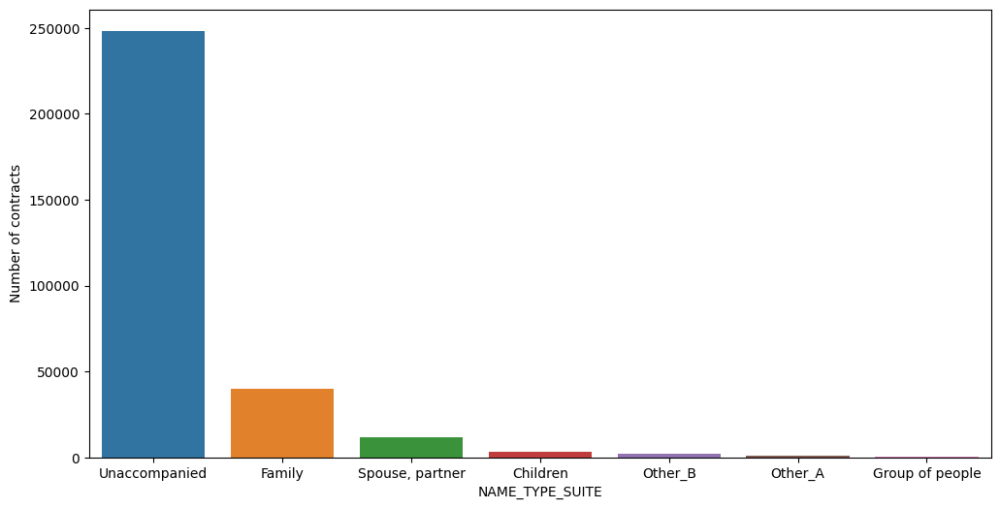

...

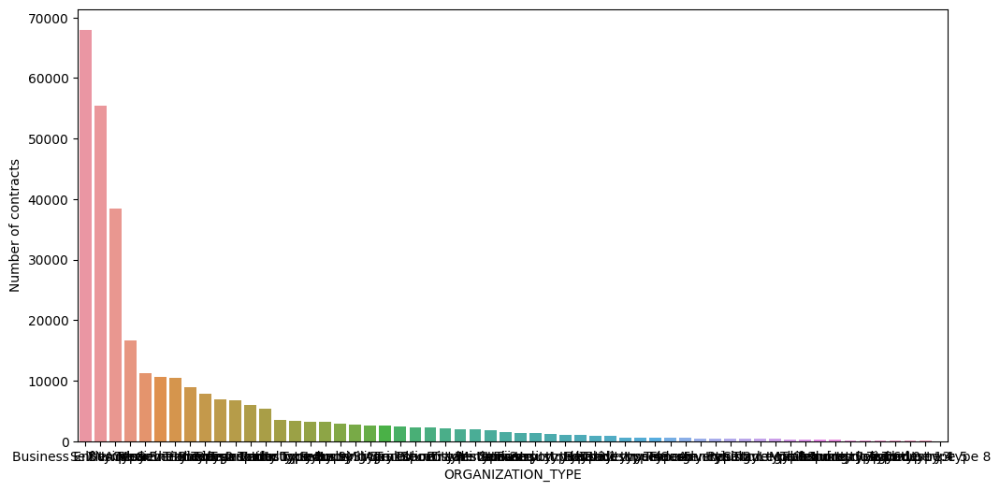

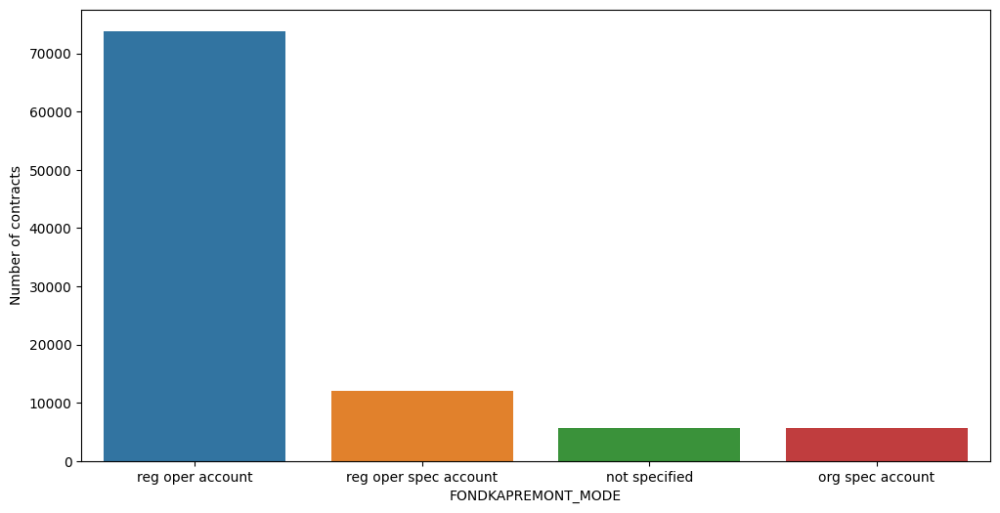

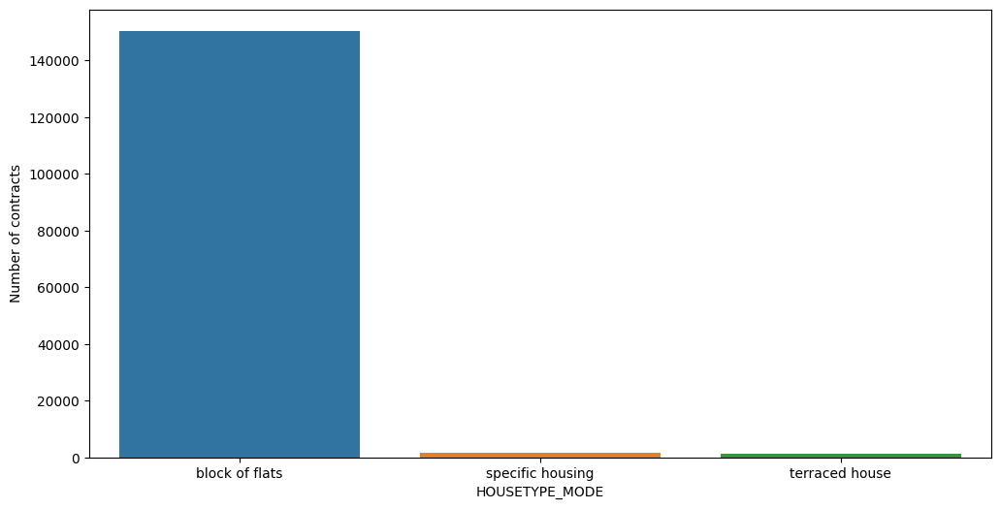

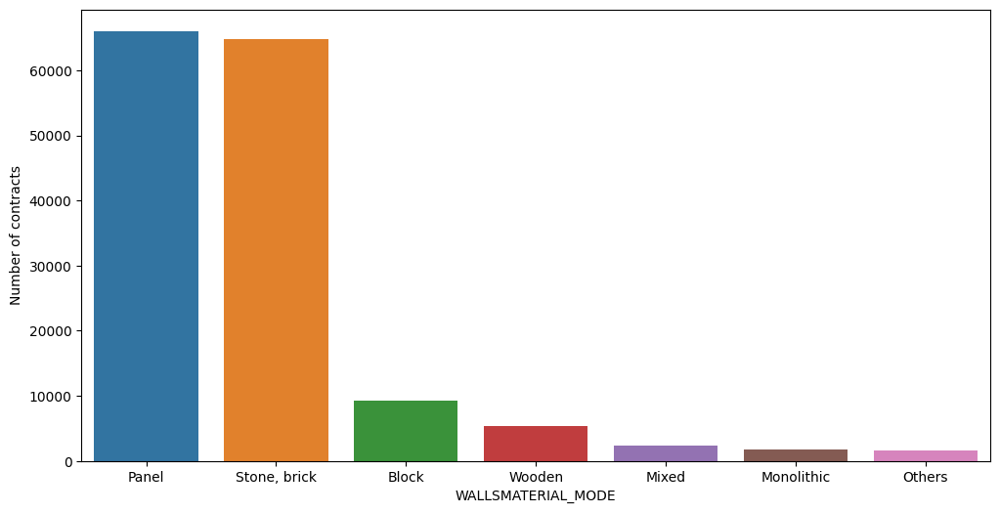

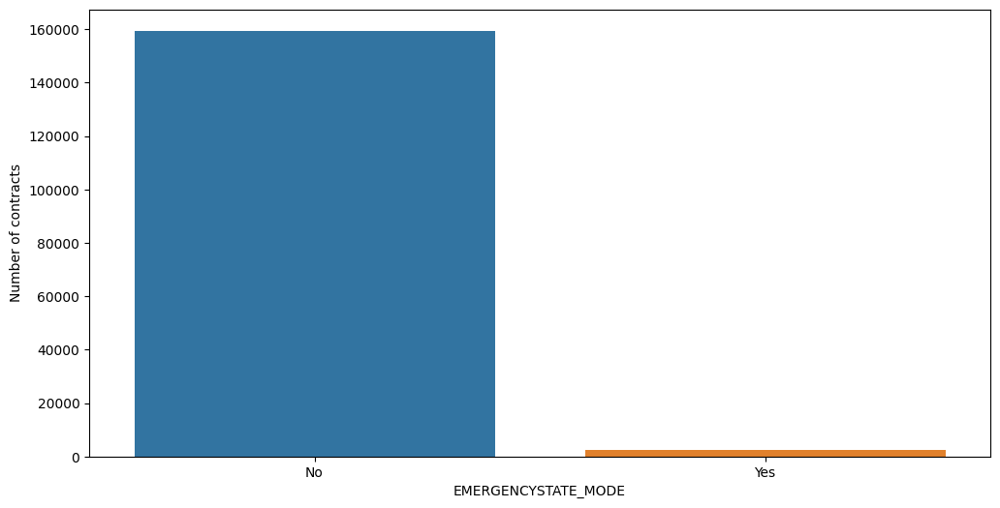

In [13]:
plot_categorical(df,cats)

### Numerical

In [14]:
def plot_numerical(dataframe, num_cols, size=[8, 4], bins=50):
    for col in num_cols:
        plt.figure(figsize=size)
        plt.title("Distribution of %s" % col)
        sns.distplot(dataframe[col], kde=True,bins=bins)
        plt.show()

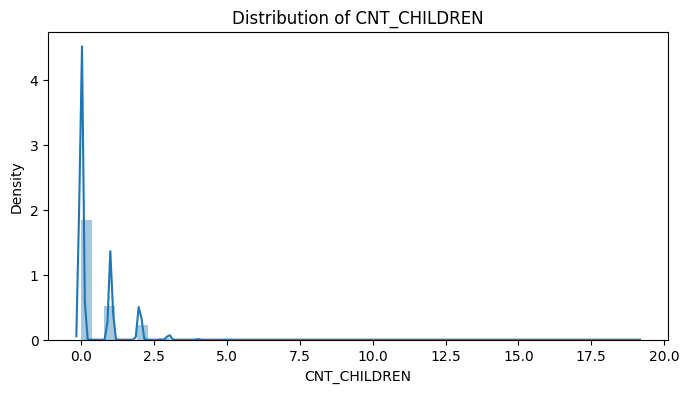

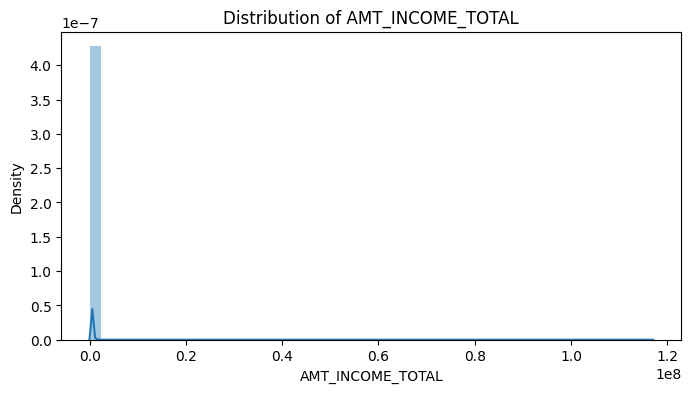

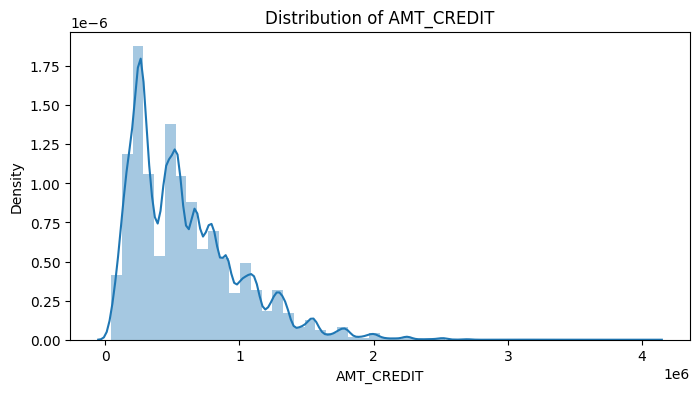

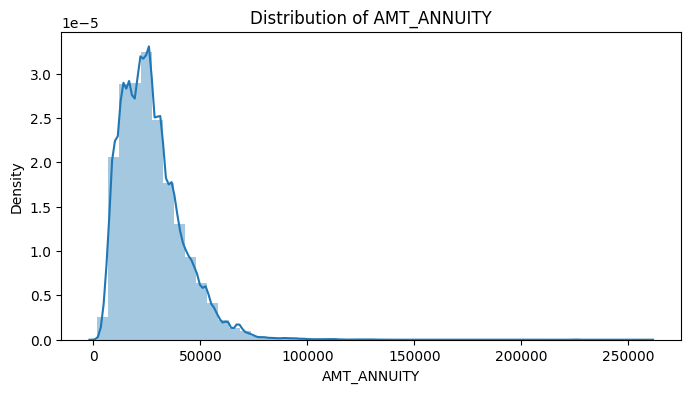

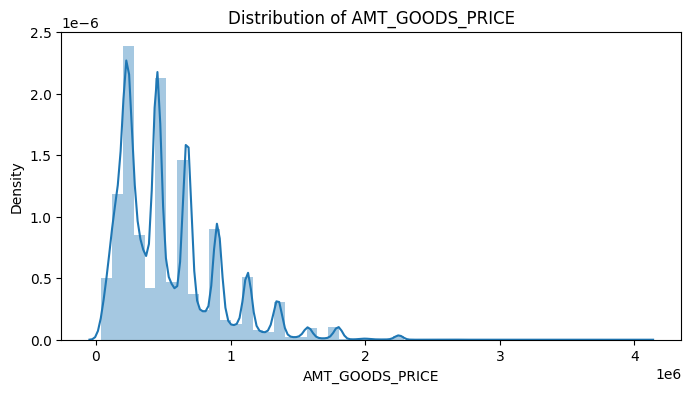

...

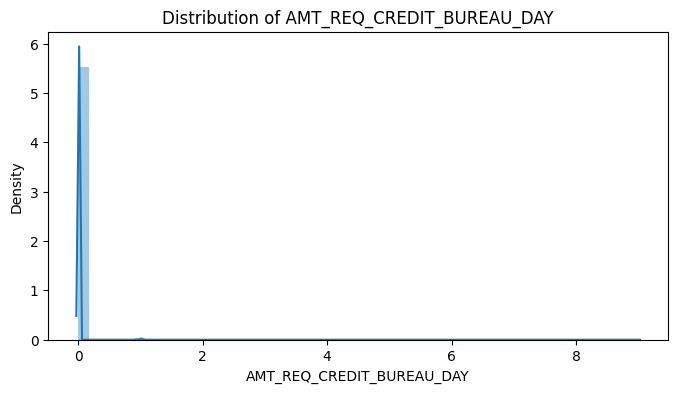

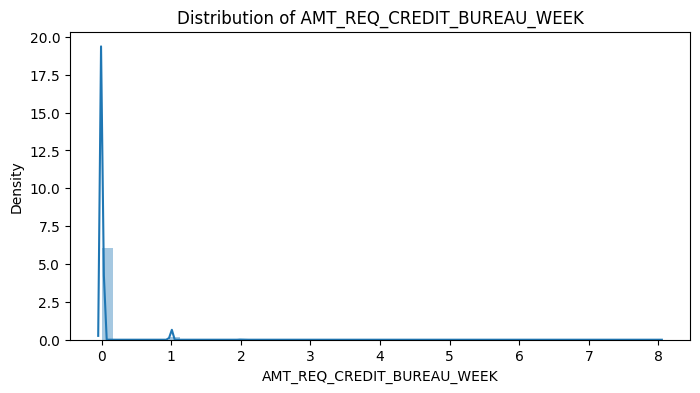

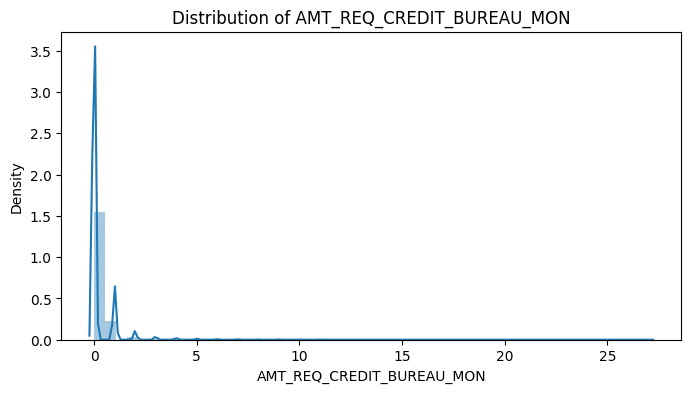

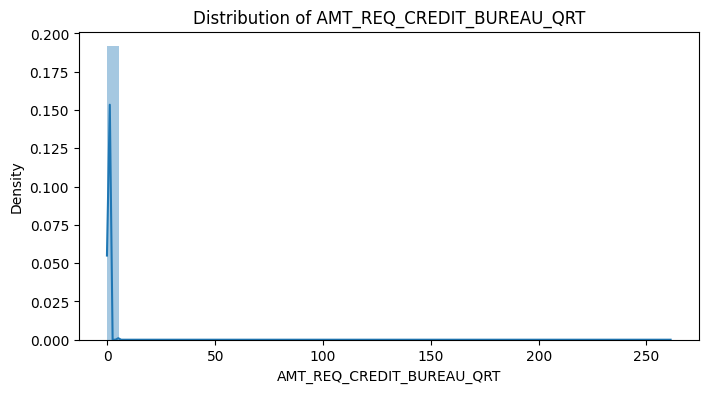

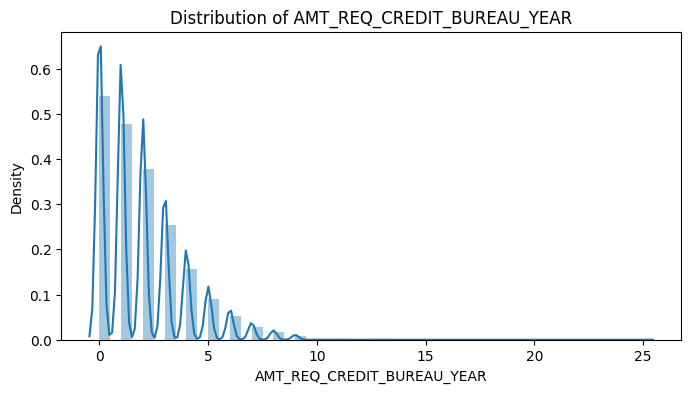

In [15]:
plot_numerical(df, nums, size=[8, 4], bins=50)

## Bivariate Analysis

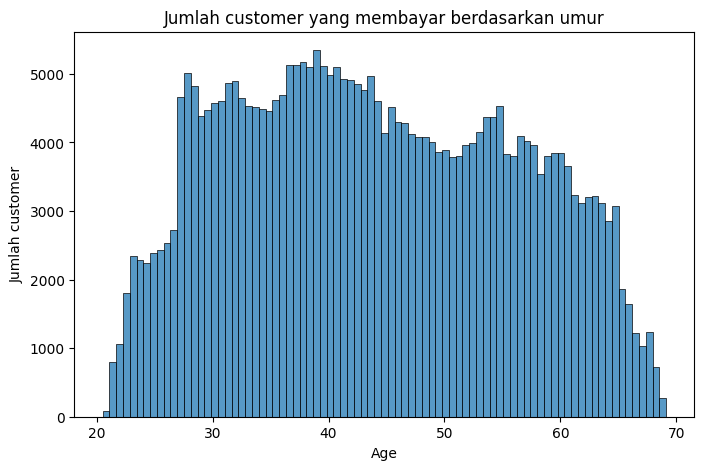

In [23]:
# DAYS_BIRTH vs. TARGET

df_target_1 = df[df['TARGET'] == 1]
plt.figure(figsize=(8, 5))
age = df['DAYS_BIRTH']/-365
sns.histplot(data=df_target_1, x=age)
plt.xlabel('Age')
plt.ylabel('Jumlah customer')
plt.title('Jumlah customer yang membayar berdasarkan umur')
plt.show()

Customer yang dapat membayar berada pada kisaran umur 30-40 tahun. Jika perusahaan harus memprioritaskan beberapa customer saja, maka perusahaan dapat memilih customer yang berusia antara 30-40 tahun untuk diberi persetujuan credit.

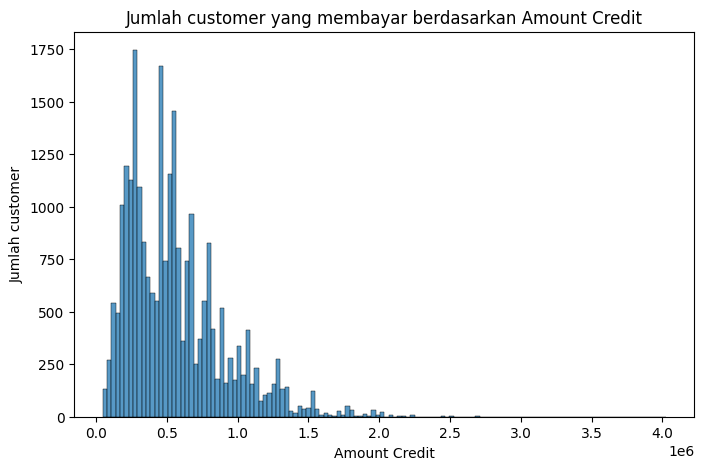

In [24]:
# AMT_CREDIT vs. TARGET

df_target_1 = df[df['TARGET'] == 1]
plt.figure(figsize=(8, 5))
sns.histplot(data=df_target_1, x='AMT_CREDIT')
plt.xlabel('Amount Credit')
plt.ylabel('Jumlah customer')
plt.title('Jumlah customer yang membayar berdasarkan Amount Credit')
plt.show()

Semakin sedikit jumlah kredit yang dimiliki customer, maka semakin banyak customer yang dapat membayar. Sehingga perusahaan bisa membatasi jumlah kredit yang bisa didapat oleh customer.

In [16]:
def target_summary_with_cats(dataframe, cats, target):
    for col in cats:
        print(pd.DataFrame({"Count": dataframe[col].value_counts(dropna=False),
                            "Ratio": 100 * dataframe[col].value_counts() / len(dataframe),
                            "TARGET_MEAN": dataframe.groupby(col)[target].mean()}))
        print("\n\n")
        plt.figure(figsize=(15,10))
        sns.countplot(x=col, hue="TARGET", data=dataframe);
        plt.show()
        print("\n\n")

                  Count      Ratio  TARGET_MEAN
Cash loans       278232  90.478715     0.083459
Revolving loans   29279   9.521285     0.054783





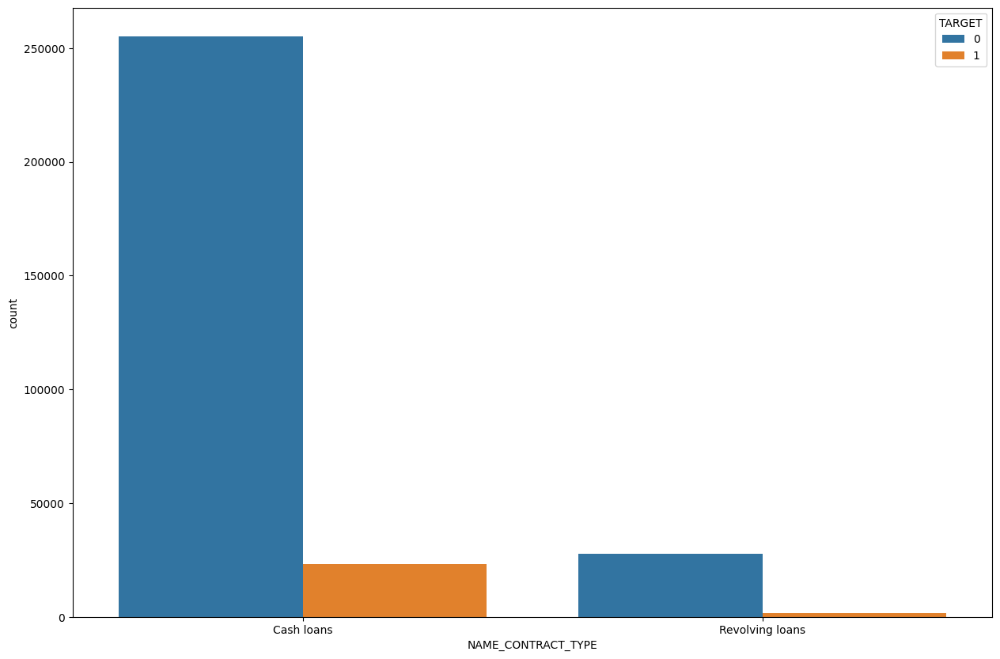




      Count      Ratio  TARGET_MEAN
F    202448  65.834393     0.069993
M    105059  34.164306     0.101419
XNA       4   0.001301     0.000000





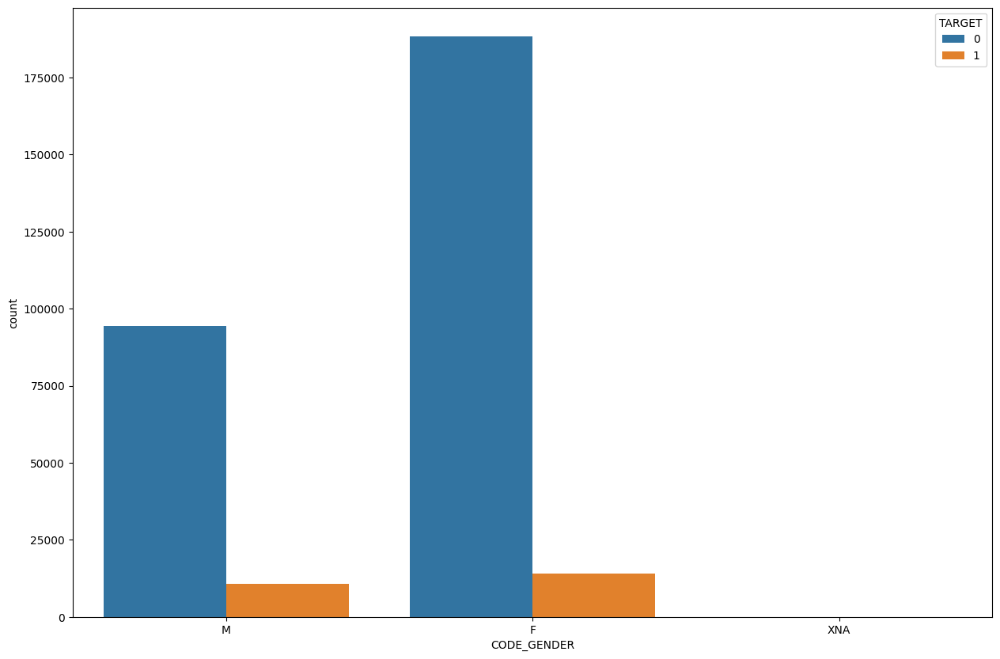




    Count      Ratio  TARGET_MEAN
N  202924  65.989184     0.085002
Y  104587  34.010816     0.072437





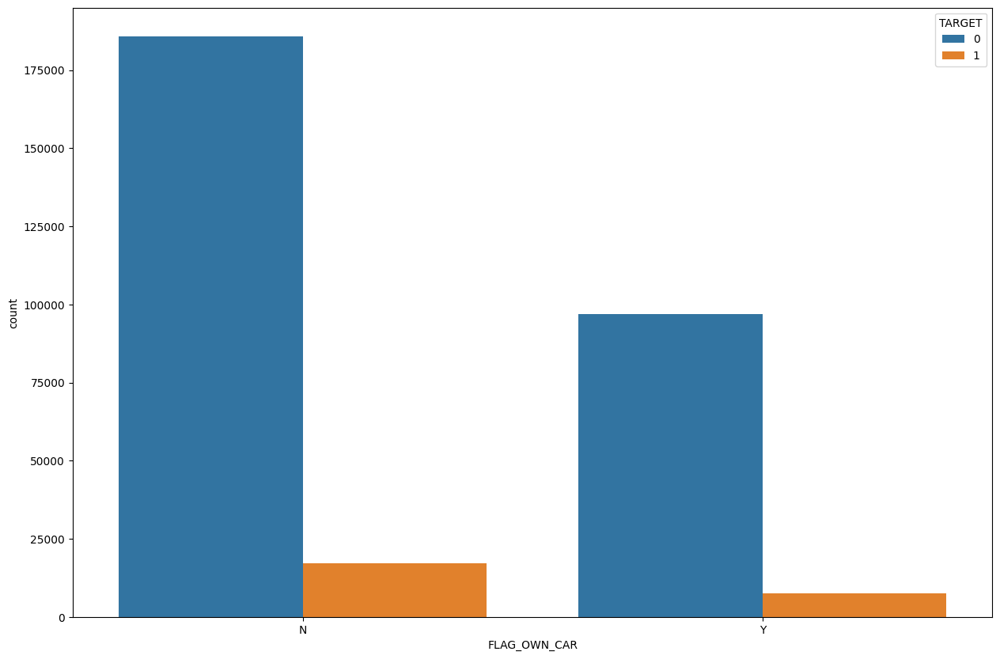




    Count      Ratio  TARGET_MEAN
N   94199  30.632725     0.083249
Y  213312  69.367275     0.079616





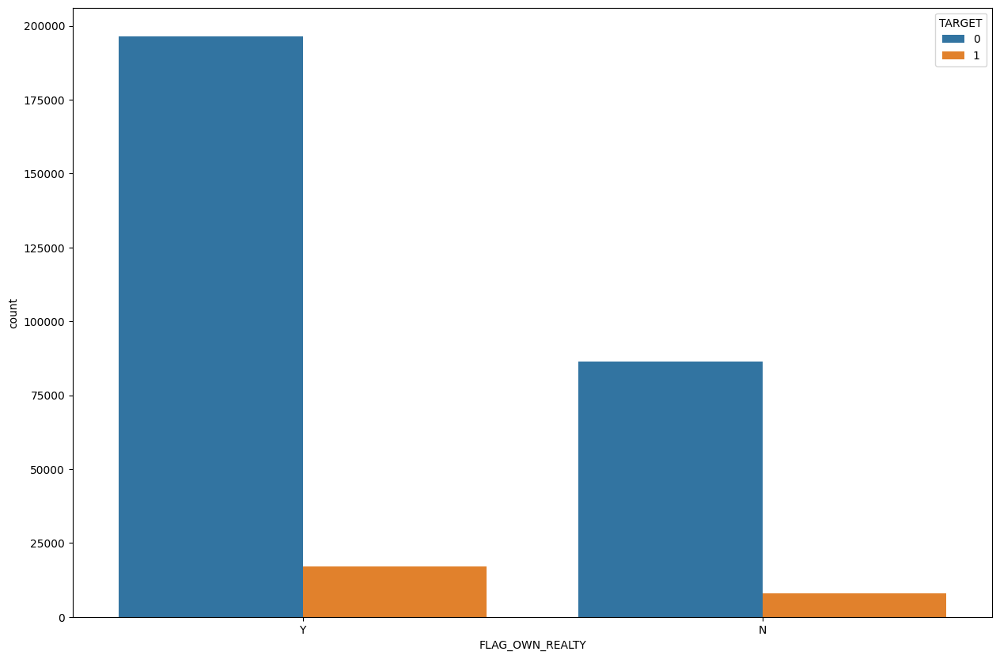




                  Count      Ratio  TARGET_MEAN
Children           3267   1.062401     0.073768
Family            40149  13.056118     0.074946
Other_B            1770   0.575589     0.098305
Spouse, partner   11370   3.697429     0.078716
Unaccompanied    248526  80.818572     0.081830
NaN                1292        NaN          NaN
Other_A             866   0.281616     0.087760
Group of people     271   0.088127     0.084871





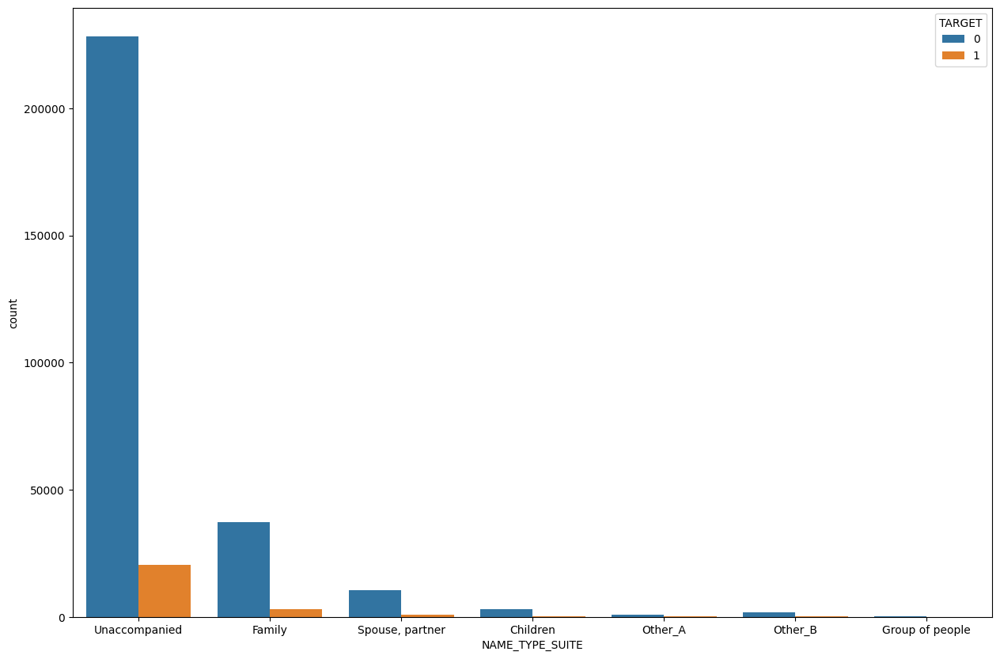




                       Count      Ratio  TARGET_MEAN
Businessman               10   0.003252     0.000000
Commercial associate   71617  23.289248     0.074843
Maternity leave            5   0.001626     0.400000
Pensioner              55362  18.003258     0.053864
State servant          21703   7.057634     0.057550
Student                   18   0.005853     0.000000
Unemployed                22   0.007154     0.363636
Working               158774  51.631974     0.095885





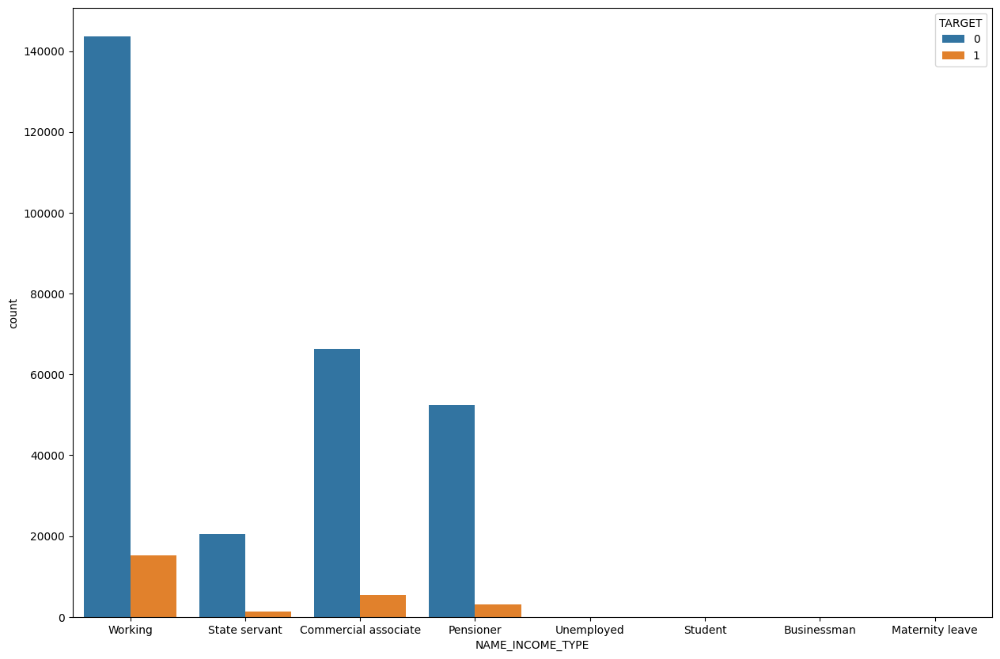




                                Count      Ratio  TARGET_MEAN
Academic degree                   164   0.053331     0.018293
Higher education                74863  24.344820     0.053551
Incomplete higher               10277   3.341994     0.084850
Lower secondary                  3816   1.240931     0.109277
Secondary / secondary special  218391  71.018923     0.089399





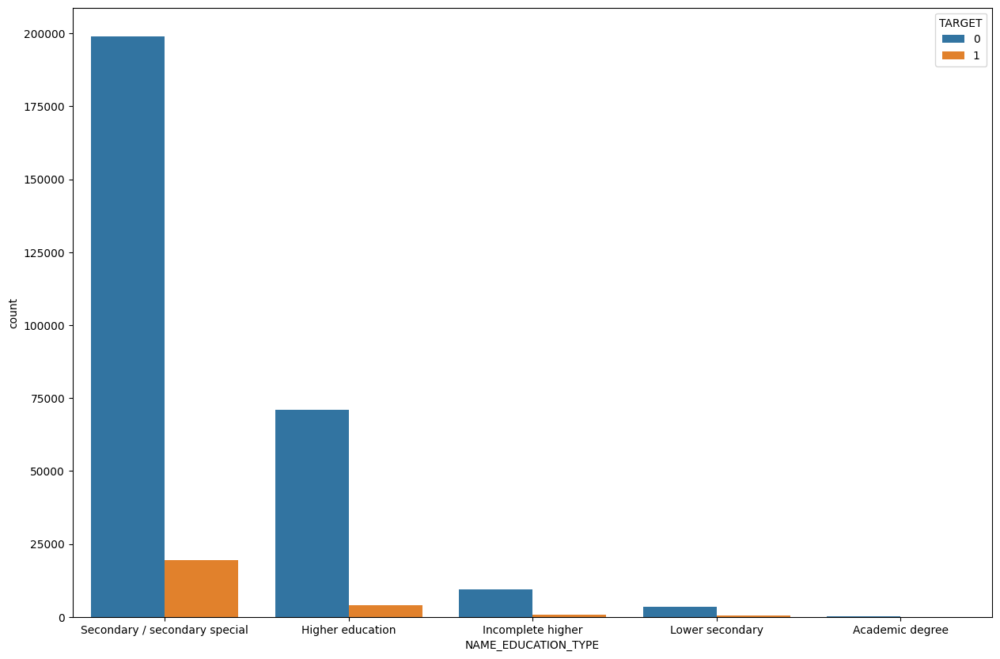




                       Count      Ratio  TARGET_MEAN
Civil marriage         29775   9.682580     0.099446
Married               196432  63.878040     0.075599
Separated              19770   6.429038     0.081942
Single / not married   45444  14.778008     0.098077
Unknown                    2   0.000650     0.000000
Widow                  16088   5.231683     0.058242





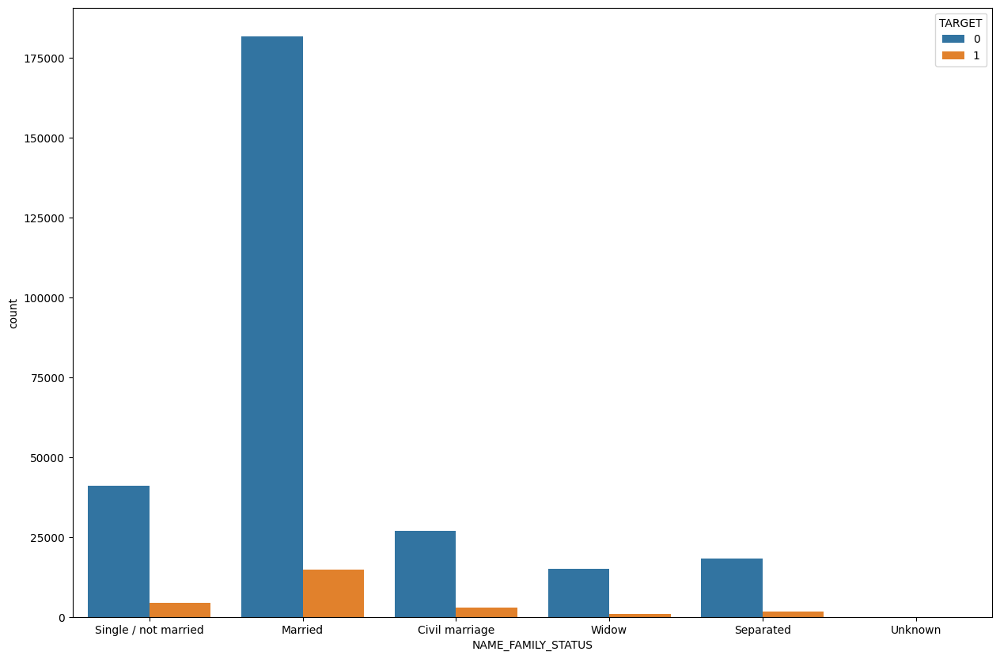




                      Count      Ratio  TARGET_MEAN
Co-op apartment        1122   0.364865     0.079323
House / apartment    272868  88.734387     0.077957
Municipal apartment   11183   3.636618     0.085397
Office apartment       2617   0.851026     0.065724
Rented apartment       4881   1.587260     0.123131
With parents          14840   4.825844     0.116981





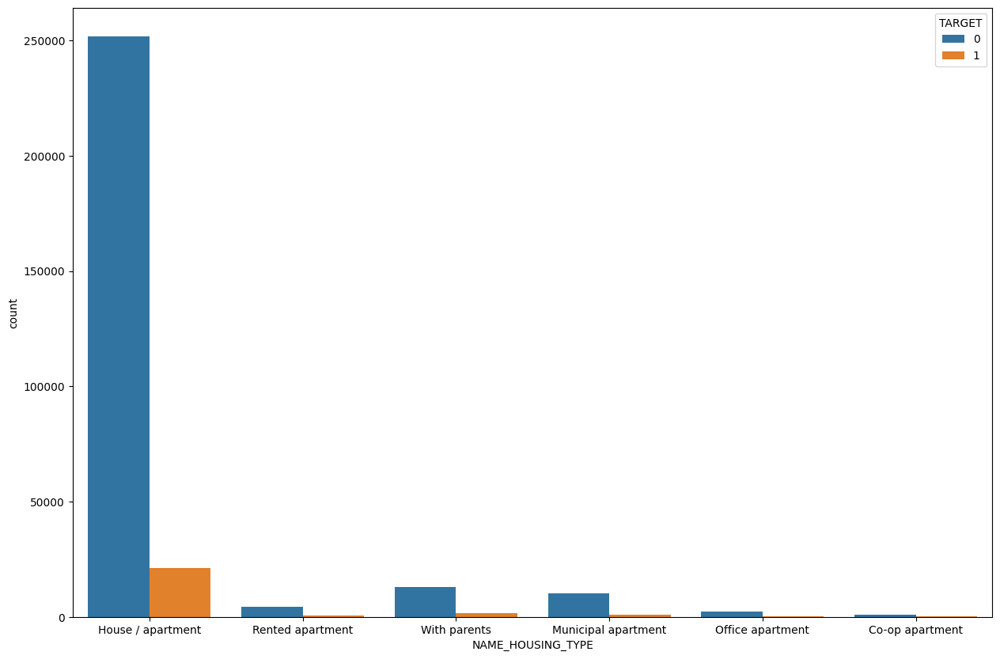




                       Count      Ratio  TARGET_MEAN
NaN                    96391        NaN          NaN
Laborers               55186  17.946025     0.105788
Sales staff            32102  10.439301     0.096318
Core staff             27570   8.965533     0.063040
Managers               21371   6.949670     0.062140
Drivers                18603   6.049540     0.113261
High skill tech staff  11380   3.700681     0.061599
Accountants             9813   3.191105     0.048303
Medicine staff          8537   2.776161     0.067002
Security staff          6721   2.185613     0.107424
Cooking staff           5946   1.933589     0.104440
Cleaning staff          4653   1.513117     0.096067
Private service staff   2652   0.862408     0.065988
Low-skill Laborers      2093   0.680626     0.171524
Waiters/barmen staff    1348   0.438358     0.112760
Secretaries             1305   0.424375     0.070498
Realty agents            751   0.244219     0.078562
HR staff                 563   0.183083    

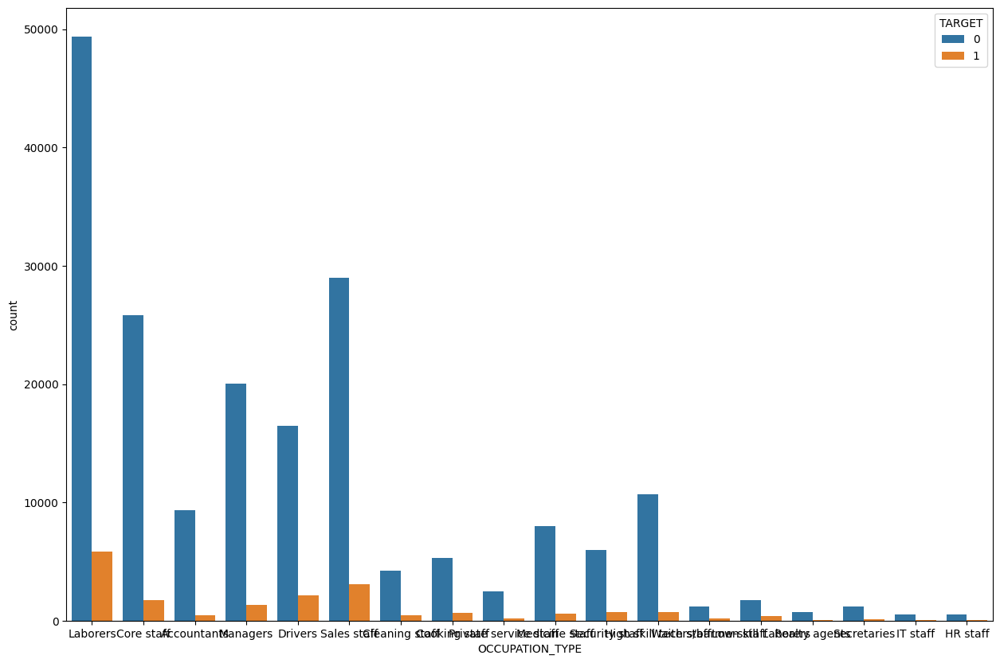




           Count      Ratio  TARGET_MEAN
FRIDAY     50338  16.369496     0.081469
MONDAY     50714  16.491768     0.077572
SATURDAY   33852  11.008387     0.078873
SUNDAY     16181   5.261926     0.079291
THURSDAY   50591  16.451769     0.081003
TUESDAY    53901  17.528153     0.083505
WEDNESDAY  51934  16.888502     0.081604





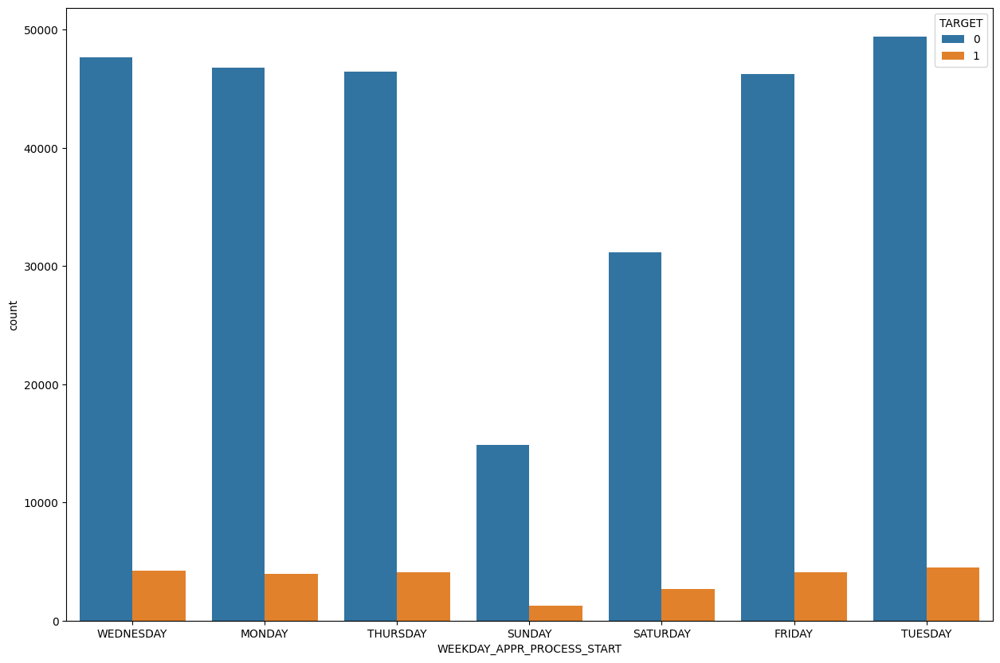




                        Count      Ratio  TARGET_MEAN
Advertising               429   0.139507     0.081585
Agriculture              2454   0.798020     0.104727
Bank                     2507   0.815255     0.051855
Business Entity Type 1   5984   1.945947     0.081384
Business Entity Type 2  10553   3.431747     0.085284
Business Entity Type 3  67992  22.110429     0.092996
Cleaning                  260   0.084550     0.111538
Construction             6721   2.185613     0.116798
Culture                   379   0.123248     0.055409
Electricity               950   0.308932     0.066316
Emergency                 560   0.182107     0.071429
Government              10404   3.383294     0.069781
Hotel                     966   0.314135     0.064182
Housing                  2958   0.961917     0.079446
Industry: type 1         1039   0.337874     0.110683
Industry: type 10         109   0.035446     0.064220
Industry: type 11        2704   0.879318     0.086538
Industry: type 12        

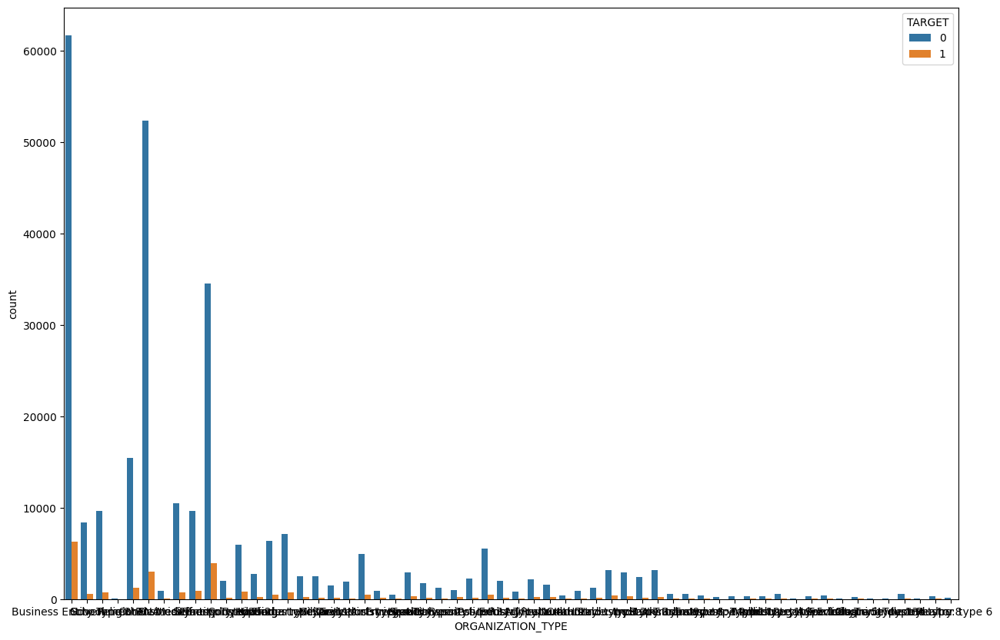




                        Count      Ratio  TARGET_MEAN
NaN                    210295        NaN          NaN
reg oper account        73830  24.008897     0.069782
reg oper spec account   12080   3.928315     0.065563
not specified            5687   1.849365     0.075435
org spec account         5619   1.827252     0.058195





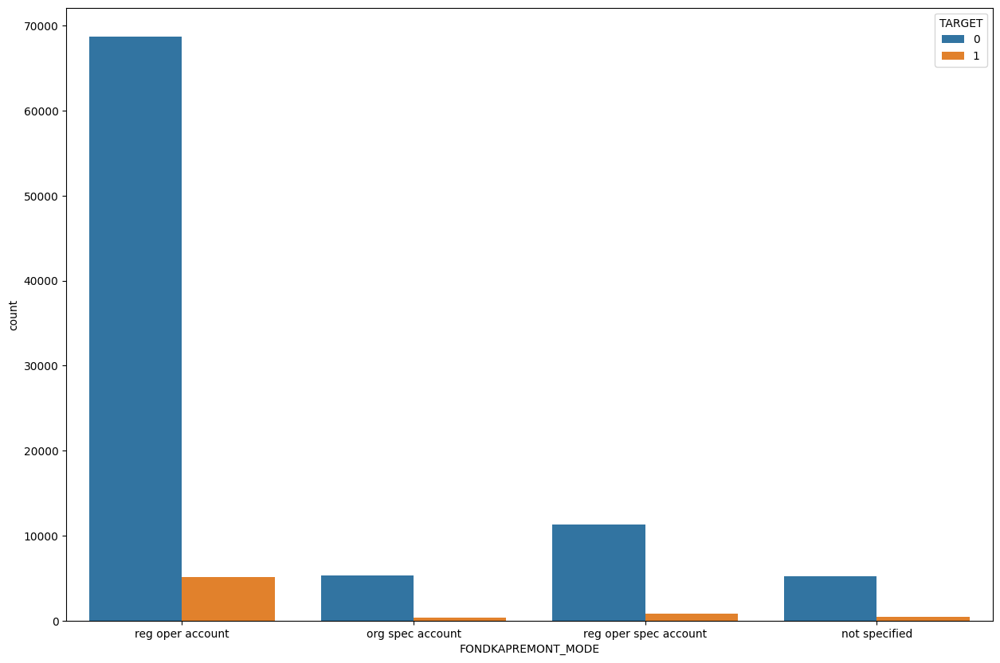




                   Count      Ratio  TARGET_MEAN
NaN               154297        NaN          NaN
block of flats    150503  48.942314     0.069434
specific housing    1499   0.487462     0.101401
terraced house      1212   0.394132     0.084983





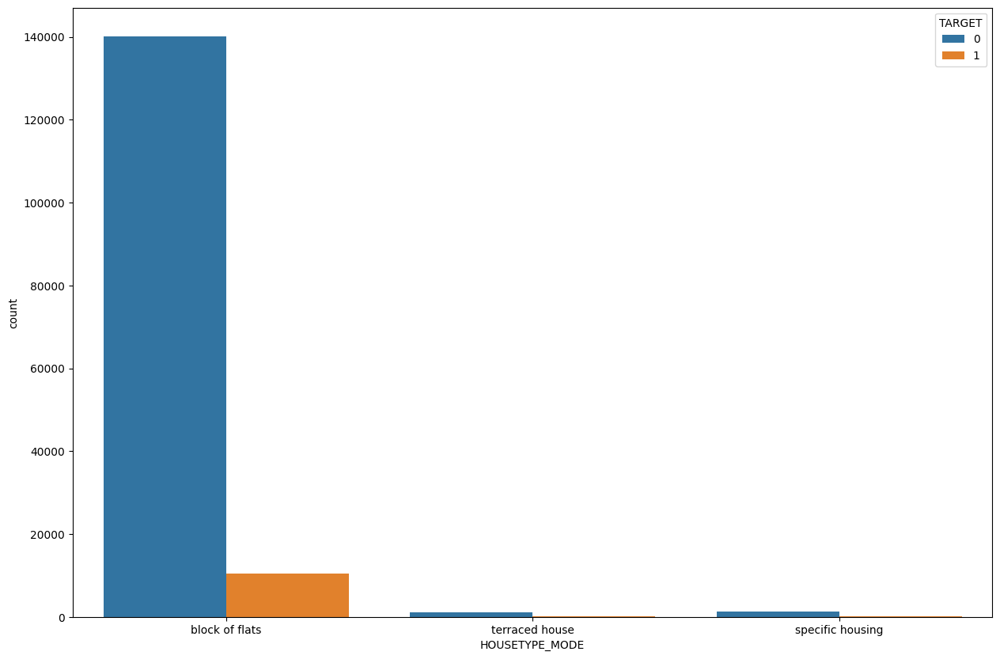




               Count      Ratio  TARGET_MEAN
NaN           156341        NaN          NaN
Panel          66040  21.475655     0.063477
Stone, brick   64815  21.077295     0.074057
Block           9253   3.008998     0.070247
Wooden          5362   1.743677     0.096979
Mixed           2296   0.746640     0.075348
Monolithic      1779   0.578516     0.047218
Others          1625   0.528436     0.083077





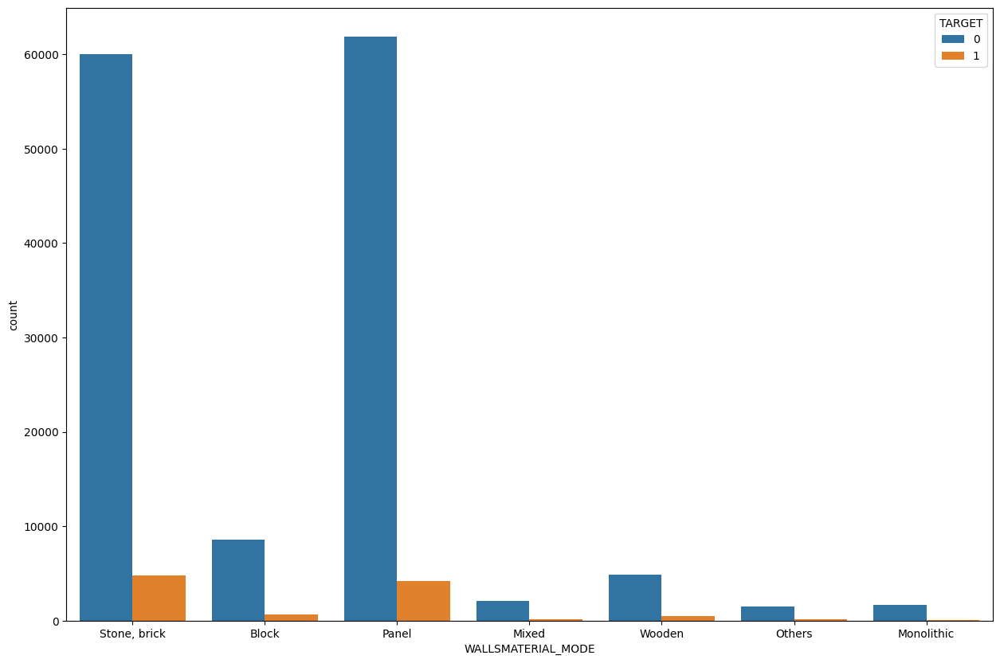




      Count      Ratio  TARGET_MEAN
No   159428  51.844649     0.069649
NaN  145755        NaN          NaN
Yes    2328   0.757046     0.095790





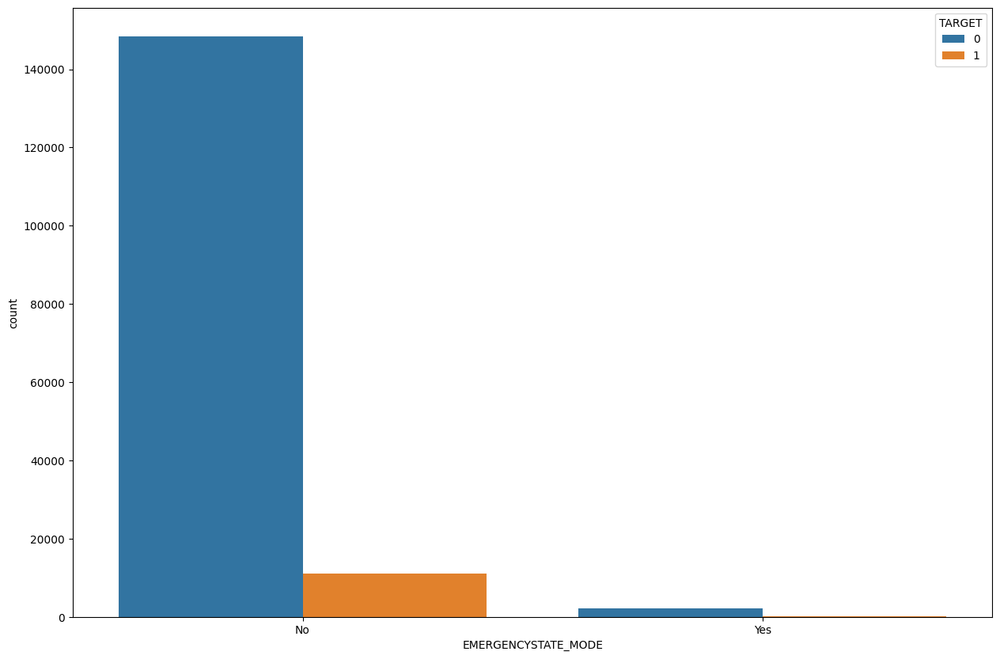

In [17]:
target_summary_with_cats(df, cats, "TARGET")

In [18]:
def target_summary_with_nums(dataframe, nums, target):
    for col in nums:
        print(col, end="\n\n")
        print(pd.DataFrame({"Count": dataframe.groupby(target)[col].count(),
                            "TARGET_MEAN": dataframe.groupby(target)[col].mean()}))
        fig, ax = plt.subplots(nrows=1, figsize=(12, 8))
        plt.subplots_adjust(hspace=0.4, top=0.8)
        g1 = sns.distplot(dataframe[col].loc[dataframe[target] == 1], ax=ax, color="g")
        g1 = sns.distplot(dataframe[col].loc[dataframe[target] == 0], ax=ax, color='r')
        g1.set_title(col + " Distribuition", fontsize=15)
        g1.set_xlabel(col)
        g1.set_xlabel("Frequency")
        plt.show()
        print("\n\n")
    print("\n\n")

CNT_CHILDREN

         Count  TARGET_MEAN
TARGET                     
0       282686     0.412946
1        24825     0.463807


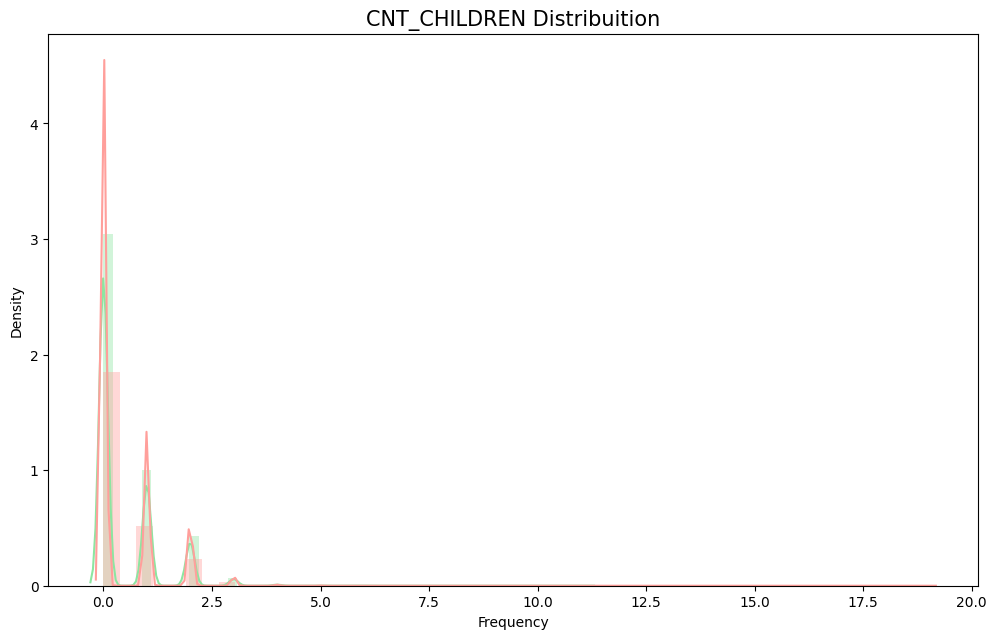




AMT_INCOME_TOTAL

         Count    TARGET_MEAN
TARGET                       
0       282686  169077.722266
1        24825  165611.760906


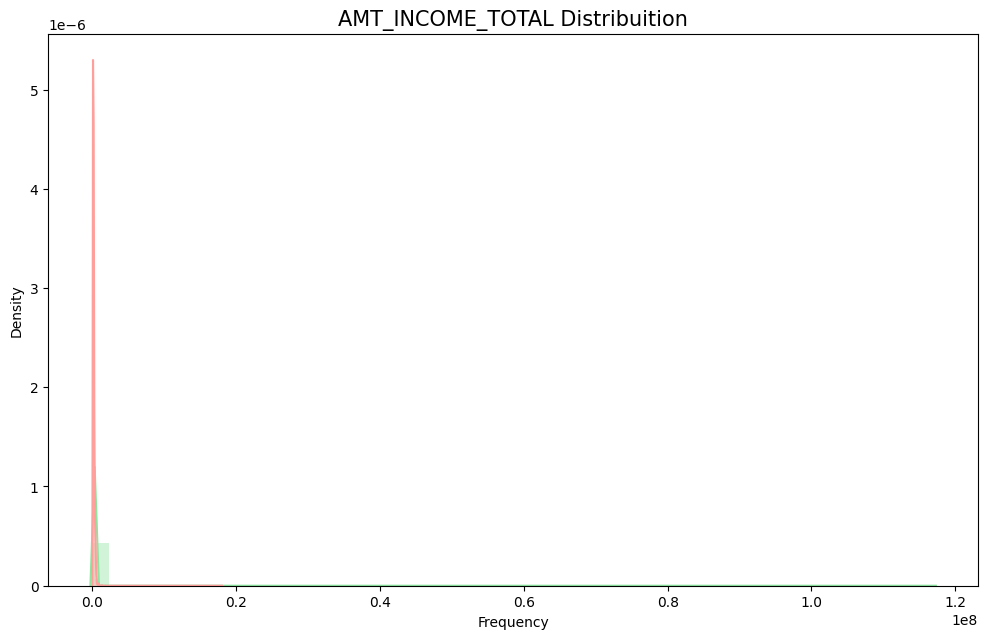




AMT_CREDIT

         Count    TARGET_MEAN
TARGET                       
0       282686  602648.282002
1        24825  557778.527674


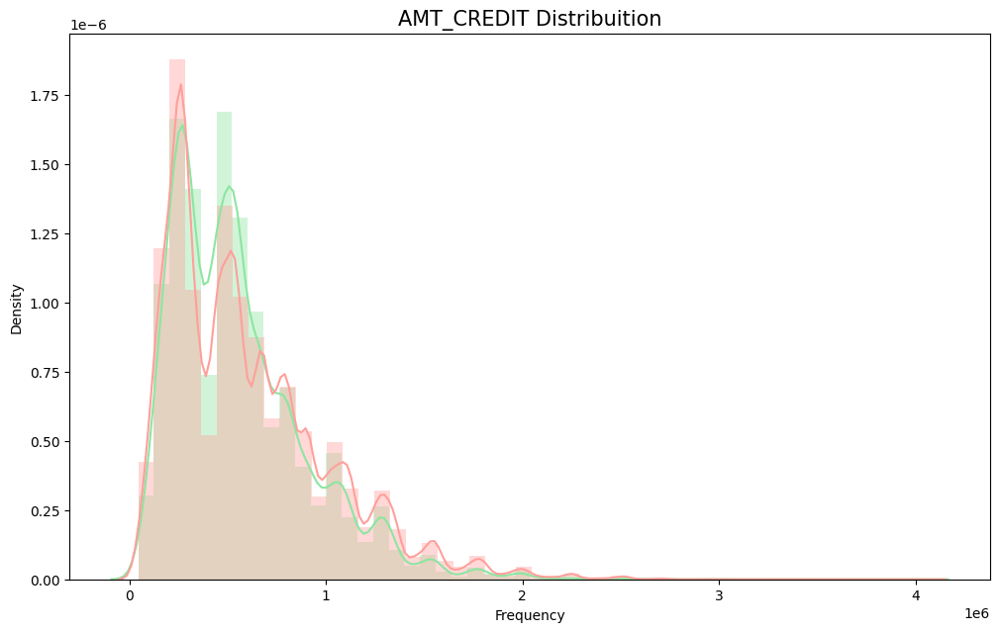




AMT_ANNUITY

         Count   TARGET_MEAN
TARGET                      
0       282674  27163.623349
1        24825  26481.744290


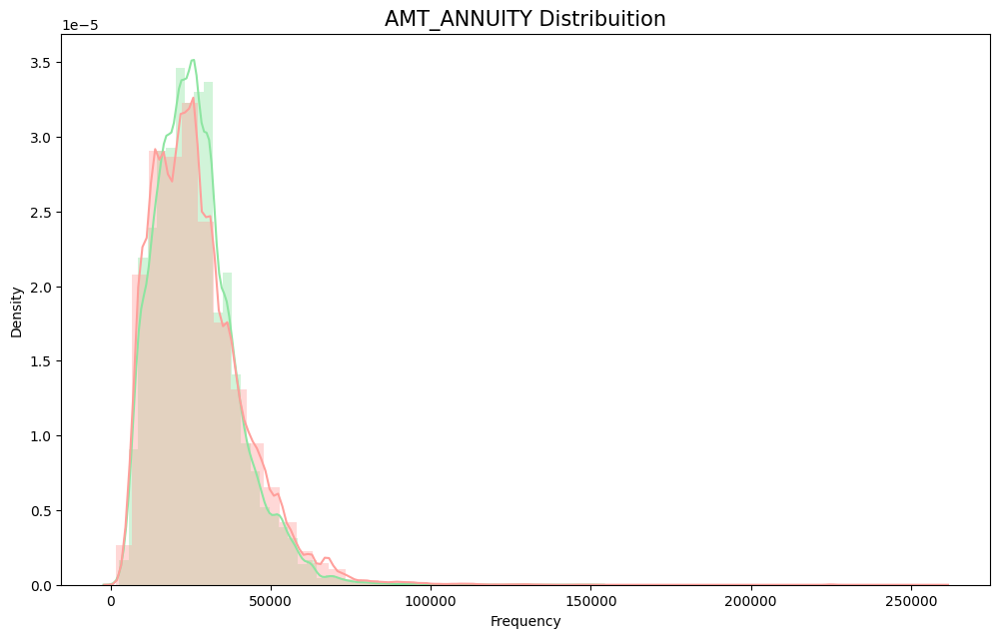




AMT_GOODS_PRICE

         Count    TARGET_MEAN
TARGET                       
0       282429  542736.795003
1        24804  488972.412554


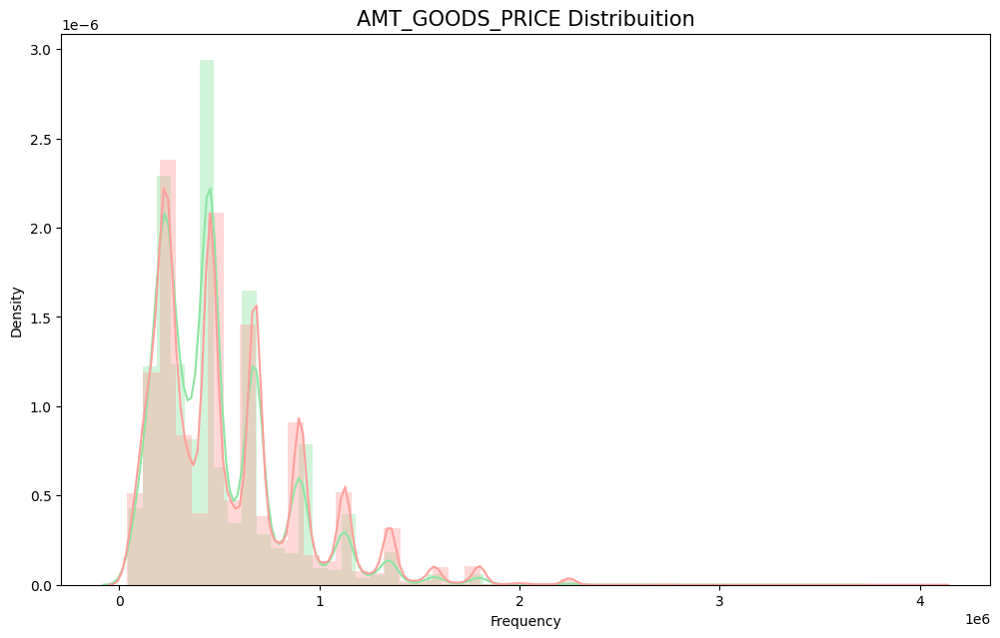




REGION_POPULATION_RELATIVE

         Count  TARGET_MEAN
TARGET                     
0       282686     0.021021
1        24825     0.019131


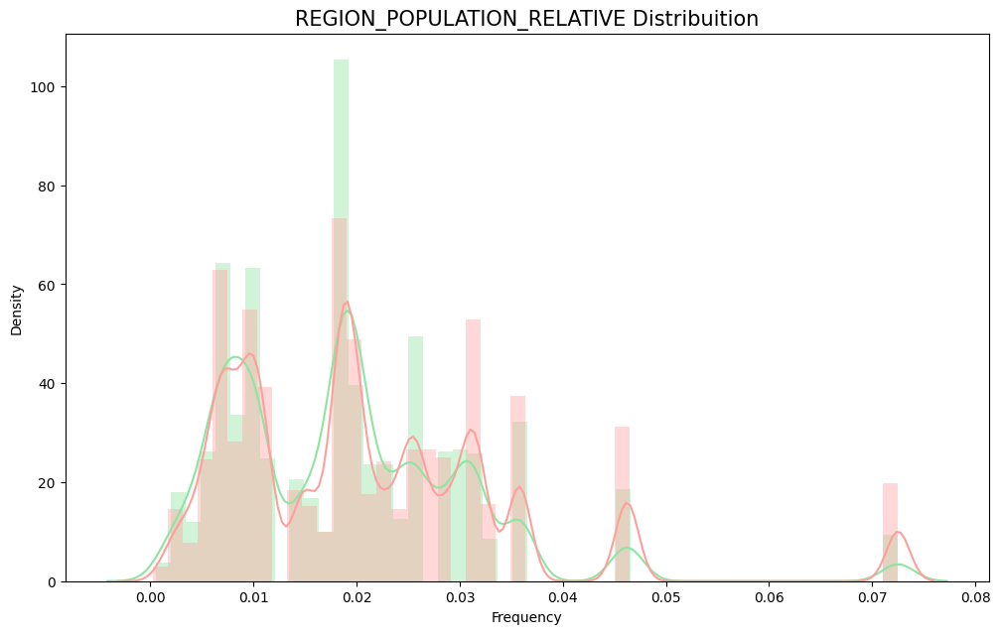




DAYS_BIRTH

         Count   TARGET_MEAN
TARGET                      
0       282686 -16138.176397
1        24825 -14884.828077


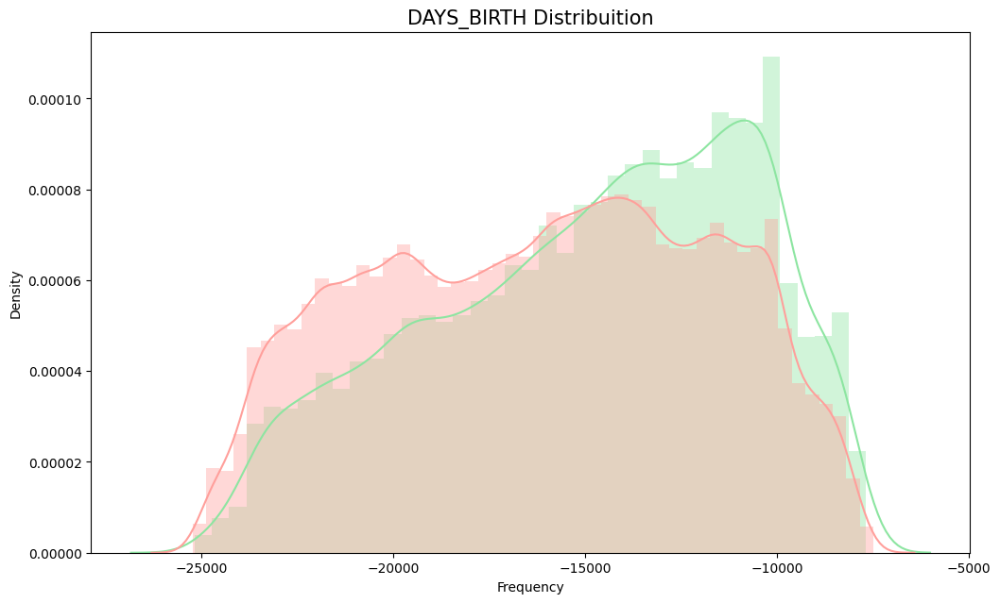




DAYS_EMPLOYED

         Count   TARGET_MEAN
TARGET                      
0       282686  65696.146123
1        24825  42394.675448


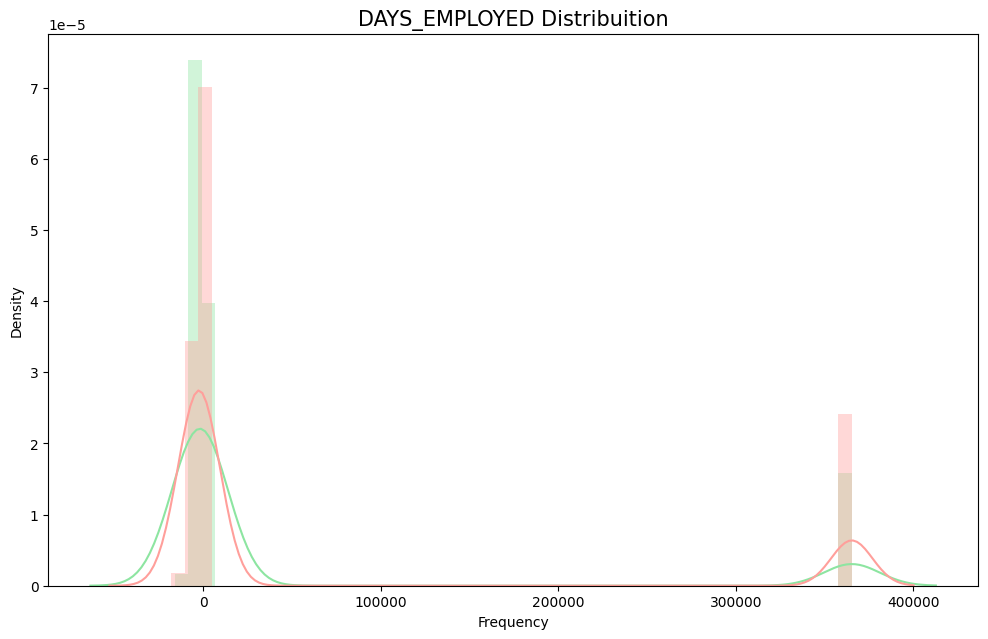




DAYS_REGISTRATION

         Count  TARGET_MEAN
TARGET                     
0       282686 -5029.941065
1        24825 -4487.127009


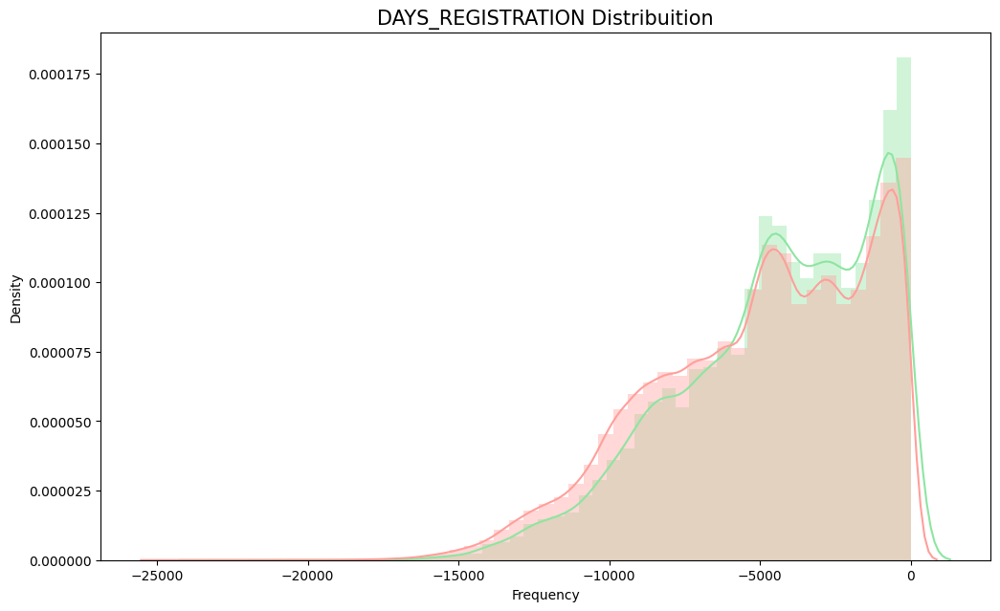




DAYS_ID_PUBLISH

         Count  TARGET_MEAN
TARGET                     
0       282686 -3017.219788
1        24825 -2732.099617


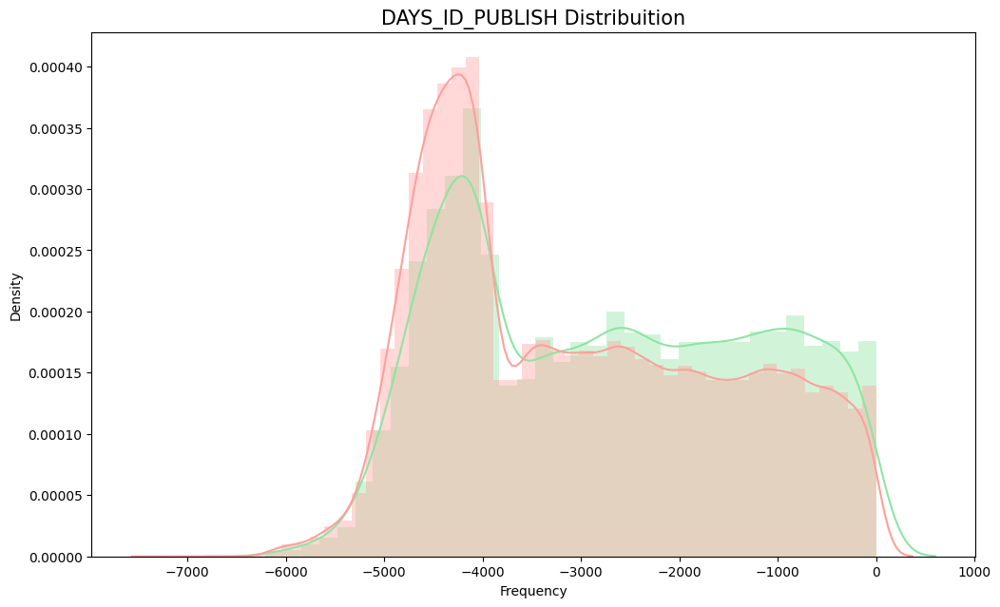




OWN_CAR_AGE

        Count  TARGET_MEAN
TARGET                    
0       97006    11.935540
1        7576    13.668691


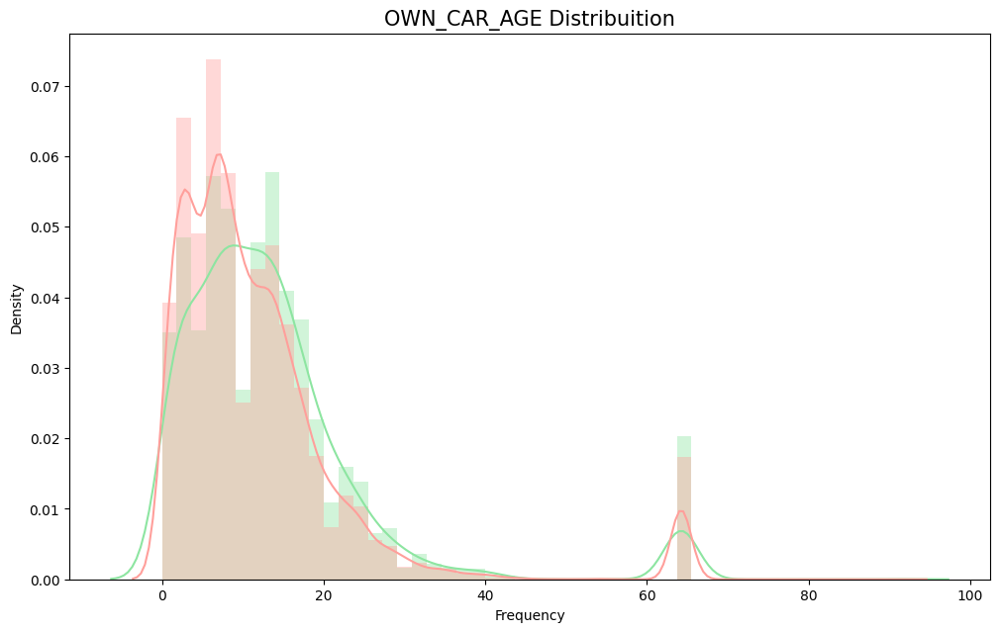




FLAG_MOBIL

         Count  TARGET_MEAN
TARGET                     
0       282686     0.999996
1        24825     1.000000


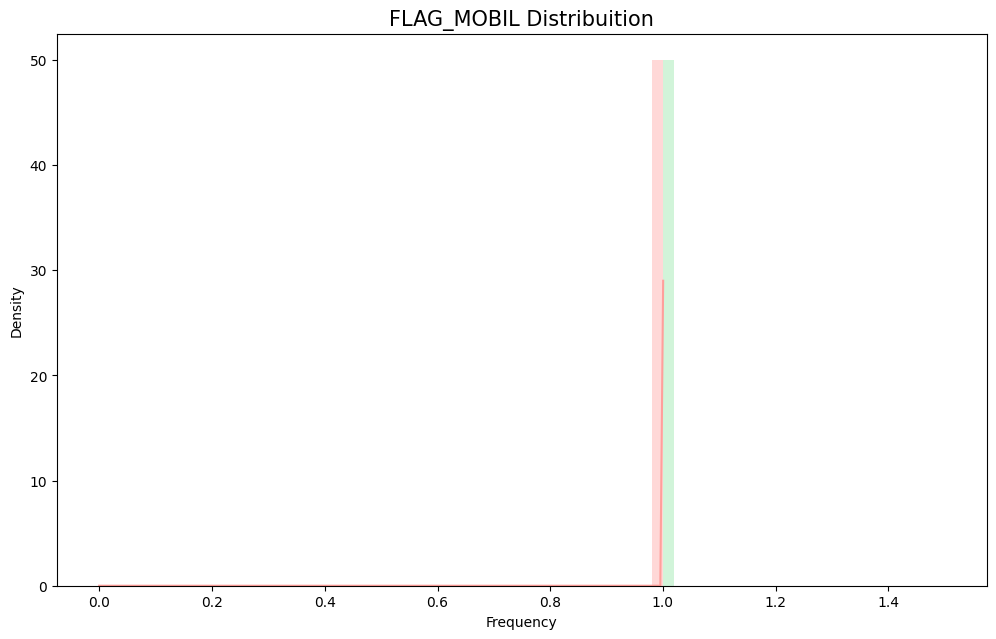




FLAG_EMP_PHONE

         Count  TARGET_MEAN
TARGET                     
0       282686     0.814653
1        24825     0.879517


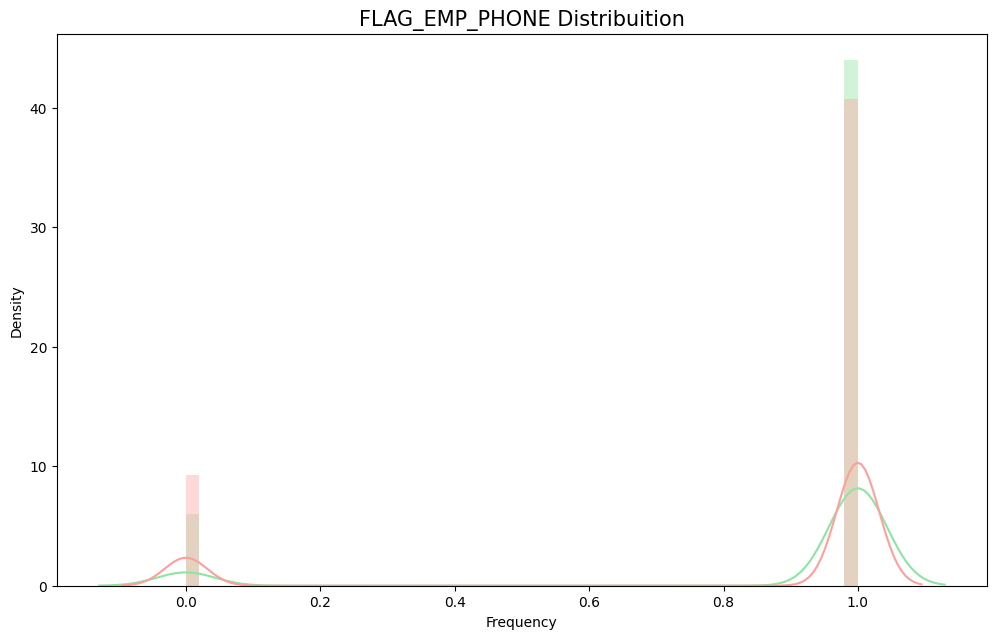




FLAG_WORK_PHONE

         Count  TARGET_MEAN
TARGET                     
0       282686     0.195991
1        24825     0.237825


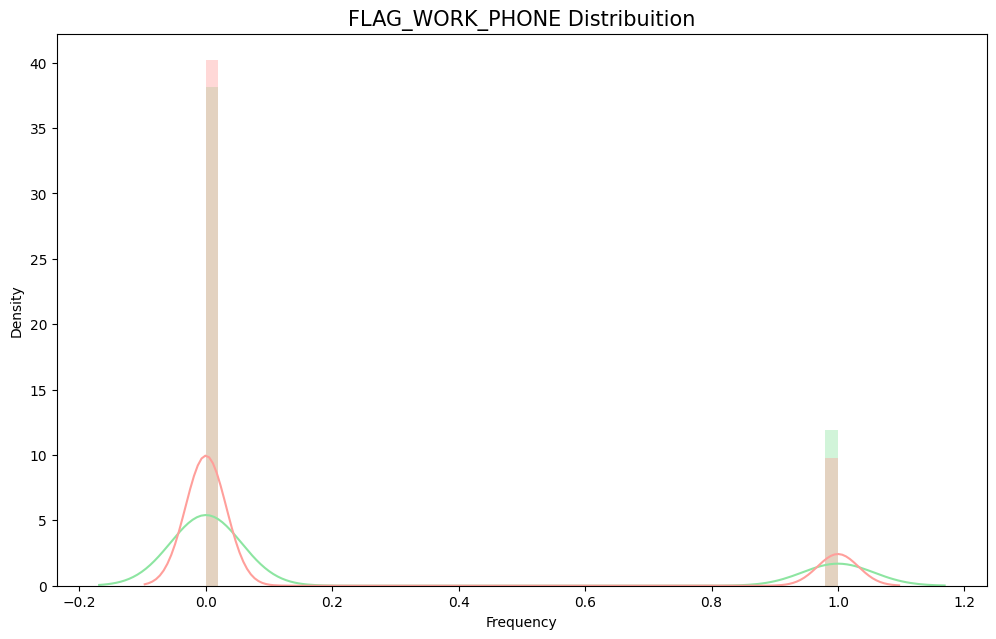




FLAG_CONT_MOBILE

         Count  TARGET_MEAN
TARGET                     
0       282686     0.998129
1        24825     0.998187


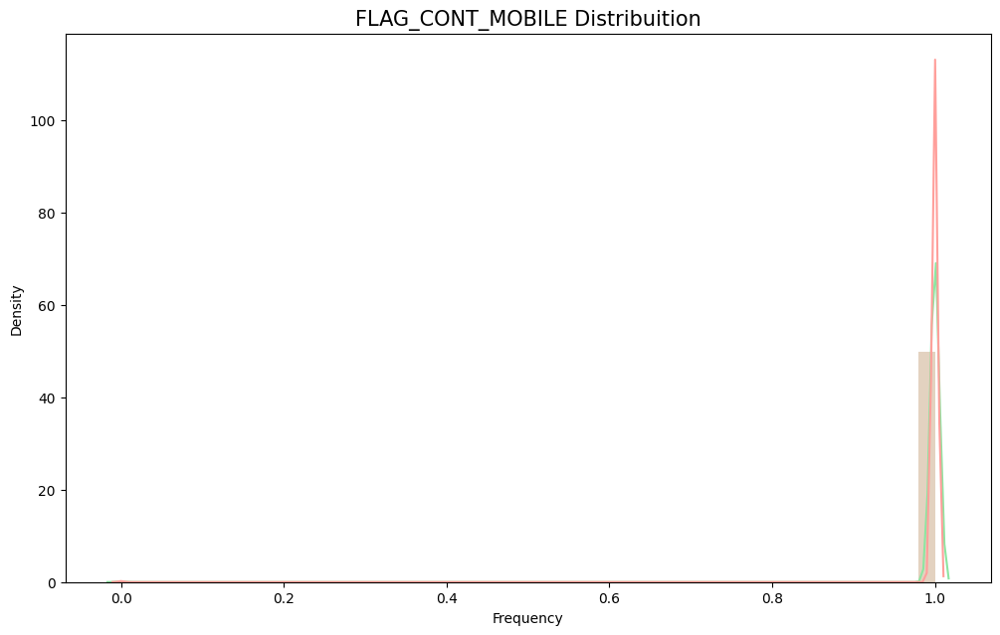




FLAG_PHONE

         Count  TARGET_MEAN
TARGET                     
0       282686     0.284238
1        24825     0.244955


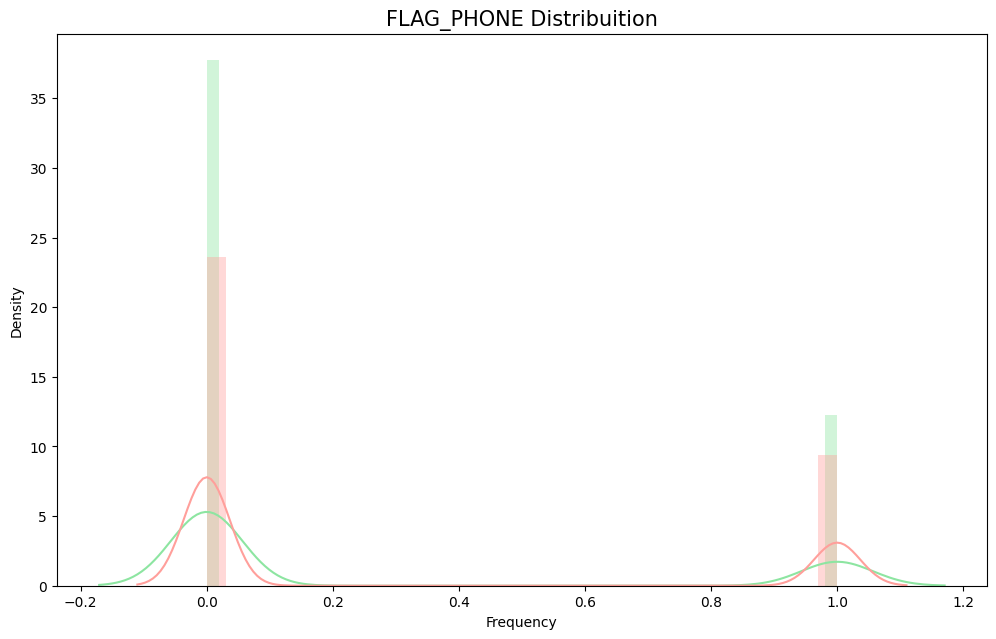




FLAG_EMAIL

         Count  TARGET_MEAN
TARGET                     
0       282686     0.056840
1        24825     0.055347


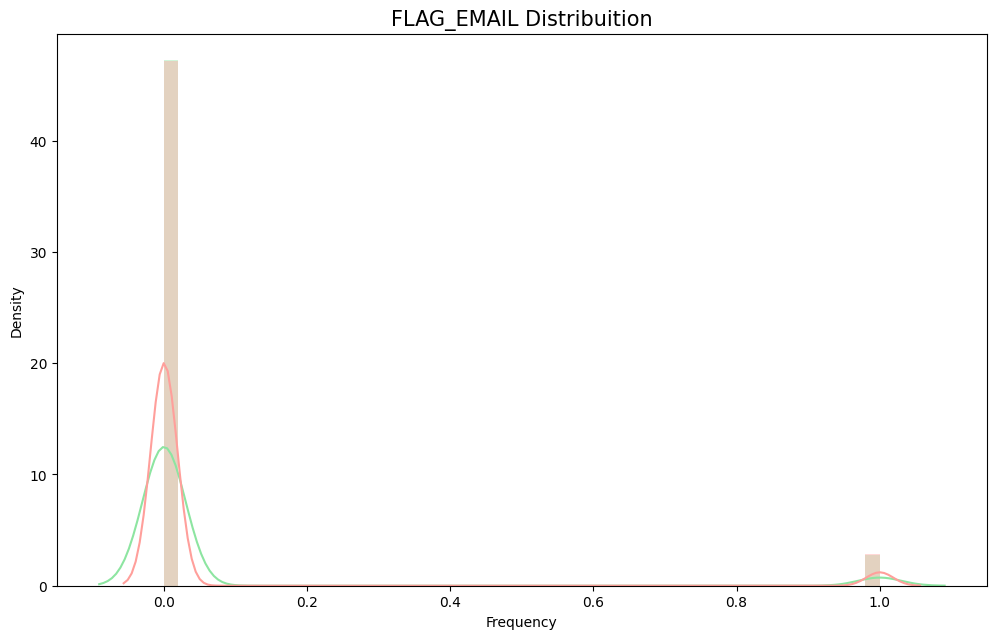




CNT_FAM_MEMBERS

         Count  TARGET_MEAN
TARGET                     
0       282684     2.150154
1        24825     2.181269


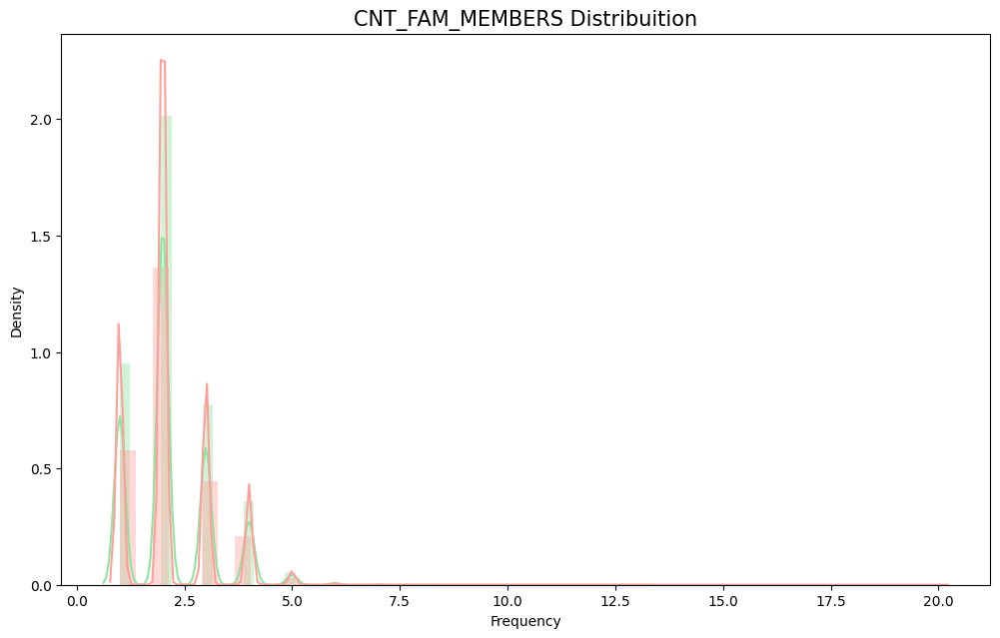




REGION_RATING_CLIENT

         Count  TARGET_MEAN
TARGET                     
0       282686     2.043578
1        24825     2.153635


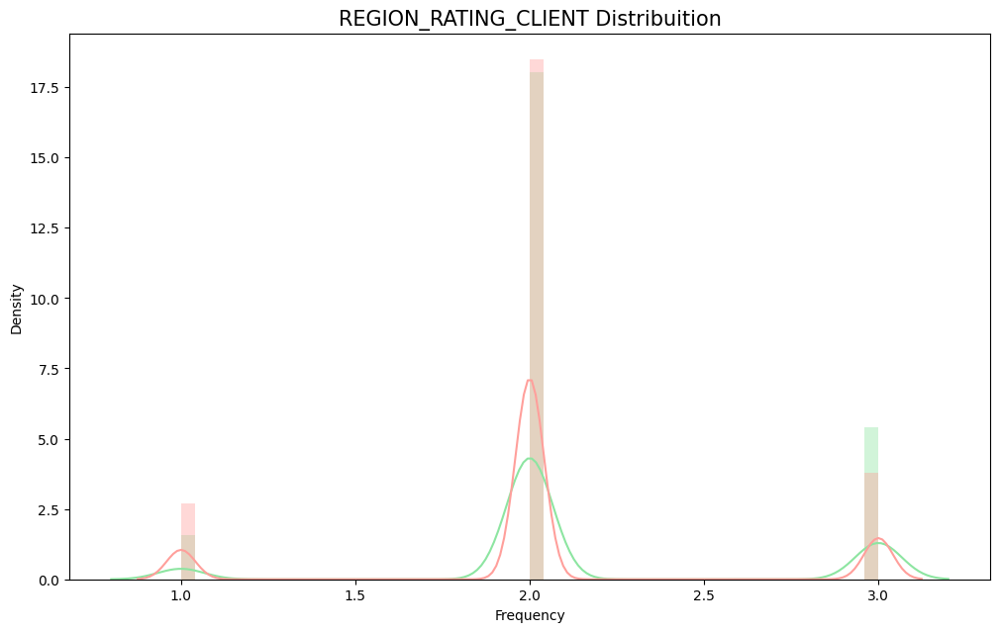




REGION_RATING_CLIENT_W_CITY

         Count  TARGET_MEAN
TARGET                     
0       282686     2.022449
1        24825     2.134824


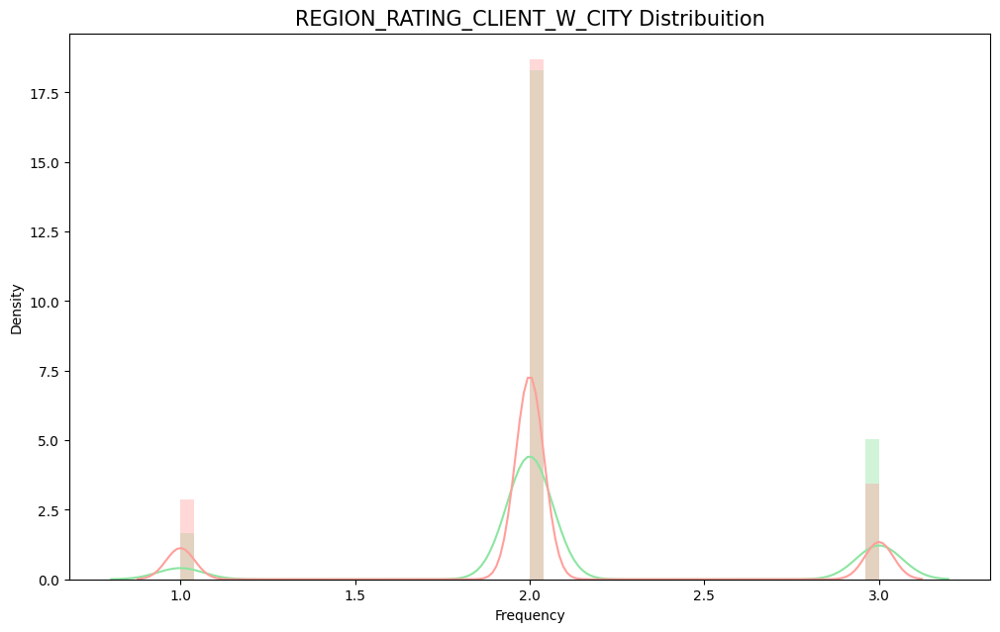




HOUR_APPR_PROCESS_START

         Count  TARGET_MEAN
TARGET                     
0       282686    12.086807
1        24825    11.797100


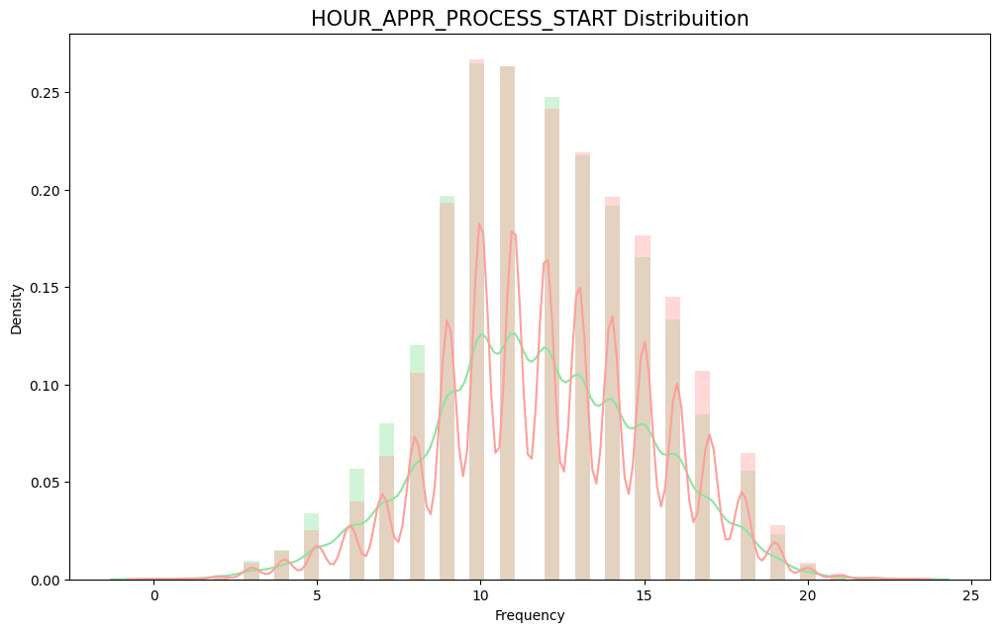




REG_REGION_NOT_LIVE_REGION

         Count  TARGET_MEAN
TARGET                     
0       282686     0.014942
1        24825     0.017442


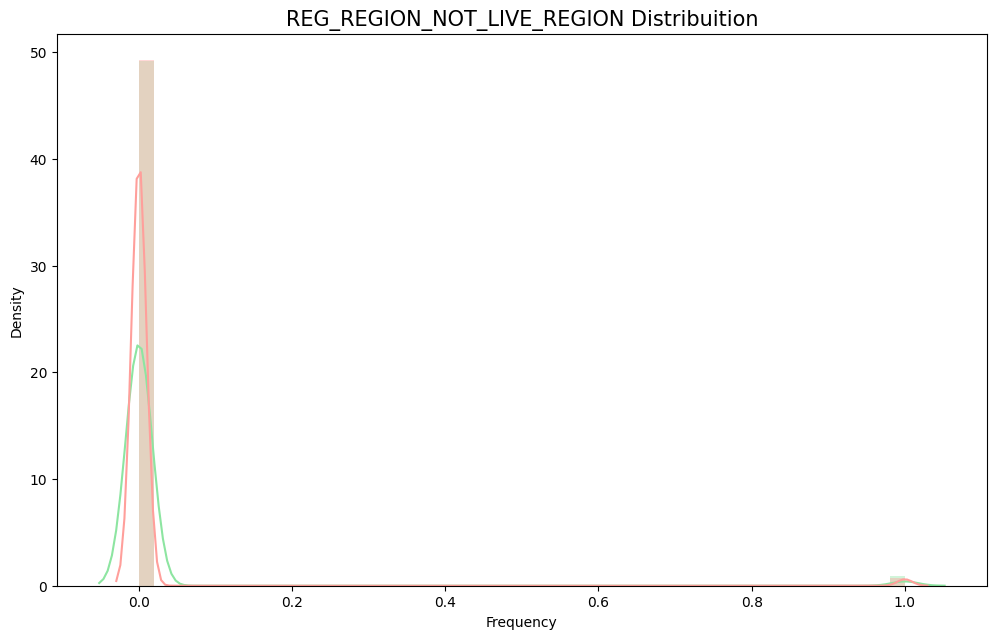




REG_REGION_NOT_WORK_REGION

         Count  TARGET_MEAN
TARGET                     
0       282686     0.050317
1        24825     0.055911


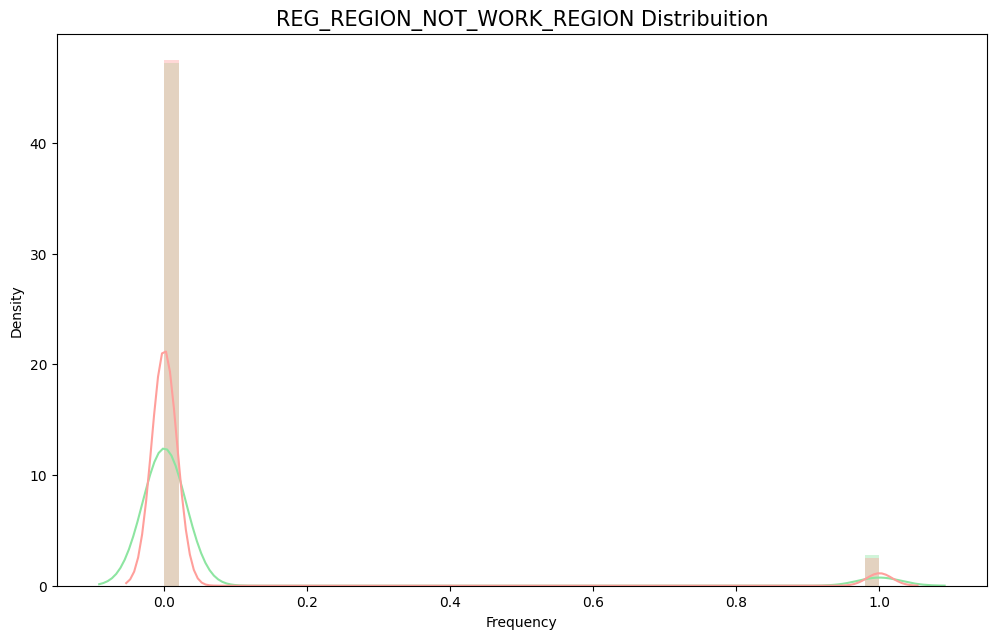




LIVE_REGION_NOT_WORK_REGION

         Count  TARGET_MEAN
TARGET                     
0       282686     0.040494
1        24825     0.042538


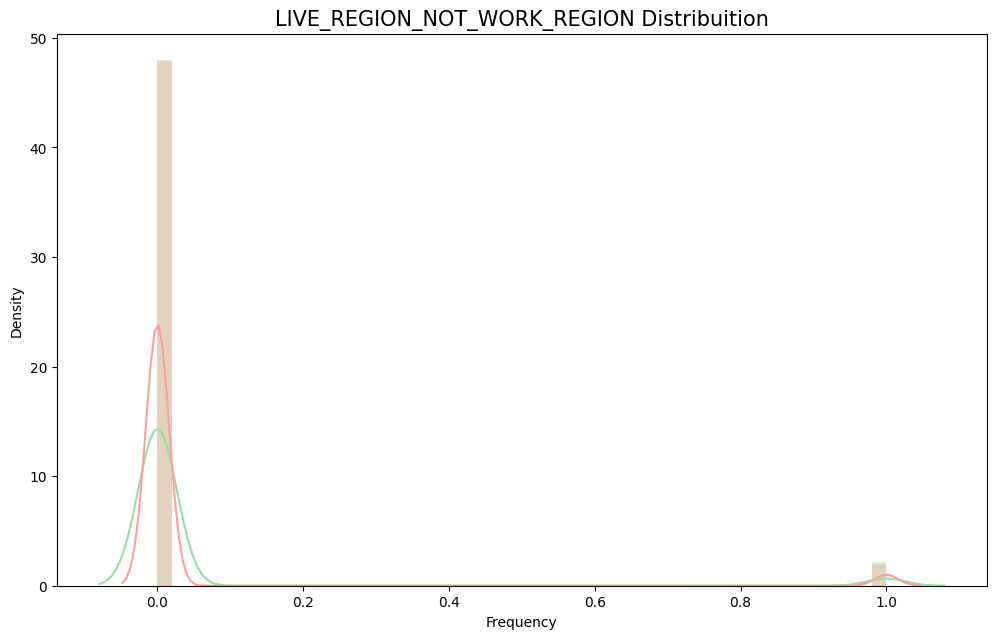




REG_CITY_NOT_LIVE_CITY

         Count  TARGET_MEAN
TARGET                     
0       282686     0.074641
1        24825     0.118389


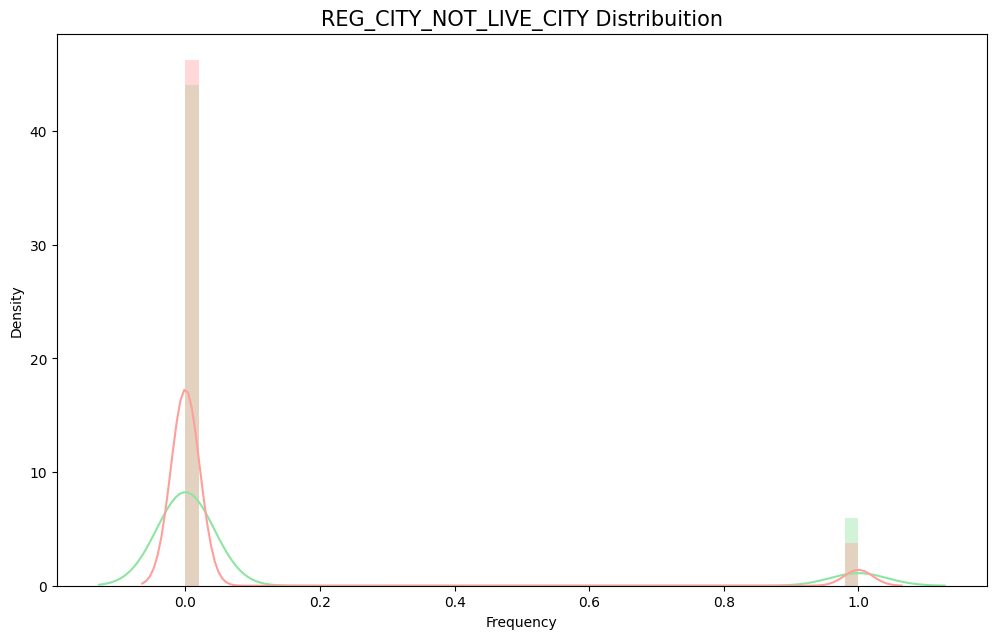




REG_CITY_NOT_WORK_CITY

         Count  TARGET_MEAN
TARGET                     
0       282686      0.22409
1        24825      0.30292


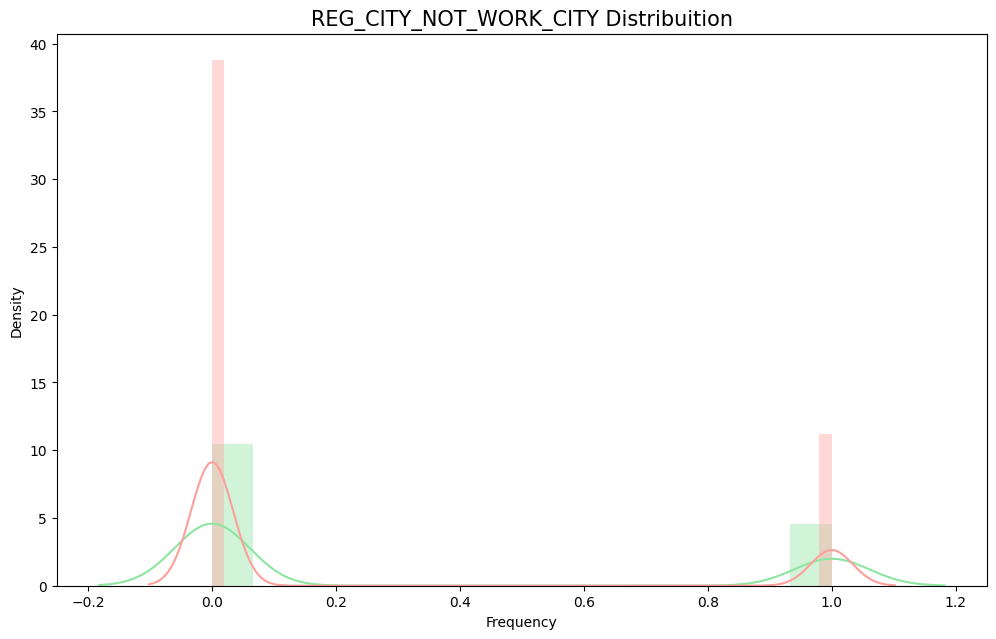




LIVE_CITY_NOT_WORK_CITY

         Count  TARGET_MEAN
TARGET                     
0       282686     0.175856
1        24825     0.221672


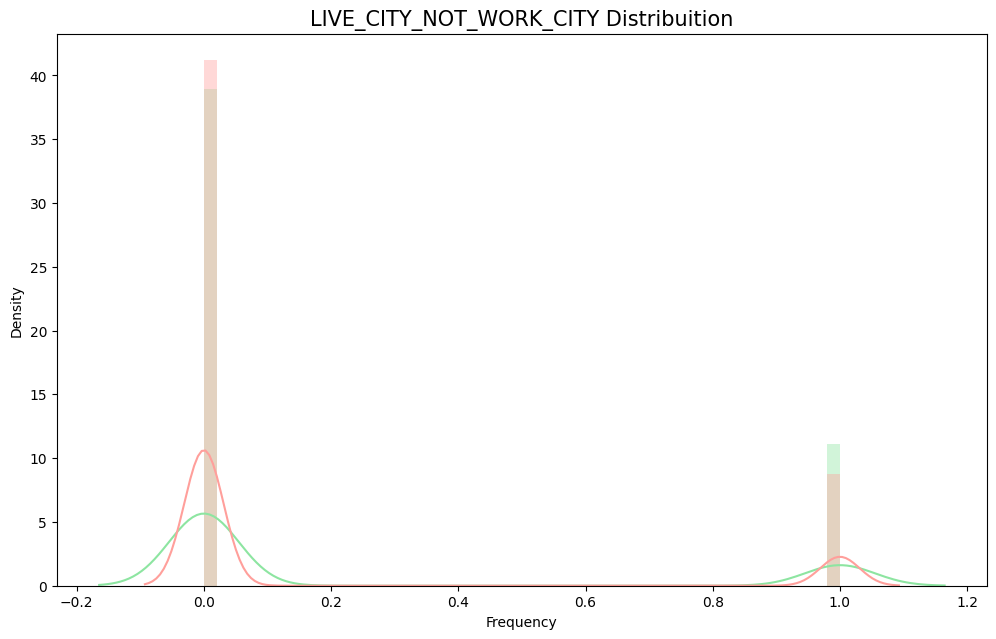




EXT_SOURCE_1

         Count  TARGET_MEAN
TARGET                     
0       124079     0.511461
1        10054     0.386968


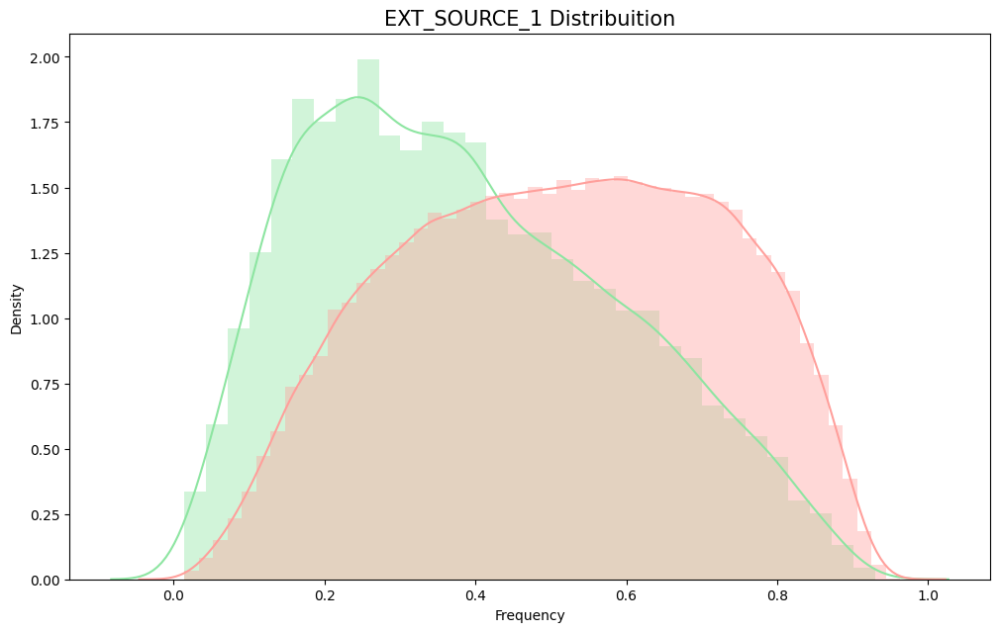




EXT_SOURCE_2

         Count  TARGET_MEAN
TARGET                     
0       282078     0.523479
1        24773     0.410935


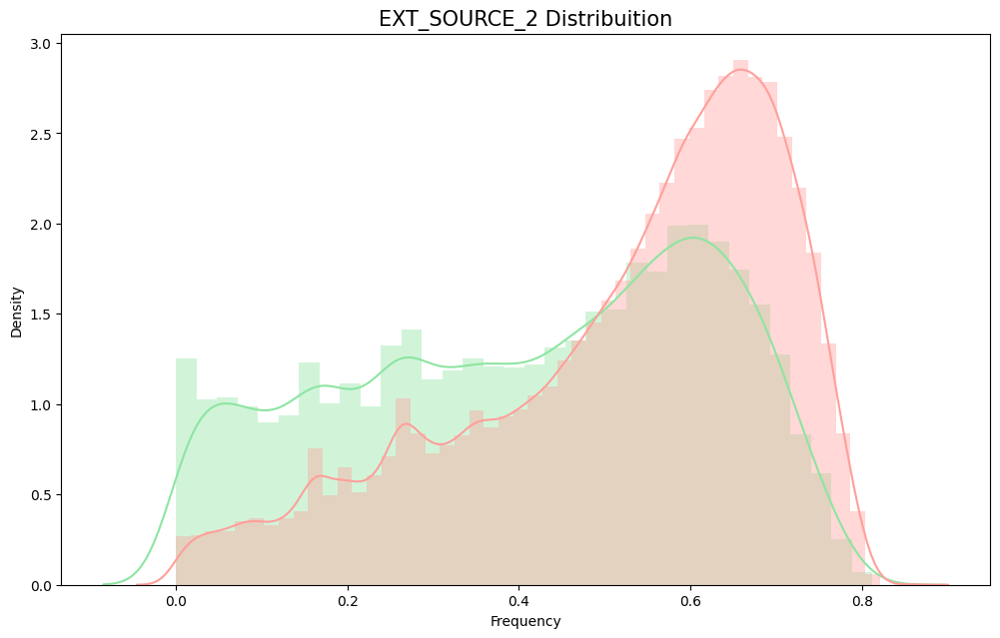




EXT_SOURCE_3

         Count  TARGET_MEAN
TARGET                     
0       227398     0.520969
1        19148     0.390717


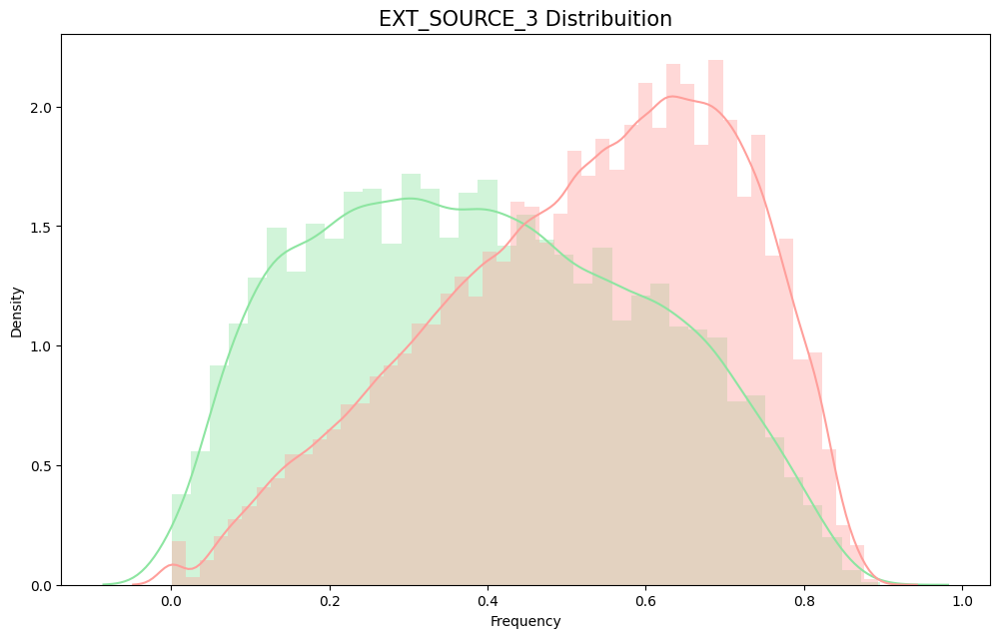




APARTMENTS_AVG

         Count  TARGET_MEAN
TARGET                     
0       140910     0.118314
1        10540     0.105766


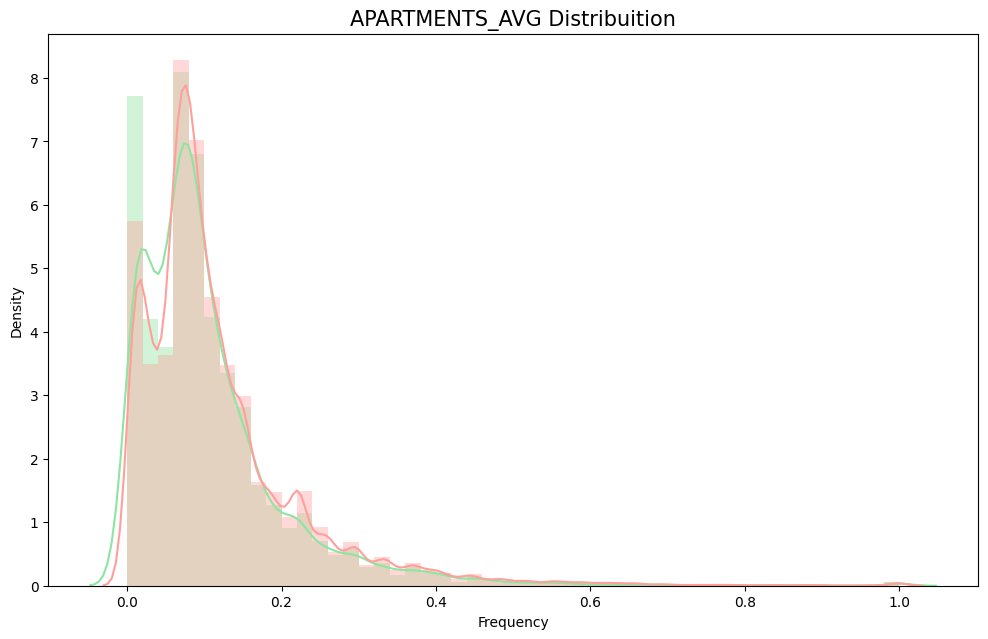




BASEMENTAREA_AVG

         Count  TARGET_MEAN
TARGET                     
0       118781     0.088952
1         8787     0.081548


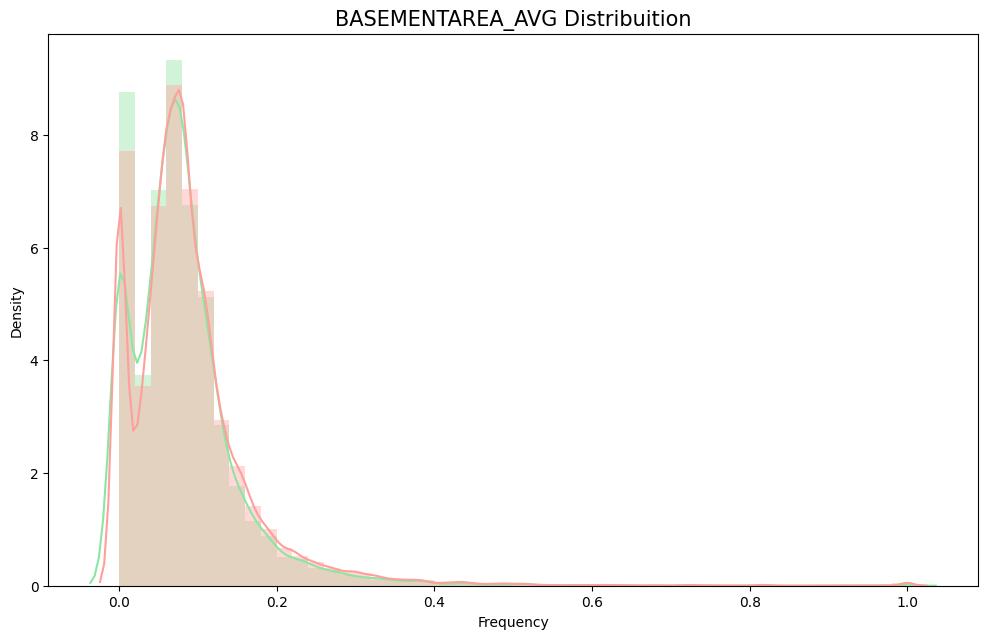




YEARS_BEGINEXPLUATATION_AVG

         Count  TARGET_MEAN
TARGET                     
0       146487     0.977893
1        11017     0.975634


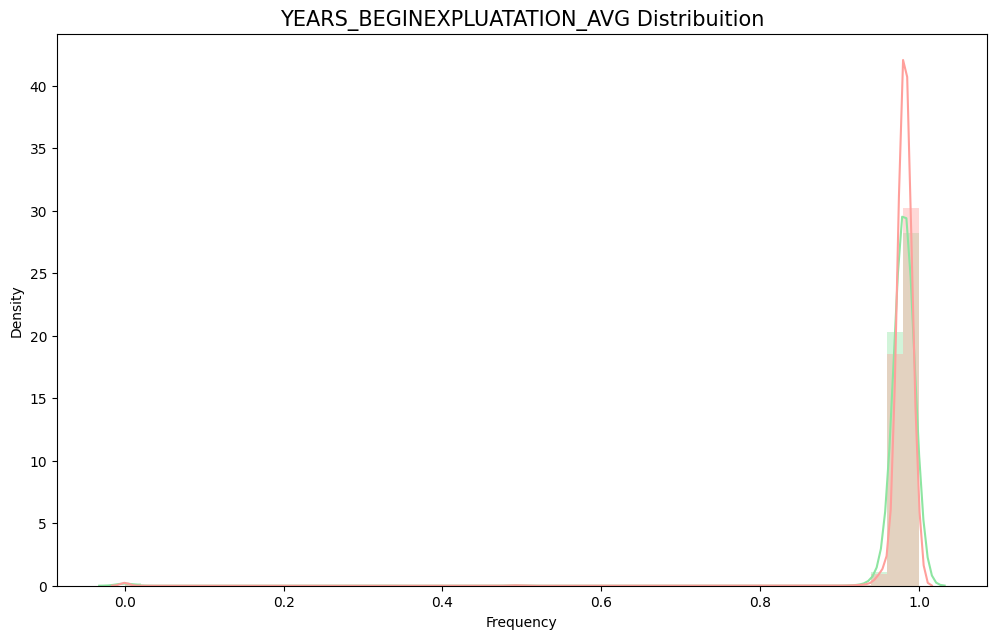




YEARS_BUILD_AVG

        Count  TARGET_MEAN
TARGET                    
0       95949     0.753153
1        7074     0.743231


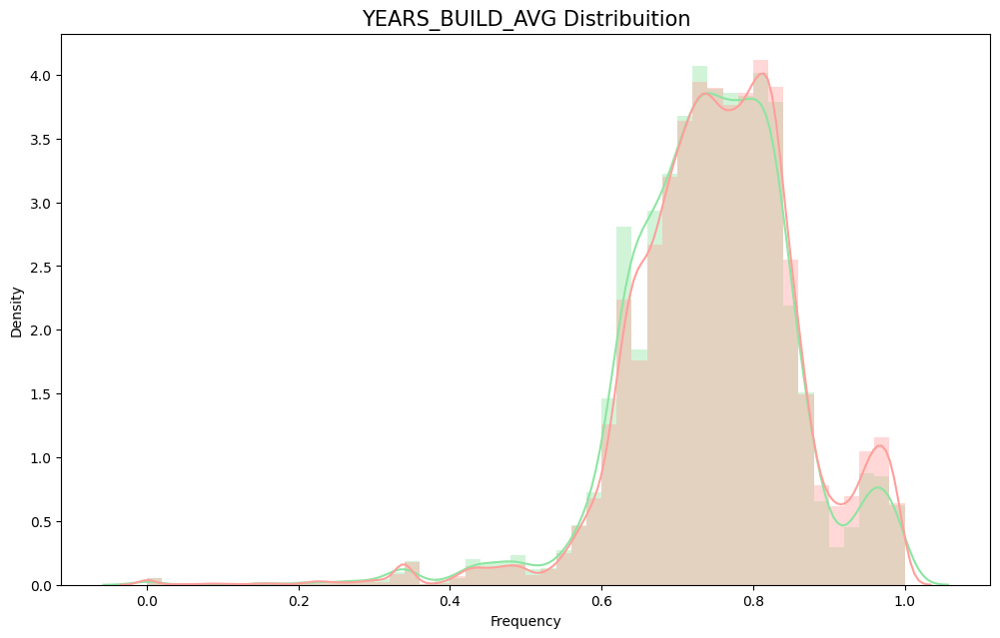




COMMONAREA_AVG

        Count  TARGET_MEAN
TARGET                    
0       86244     0.045005
1        6402     0.039444


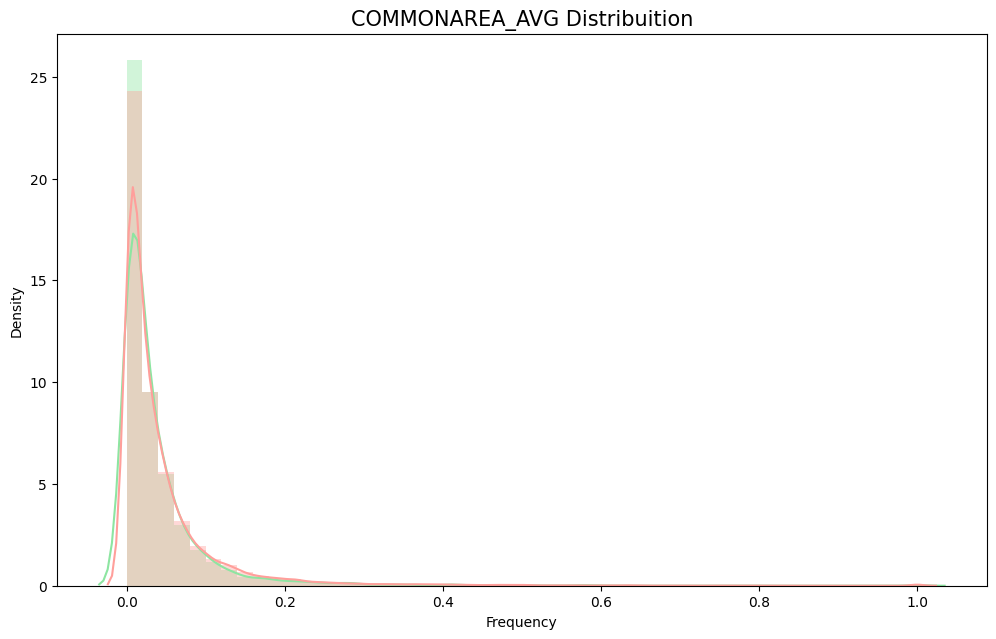




ELEVATORS_AVG

         Count  TARGET_MEAN
TARGET                     
0       133710     0.080194
1         9910     0.062036


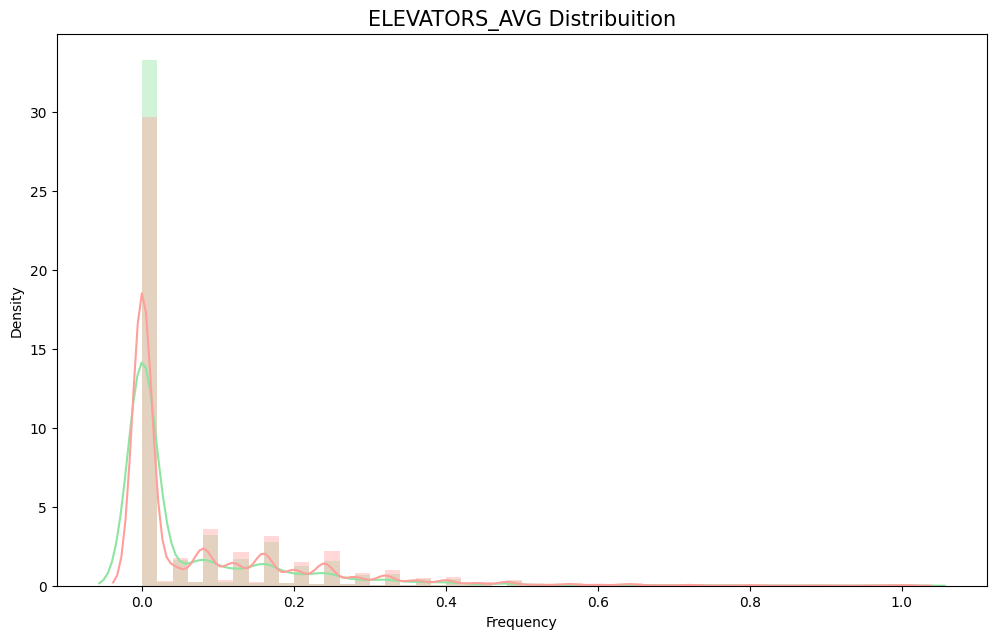




ENTRANCES_AVG

         Count  TARGET_MEAN
TARGET                     
0       142069     0.150249
1        10614     0.142707


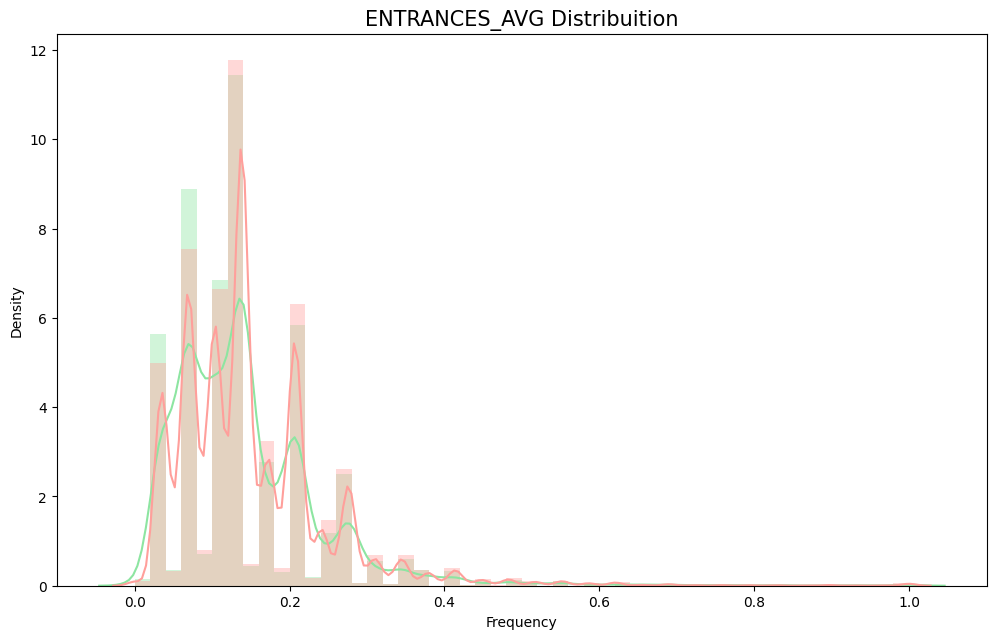




FLOORSMAX_AVG

         Count  TARGET_MEAN
TARGET                     
0       143730     0.228023
1        10761     0.203021


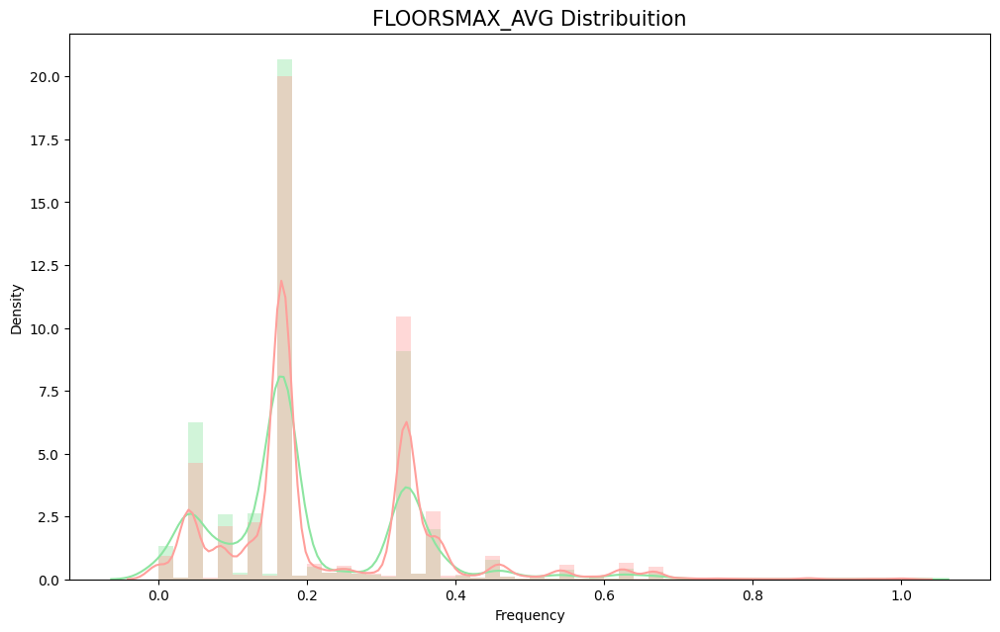




FLOORSMIN_AVG

        Count  TARGET_MEAN
TARGET                    
0       92052      0.23337
1        6817      0.21196


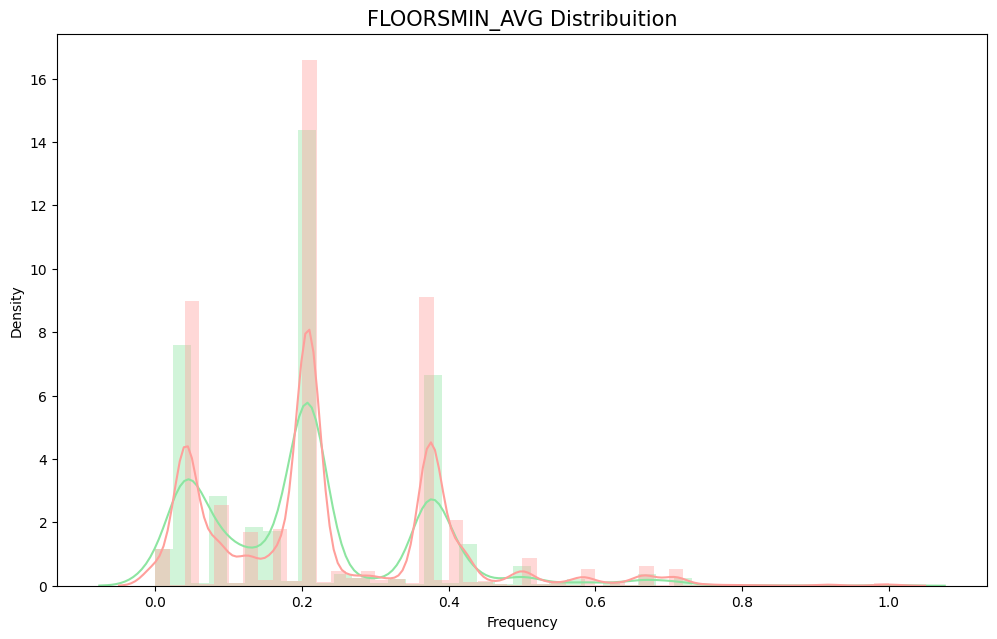




LANDAREA_AVG

         Count  TARGET_MEAN
TARGET                     
0       116200     0.066575
1         8721     0.063108


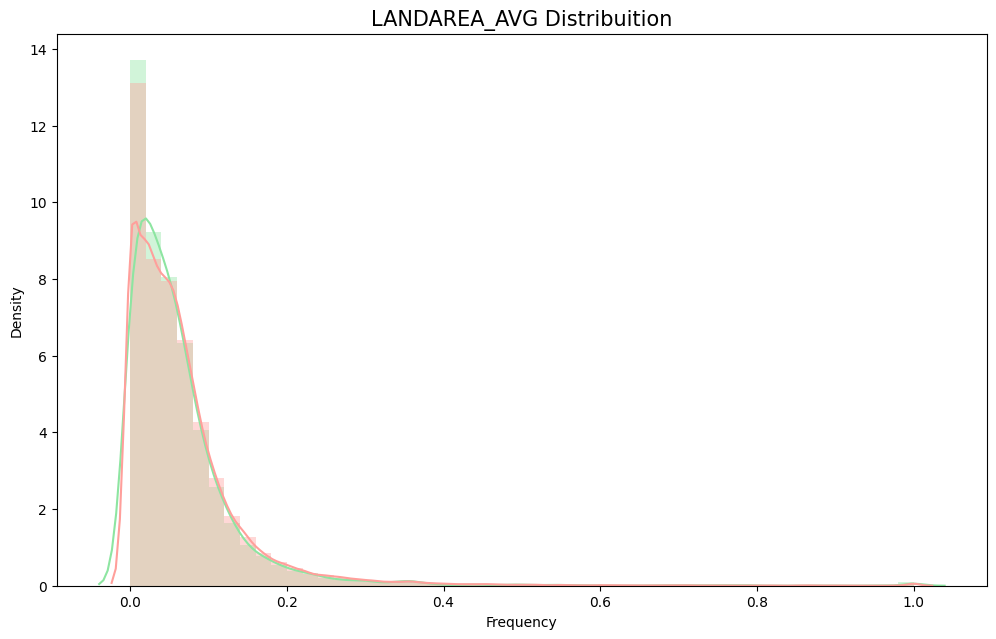




LIVINGAPARTMENTS_AVG

        Count  TARGET_MEAN
TARGET                    
0       90609     0.101405
1        6703     0.092255


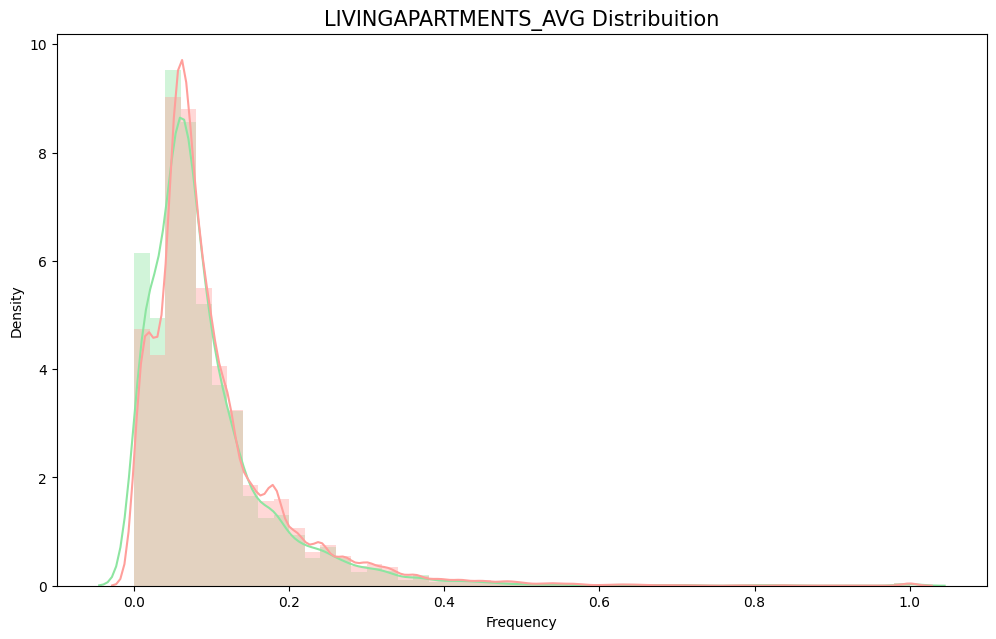




LIVINGAREA_AVG

         Count  TARGET_MEAN
TARGET                     
0       142447     0.108400
1        10714     0.094096


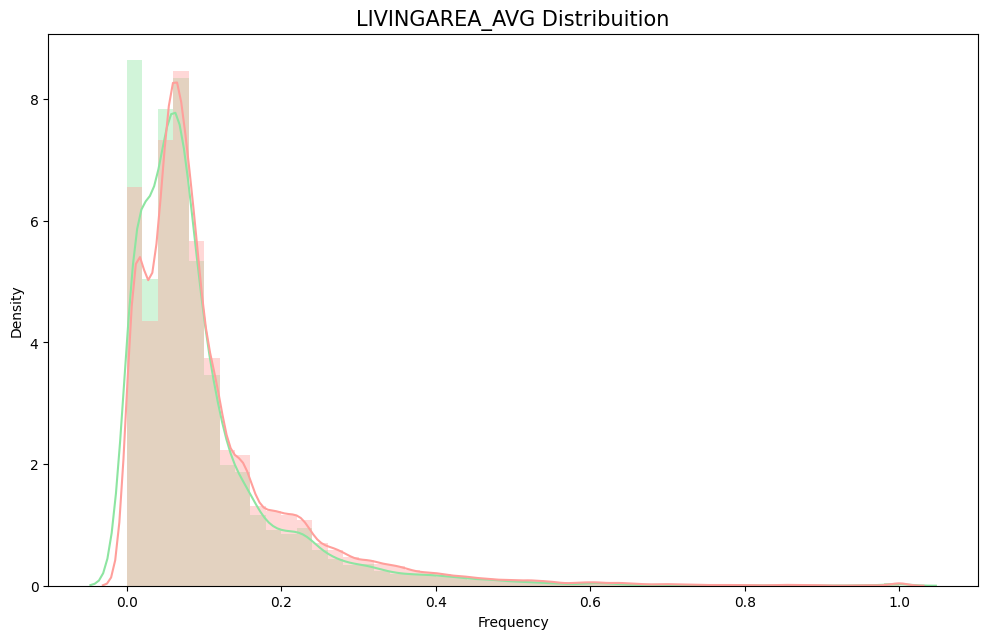




NONLIVINGAPARTMENTS_AVG

        Count  TARGET_MEAN
TARGET                    
0       87499     0.008850
1        6498     0.008252


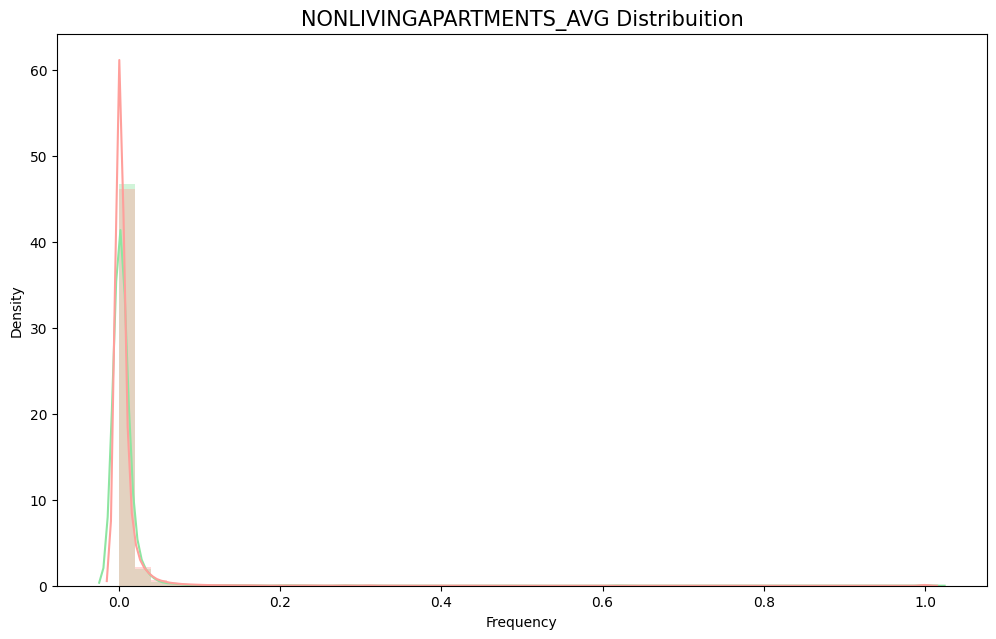




NONLIVINGAREA_AVG

         Count  TARGET_MEAN
TARGET                     
0       128334     0.028615
1         9495     0.024887


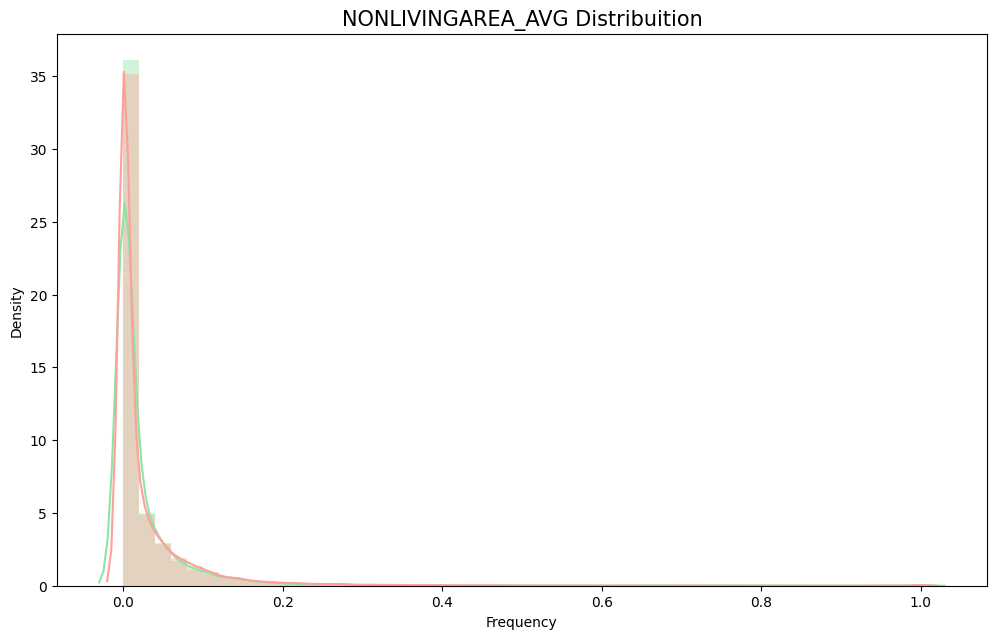




APARTMENTS_MODE

         Count  TARGET_MEAN
TARGET                     
0       140910     0.115036
1        10540     0.103463


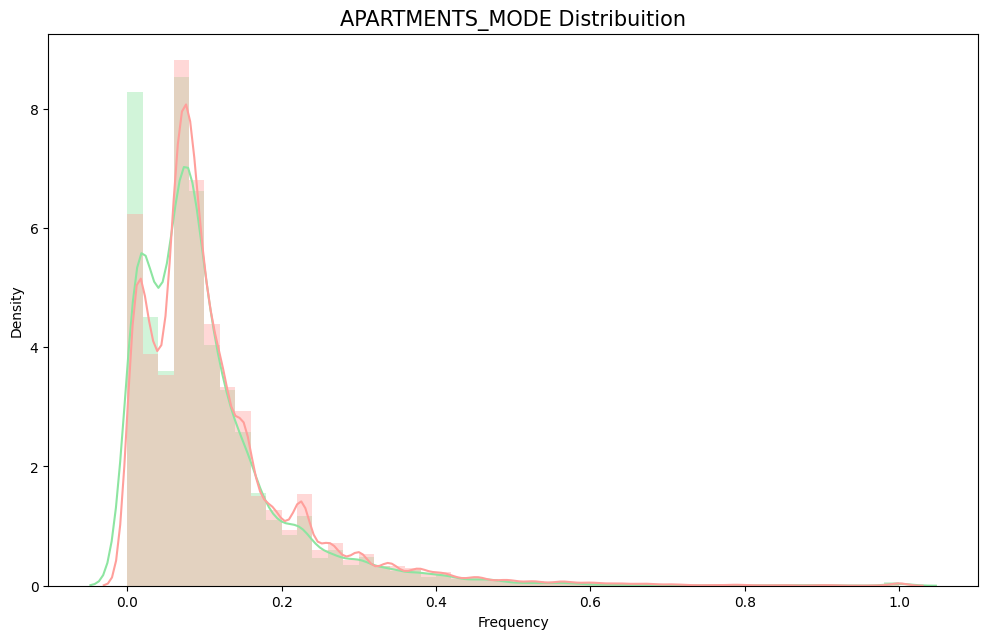




BASEMENTAREA_MODE

         Count  TARGET_MEAN
TARGET                     
0       118781     0.088001
1         8787     0.081359


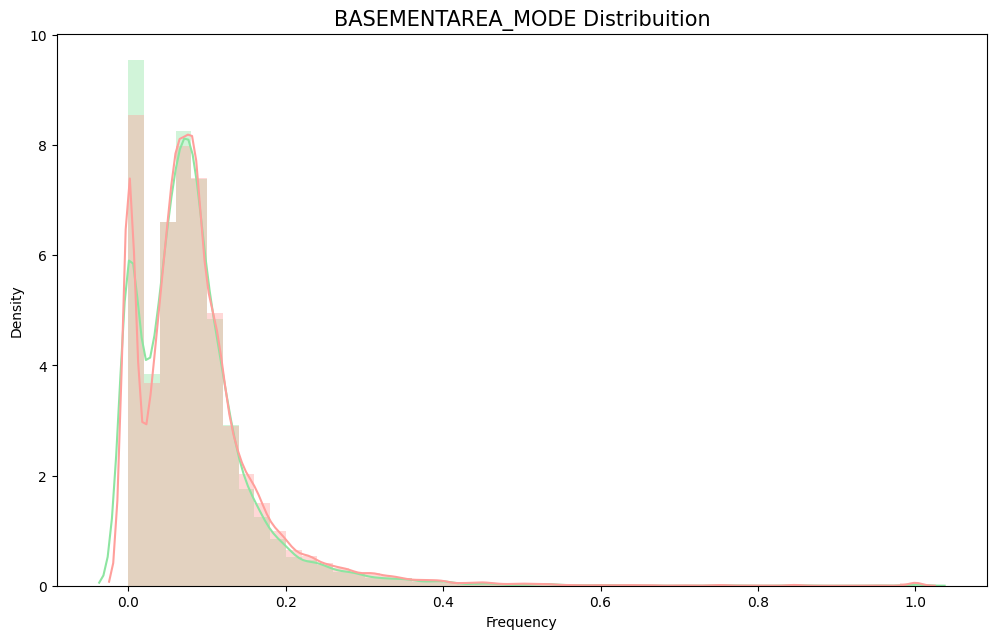




YEARS_BEGINEXPLUATATION_MODE

         Count  TARGET_MEAN
TARGET                     
0       146487     0.977225
1        11017     0.974938


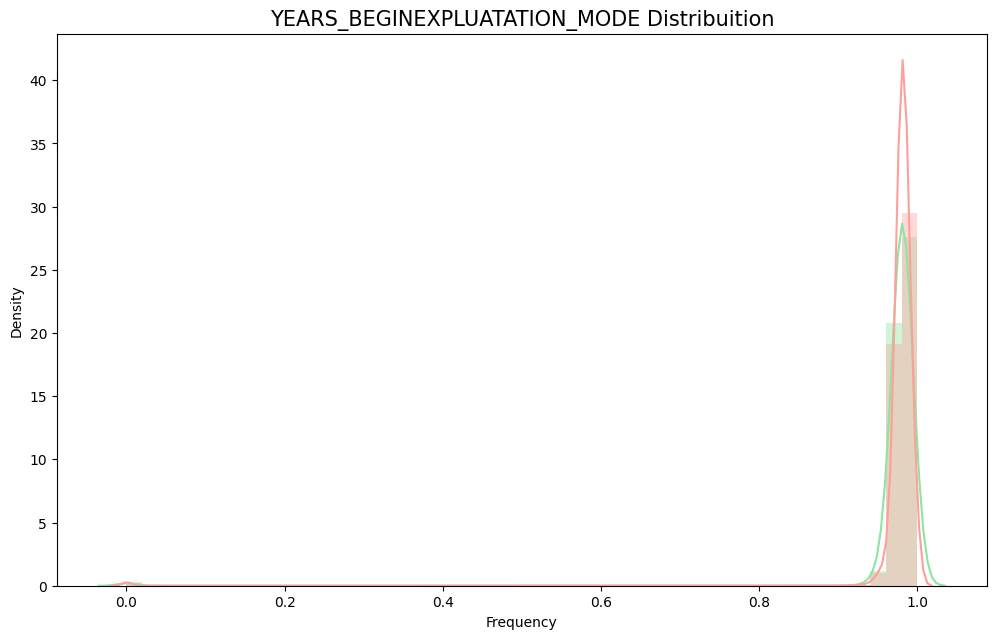




YEARS_BUILD_MODE

        Count  TARGET_MEAN
TARGET                    
0       95949     0.760297
1        7074     0.750688


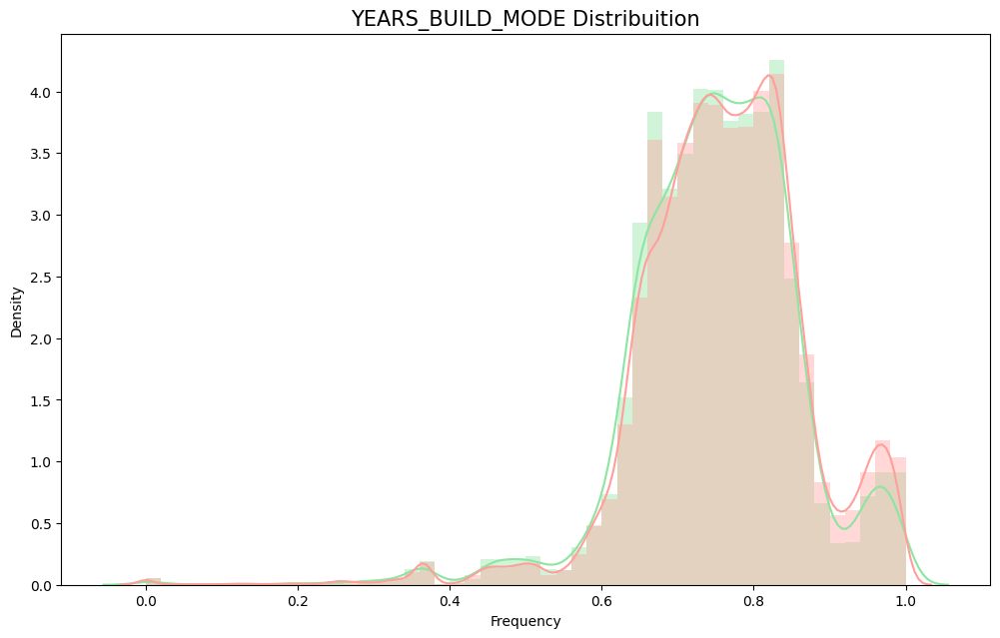




COMMONAREA_MODE

        Count  TARGET_MEAN
TARGET                    
0       86244     0.042885
1        6402     0.038088


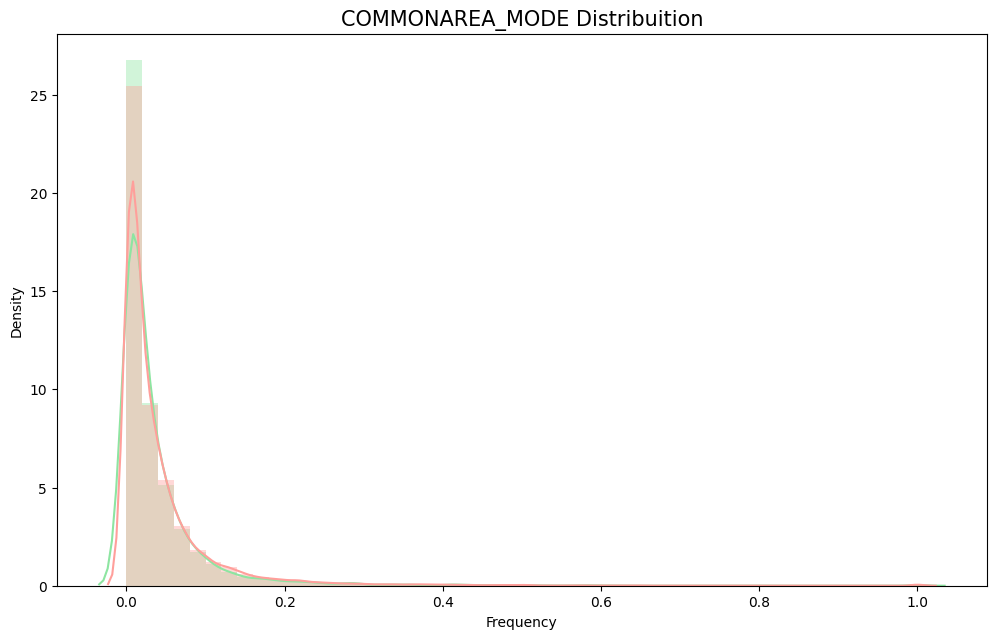




ELEVATORS_MODE

         Count  TARGET_MEAN
TARGET                     
0       133710     0.075647
1         9910     0.058880


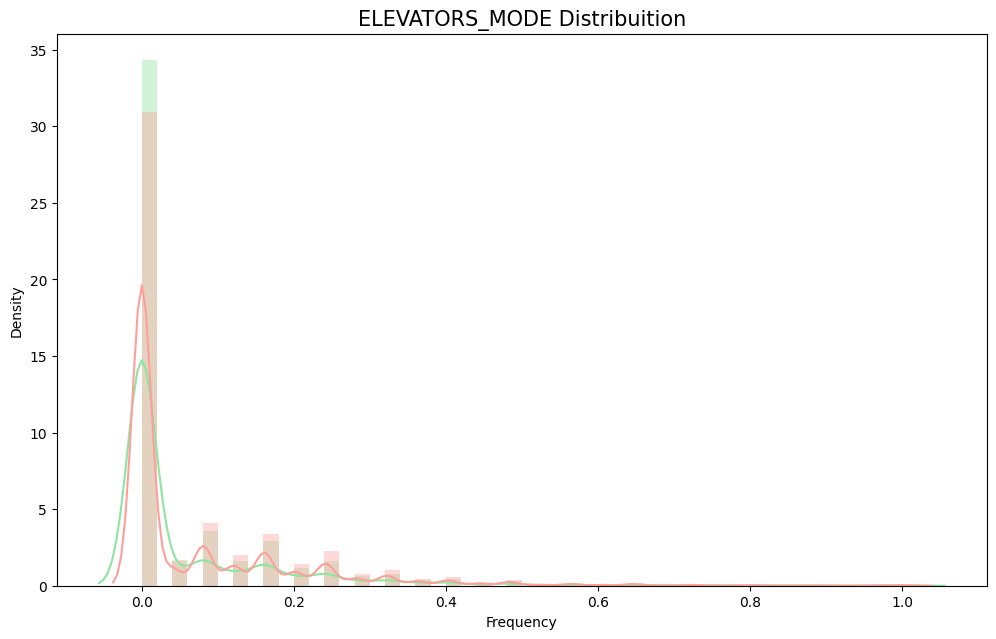




ENTRANCES_MODE

         Count  TARGET_MEAN
TARGET                     
0       142069     0.145673
1        10614     0.138769


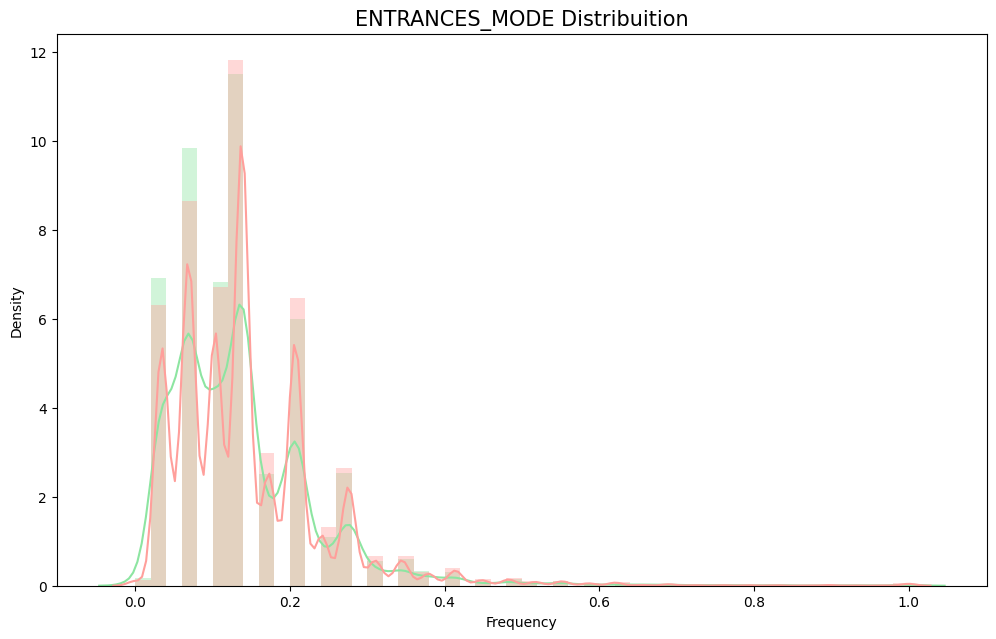




FLOORSMAX_MODE

         Count  TARGET_MEAN
TARGET                     
0       143730     0.224015
1        10761     0.199612


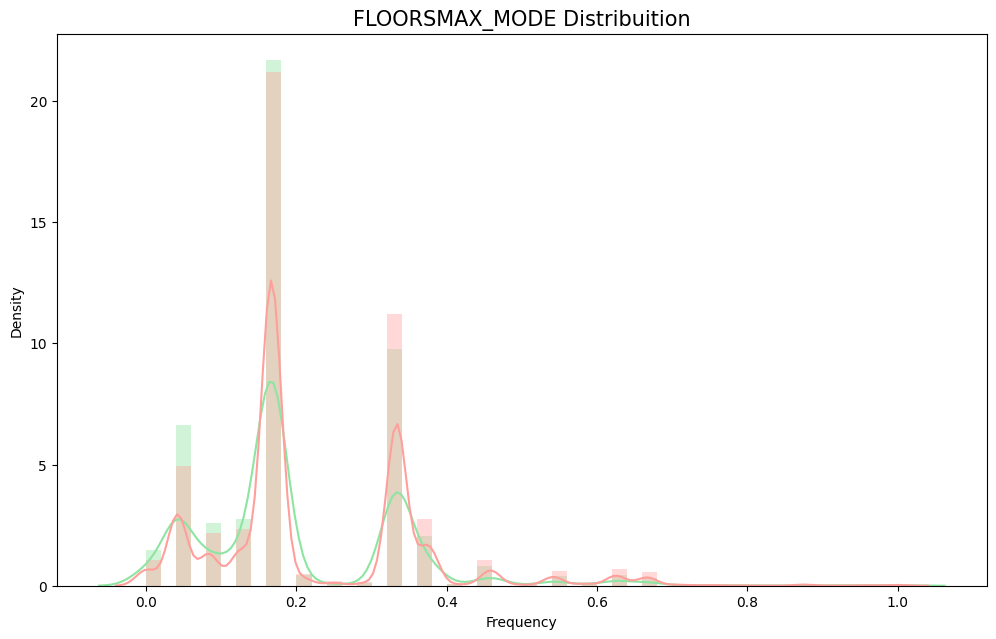




FLOORSMIN_MODE

        Count  TARGET_MEAN
TARGET                    
0       92052     0.229493
1        6817     0.208695


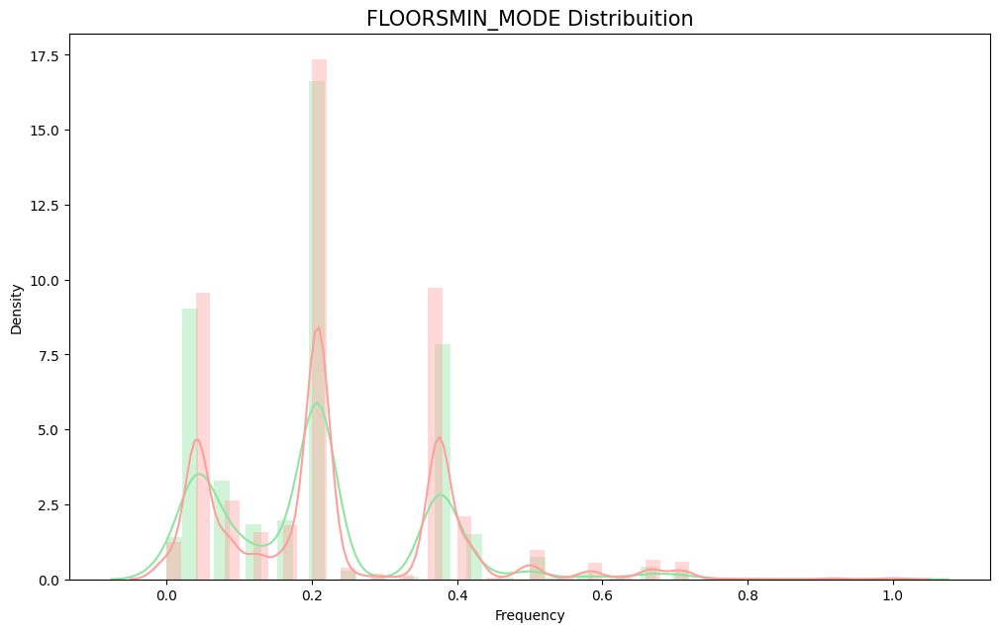




LANDAREA_MODE

         Count  TARGET_MEAN
TARGET                     
0       116200     0.065186
1         8721     0.061922


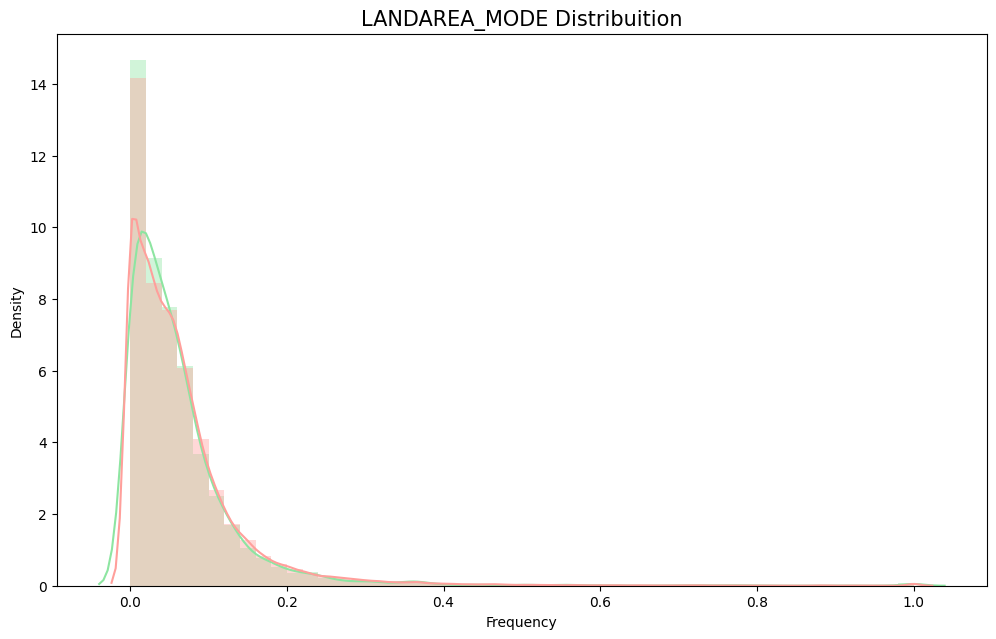




LIVINGAPARTMENTS_MODE

        Count  TARGET_MEAN
TARGET                    
0       90609     0.106268
1        6703     0.097226


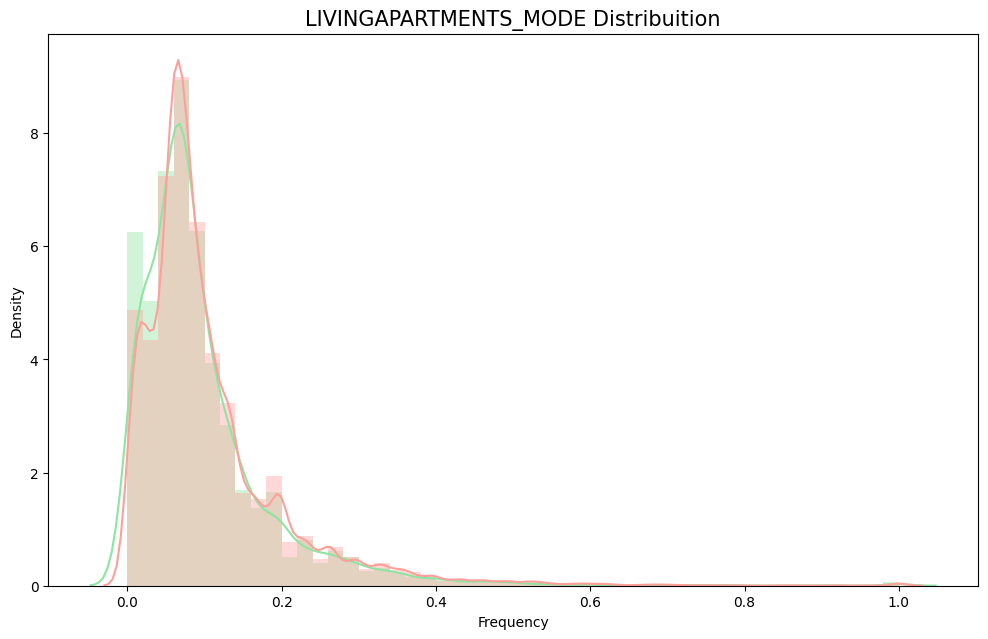




LIVINGAREA_MODE

         Count  TARGET_MEAN
TARGET                     
0       142447     0.106916
1        10714     0.093461


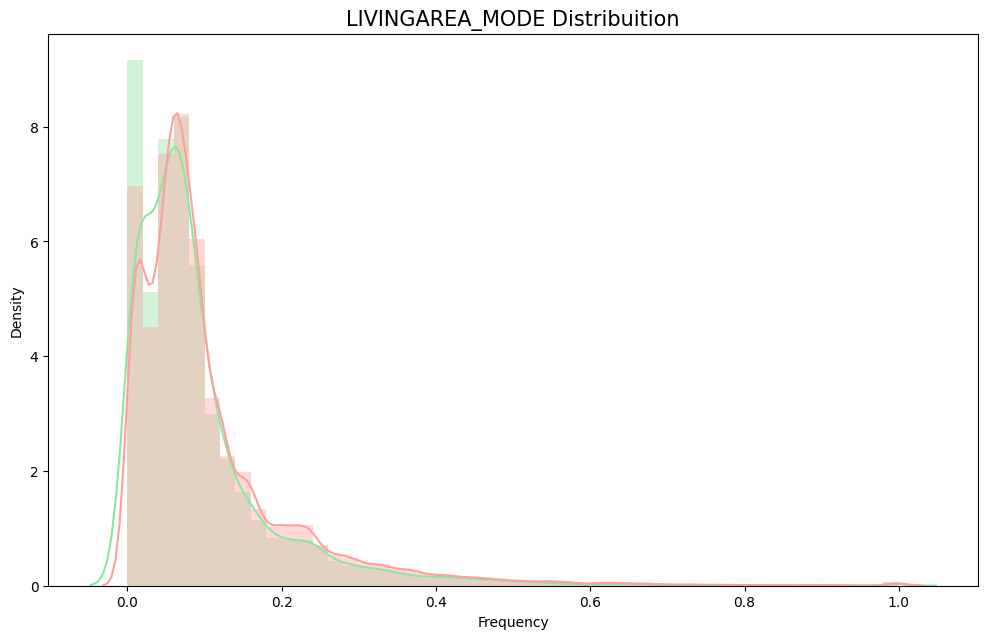




NONLIVINGAPARTMENTS_MODE

        Count  TARGET_MEAN
TARGET                    
0       87499     0.008096
1        6498     0.007812


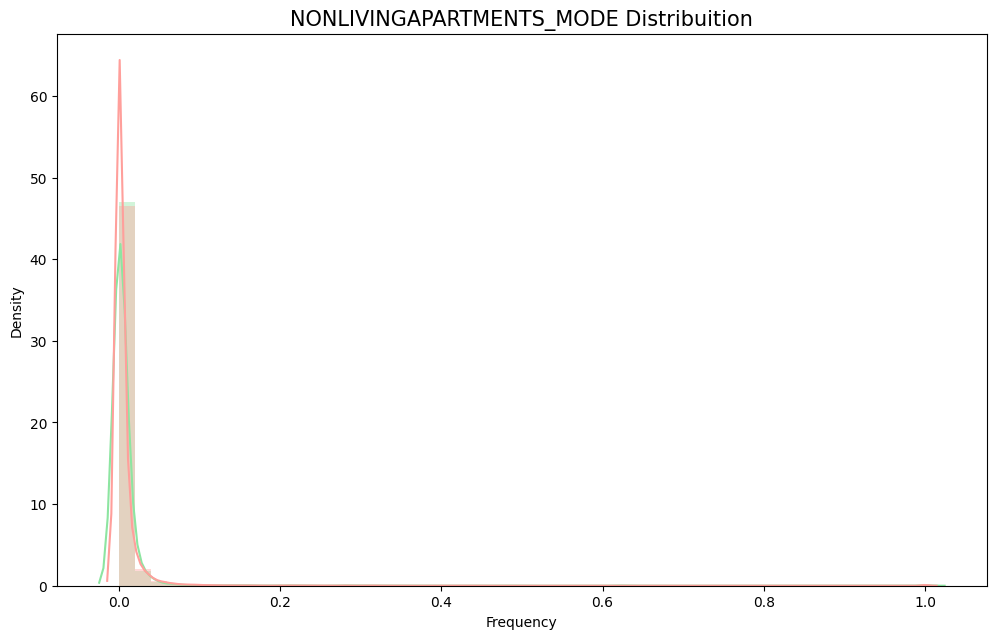




NONLIVINGAREA_MODE

         Count  TARGET_MEAN
TARGET                     
0       128334     0.027265
1         9495     0.023739


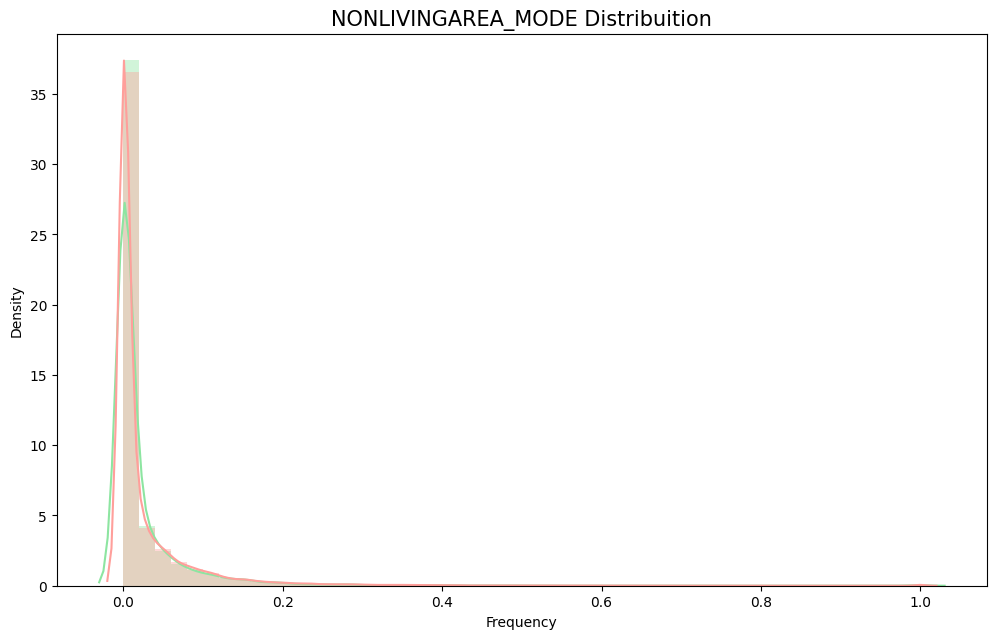




APARTMENTS_MEDI

         Count  TARGET_MEAN
TARGET                     
0       140910     0.118721
1        10540     0.106211


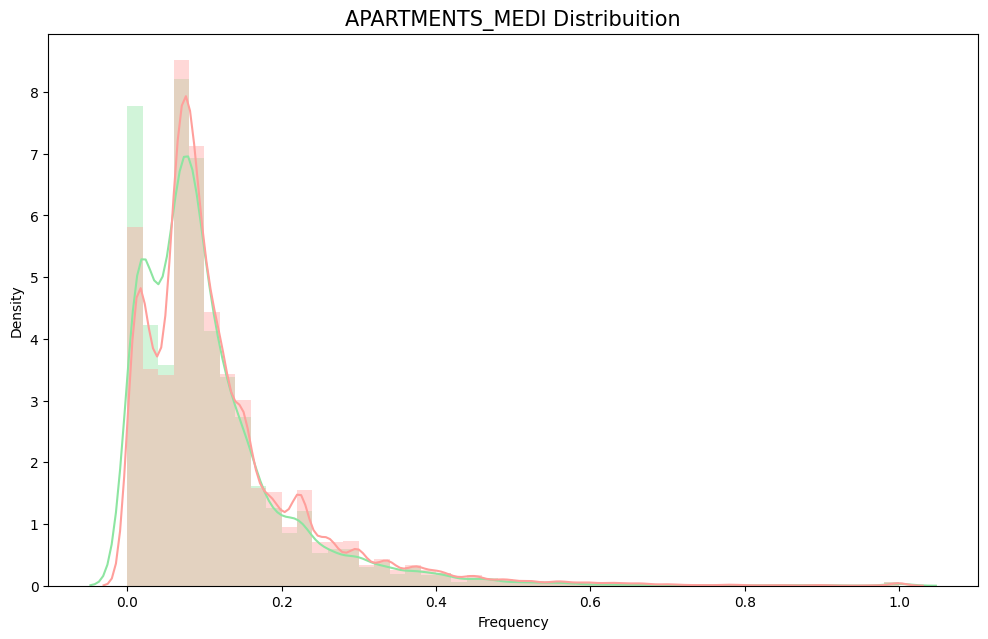




BASEMENTAREA_MEDI

         Count  TARGET_MEAN
TARGET                     
0       118781     0.088448
1         8787     0.081283


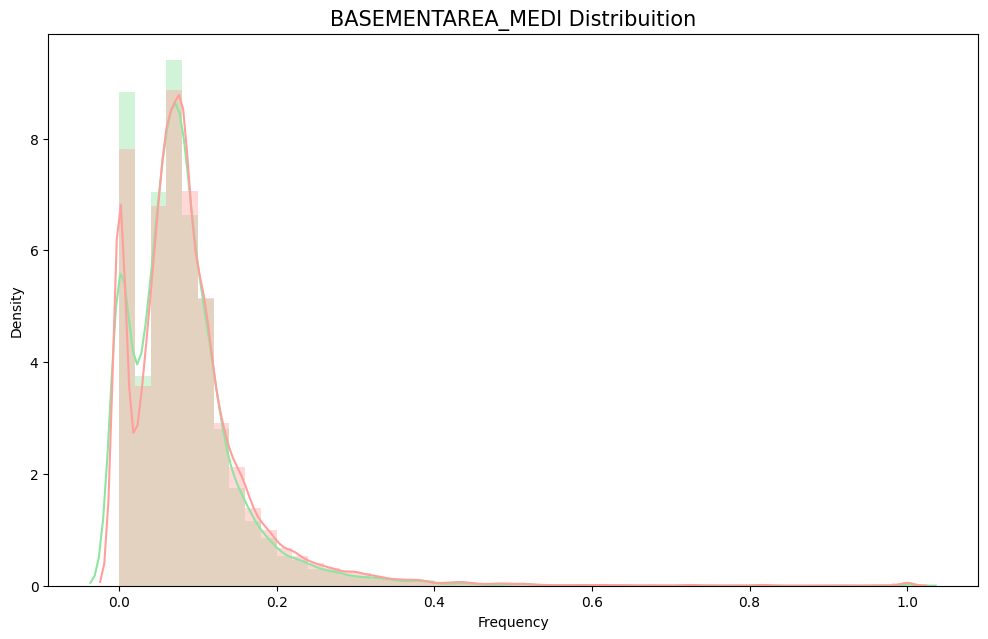




YEARS_BEGINEXPLUATATION_MEDI

         Count  TARGET_MEAN
TARGET                     
0       146487     0.977916
1        11017     0.975570


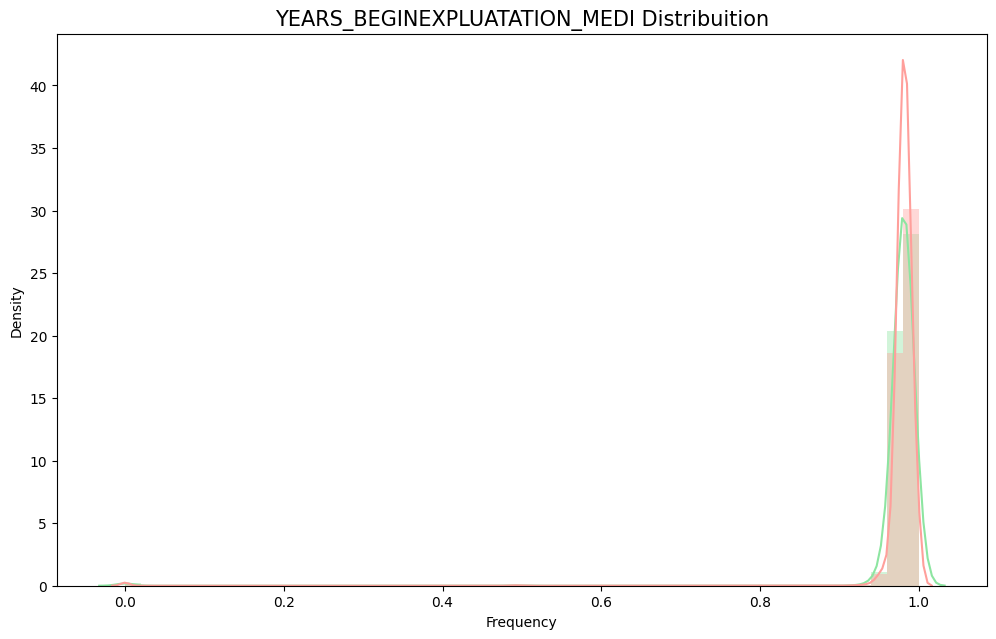




YEARS_BUILD_MEDI

        Count  TARGET_MEAN
TARGET                    
0       95949     0.756426
1        7074     0.746532


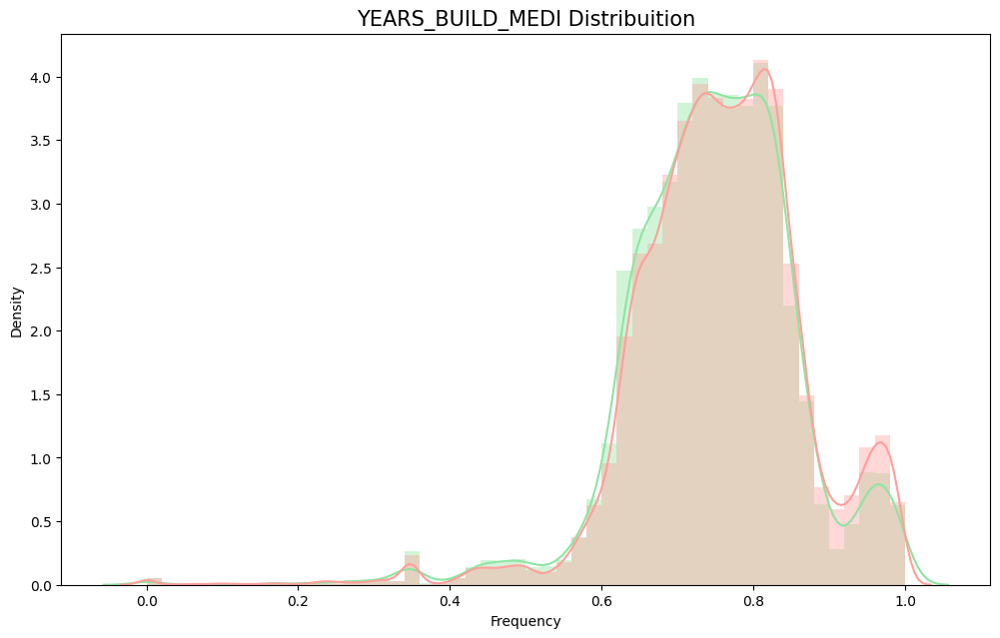




COMMONAREA_MEDI

        Count  TARGET_MEAN
TARGET                    
0       86244     0.044980
1        6402     0.039404


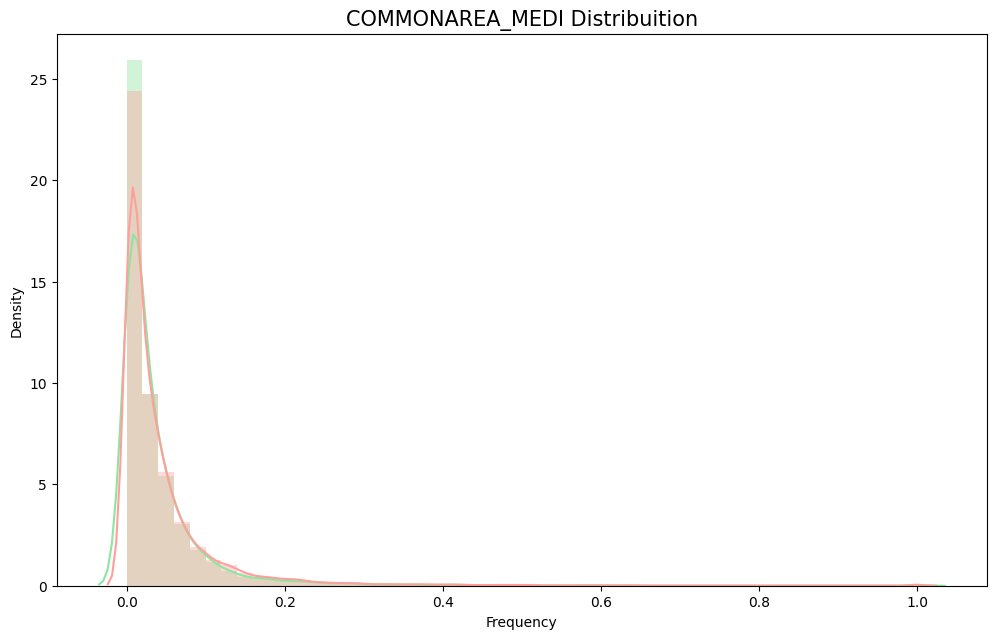




ELEVATORS_MEDI

         Count  TARGET_MEAN
TARGET                     
0       133710     0.079317
1         9910     0.061352


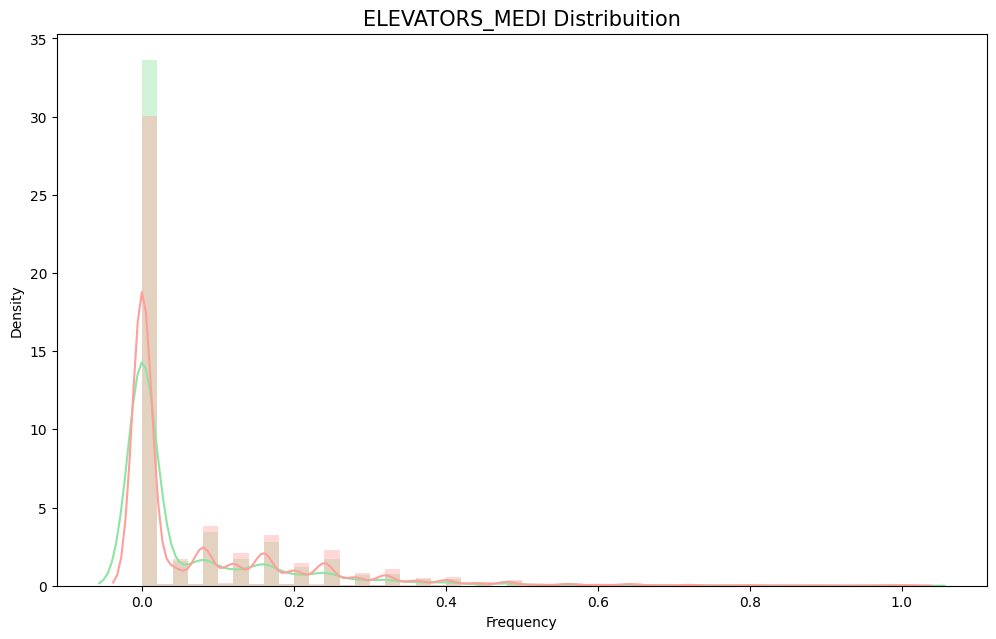




ENTRANCES_MEDI

         Count  TARGET_MEAN
TARGET                     
0       142069     0.149735
1        10614     0.142227


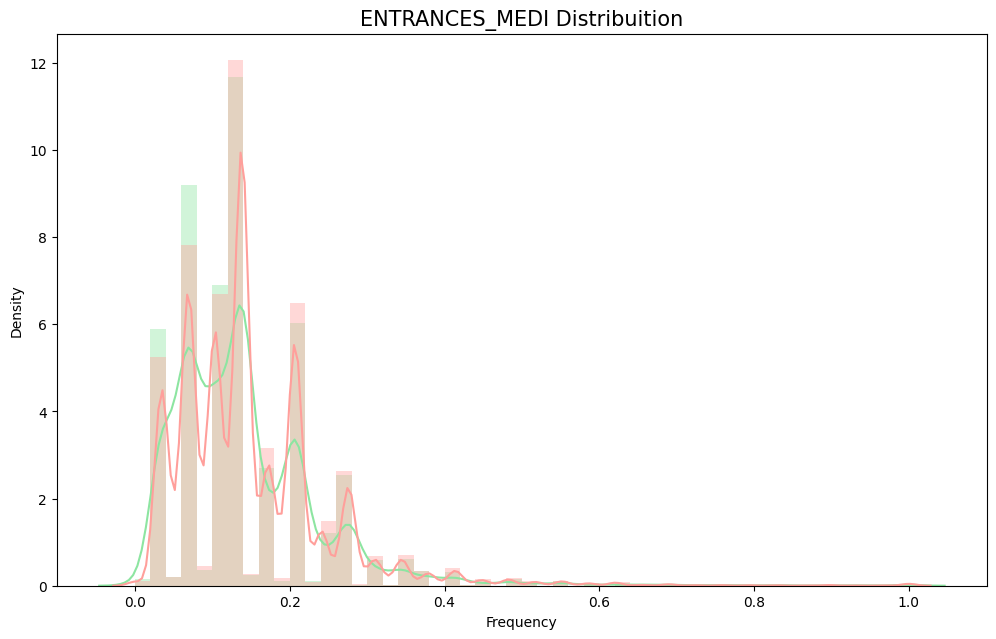




FLOORSMAX_MEDI

         Count  TARGET_MEAN
TARGET                     
0       143730     0.227634
1        10761     0.202692


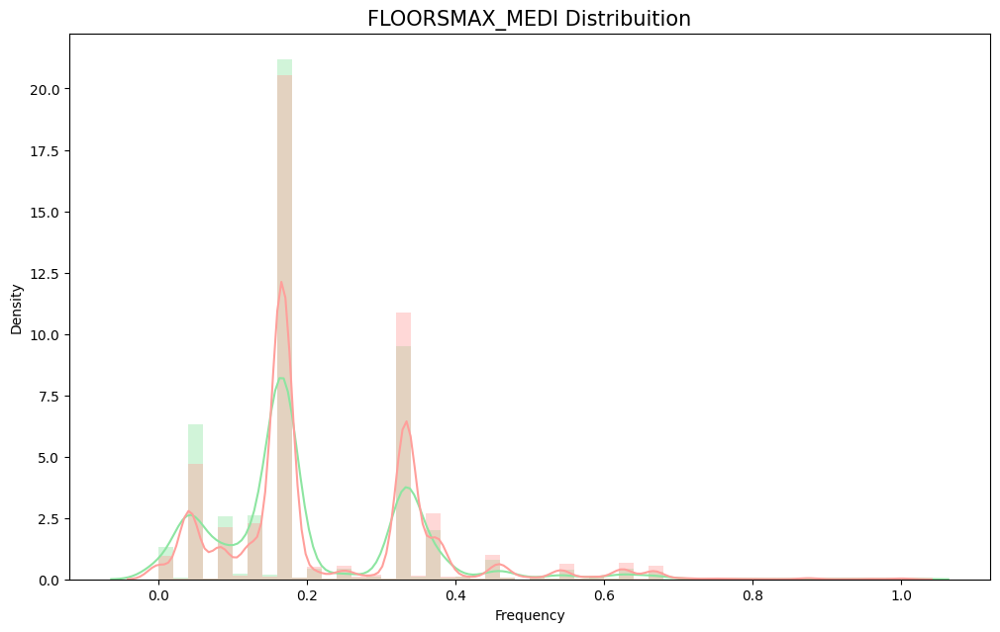




FLOORSMIN_MEDI

        Count  TARGET_MEAN
TARGET                    
0       92052     0.233097
1        6817     0.211754


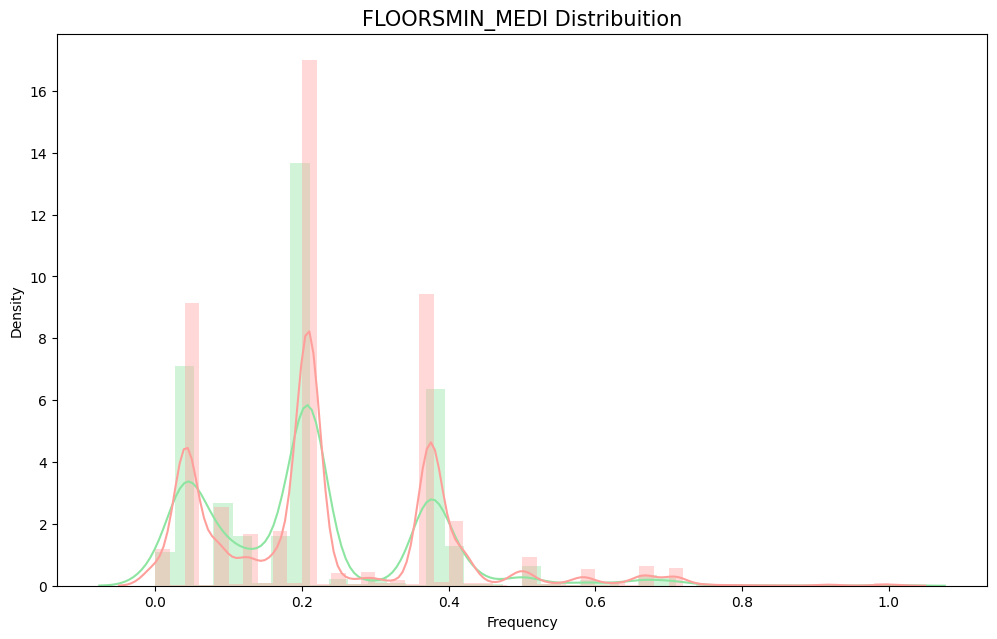




LANDAREA_MEDI

         Count  TARGET_MEAN
TARGET                     
0       116200     0.067422
1         8721     0.063793


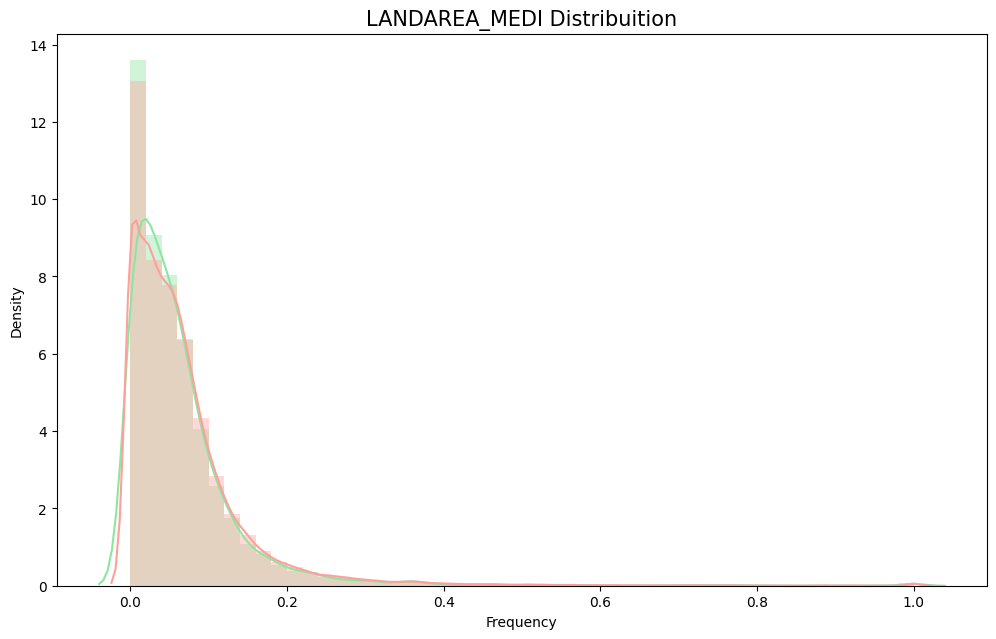




LIVINGAPARTMENTS_MEDI

        Count  TARGET_MEAN
TARGET                    
0       90609     0.102582
1        6703     0.093478


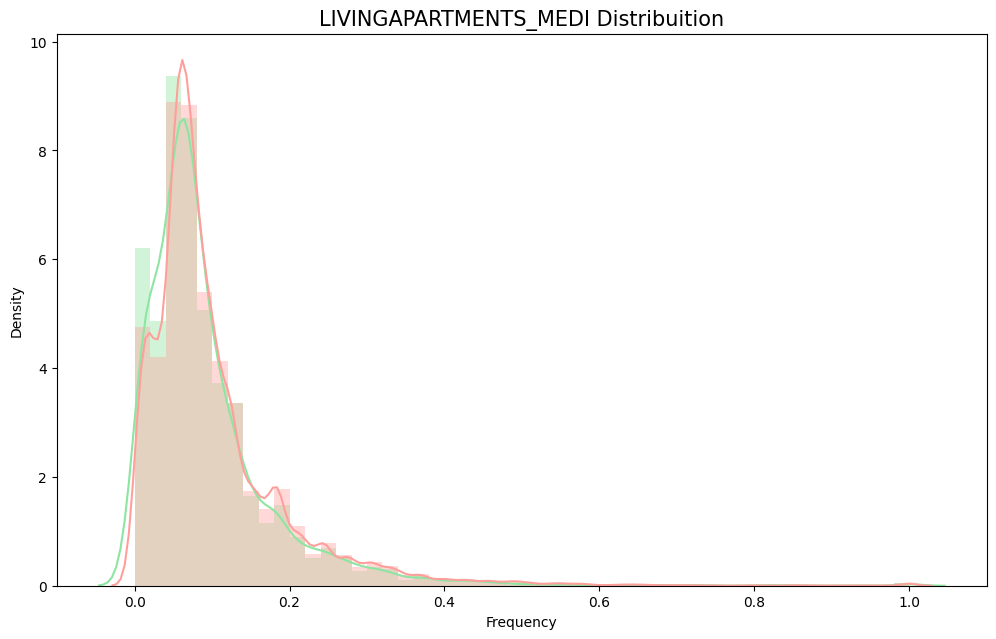




LIVINGAREA_MEDI

         Count  TARGET_MEAN
TARGET                     
0       142447     0.109615
1        10714     0.095206


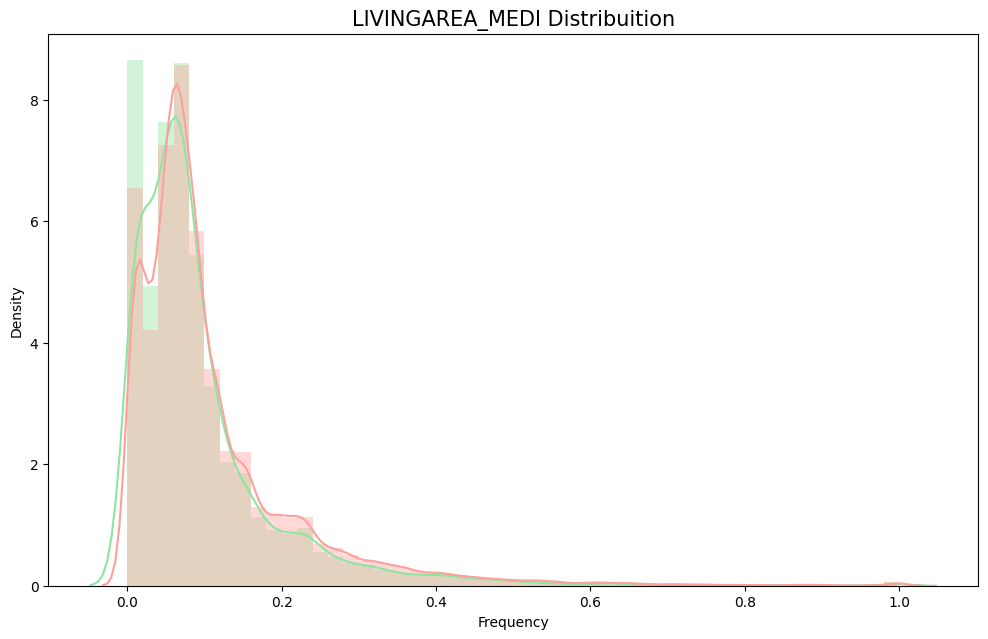




NONLIVINGAPARTMENTS_MEDI

        Count  TARGET_MEAN
TARGET                    
0       87499     0.008687
1        6498     0.008171


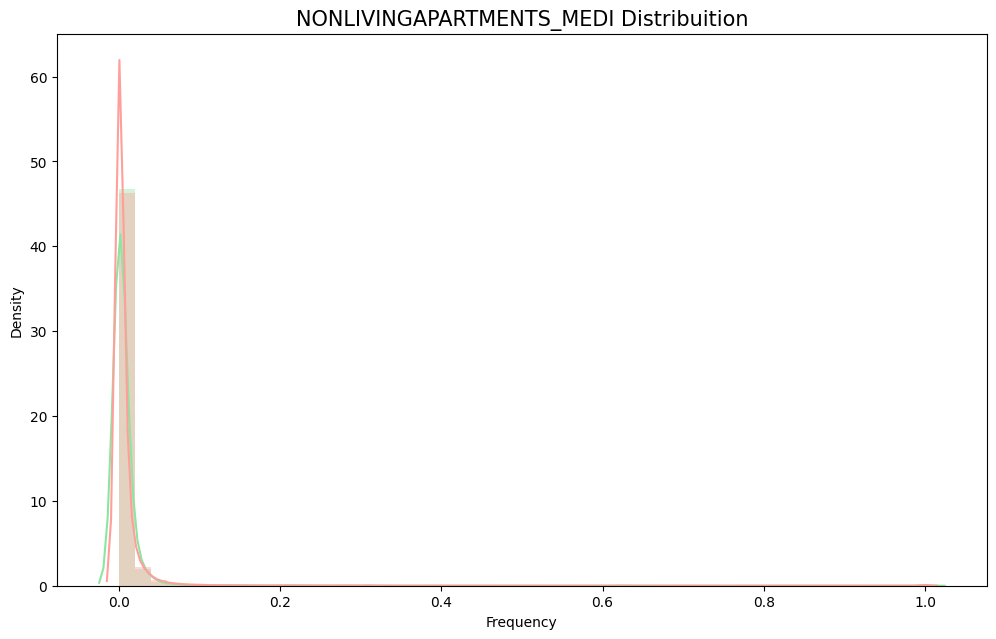




NONLIVINGAREA_MEDI

         Count  TARGET_MEAN
TARGET                     
0       128334     0.028490
1         9495     0.024796


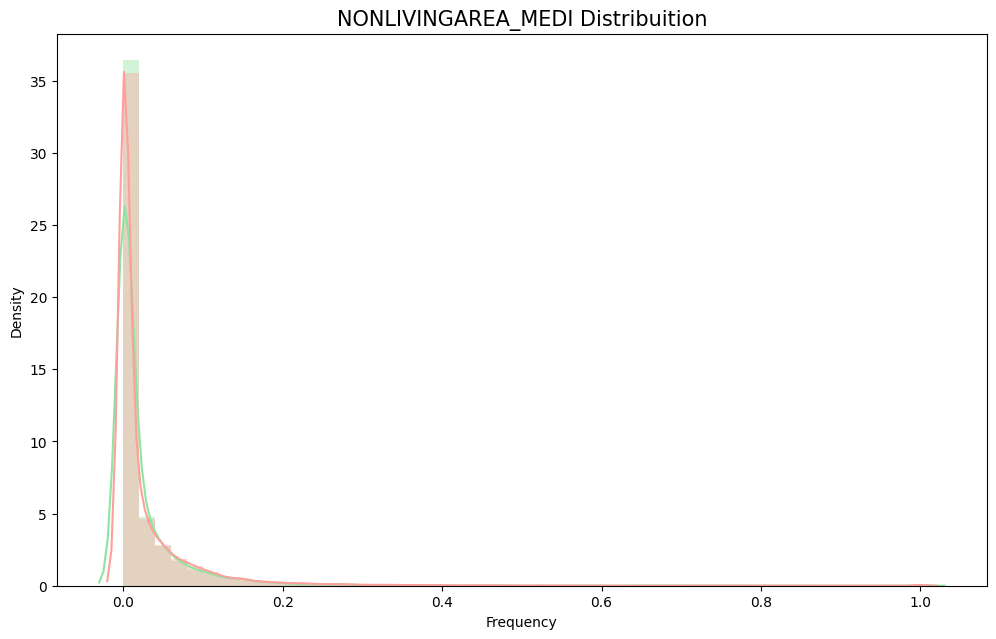




TOTALAREA_MODE

         Count  TARGET_MEAN
TARGET                     
0       147961     0.103507
1        11119     0.089769


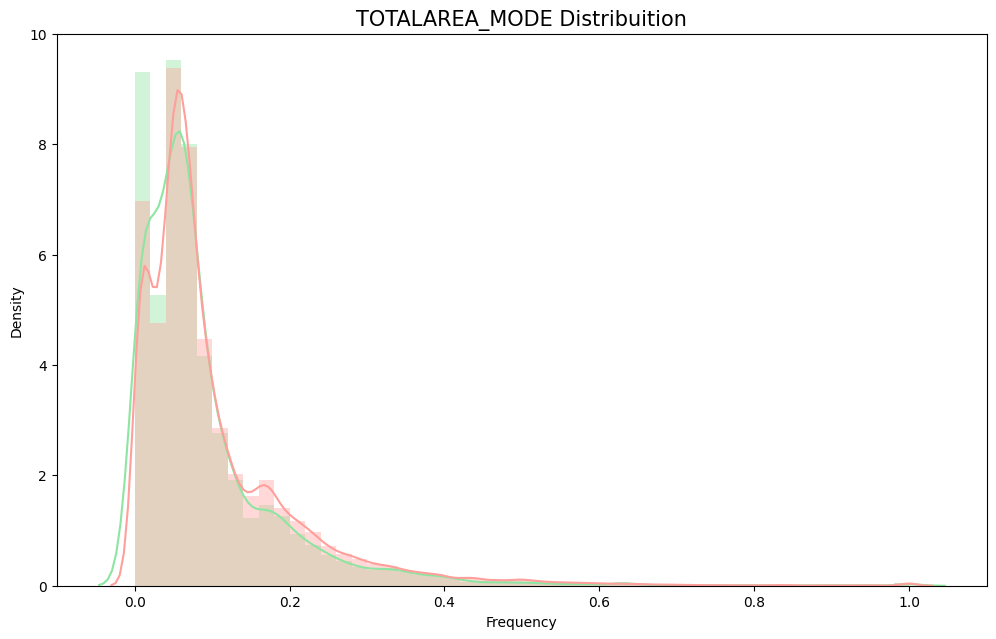




OBS_30_CNT_SOCIAL_CIRCLE

         Count  TARGET_MEAN
TARGET                     
0       281701     1.415742
1        24789     1.496147


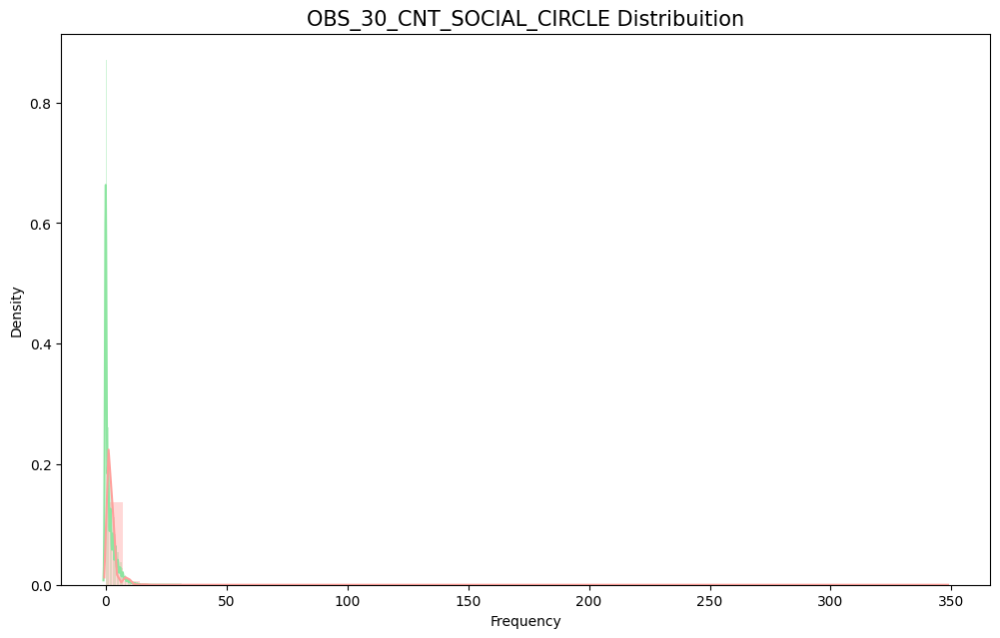




DEF_30_CNT_SOCIAL_CIRCLE

         Count  TARGET_MEAN
TARGET                     
0       281701     0.139148
1        24789     0.191980


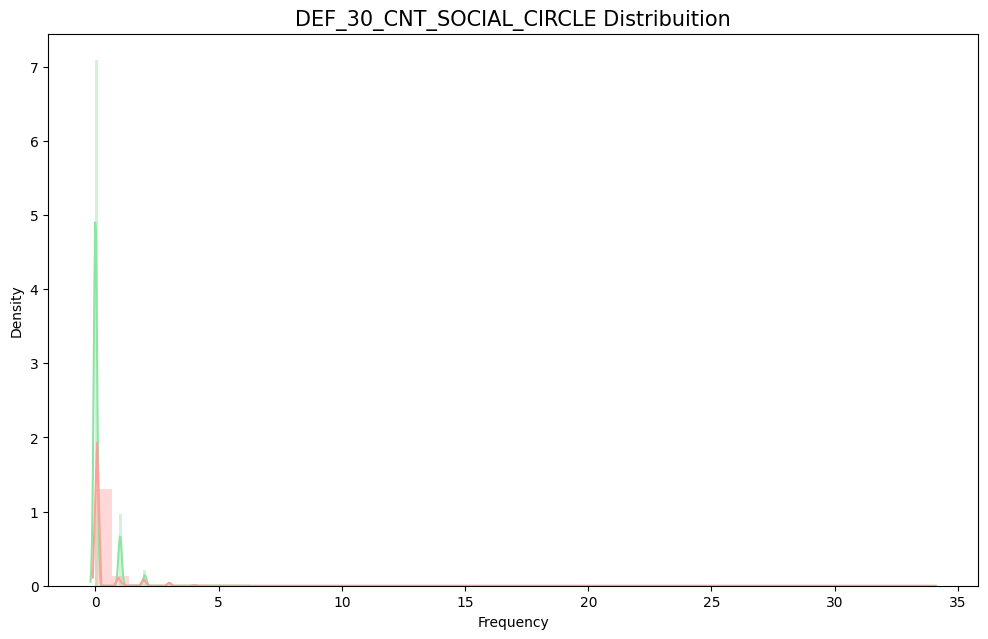




OBS_60_CNT_SOCIAL_CIRCLE

         Count  TARGET_MEAN
TARGET                     
0       281701     1.398923
1        24789     1.477672


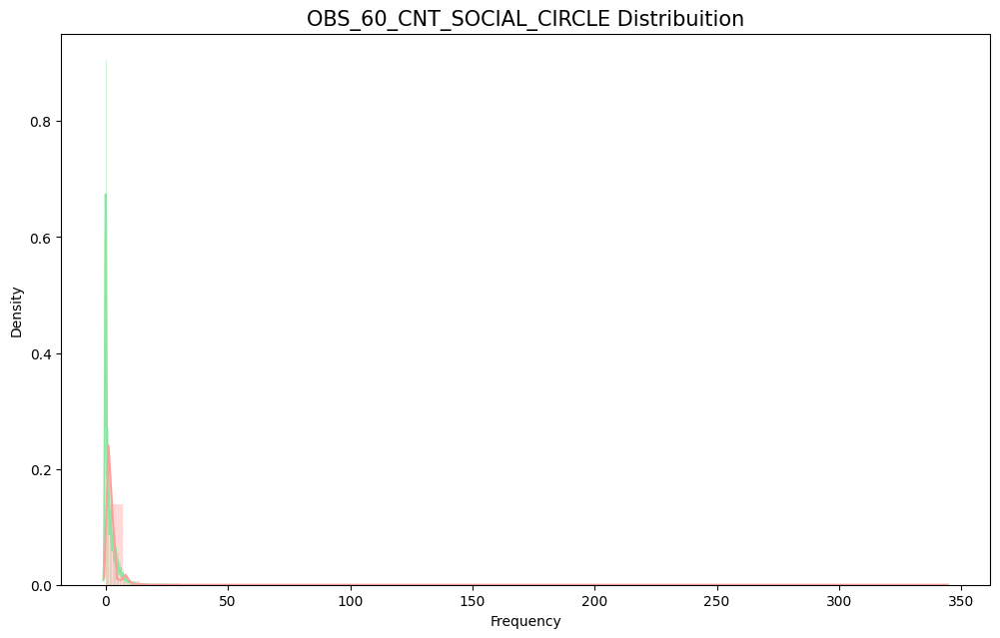




DEF_60_CNT_SOCIAL_CIRCLE

         Count  TARGET_MEAN
TARGET                     
0       281701     0.096688
1        24789     0.138247


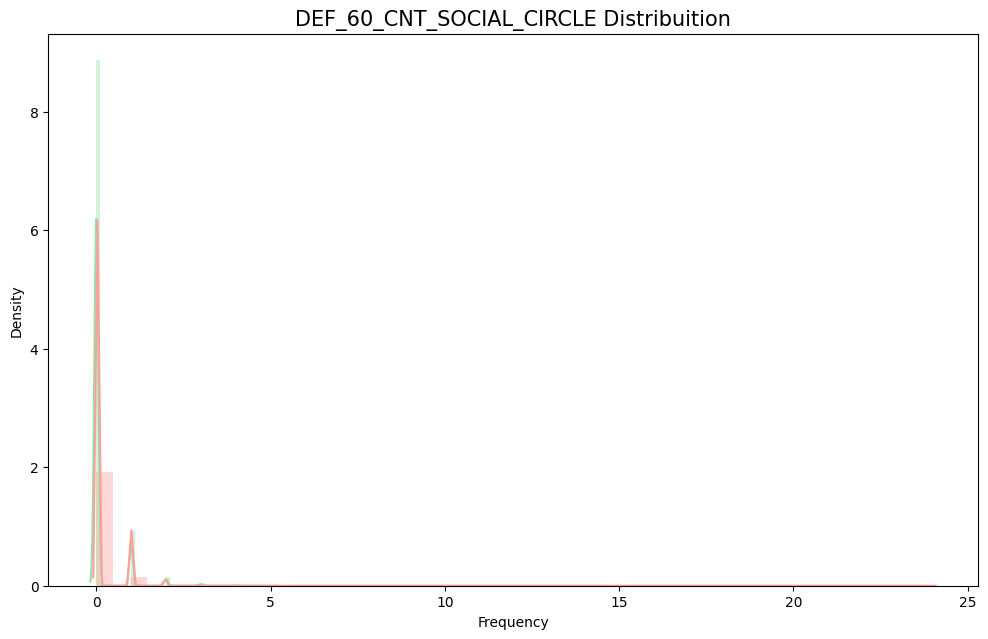




DAYS_LAST_PHONE_CHANGE

         Count  TARGET_MEAN
TARGET                     
0       282685  -976.388294
1        24825  -808.796818


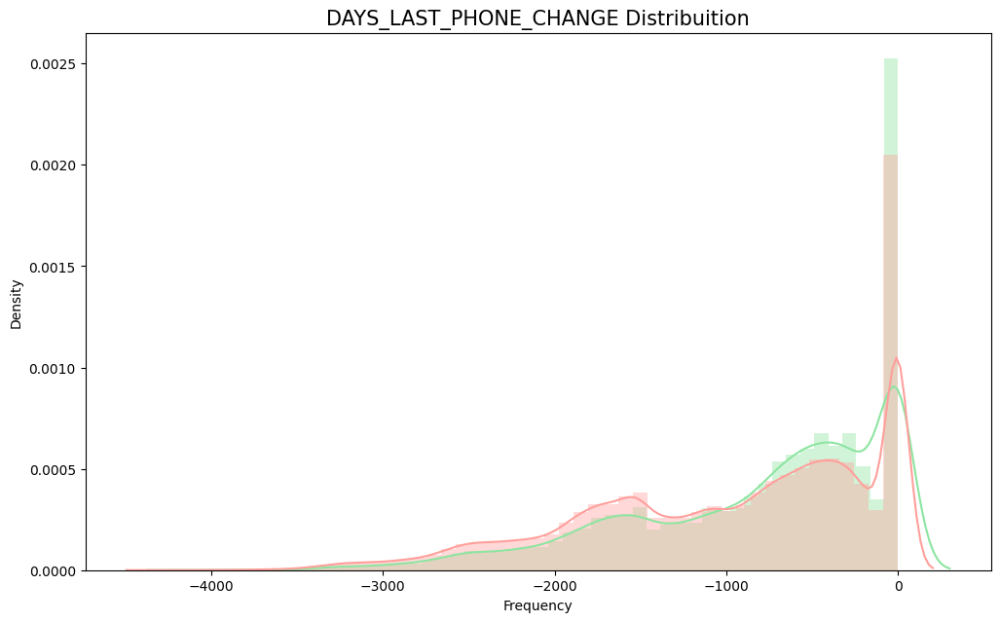




FLAG_DOCUMENT_2

         Count  TARGET_MEAN
TARGET                     
0       282686     0.000032
1        24825     0.000161


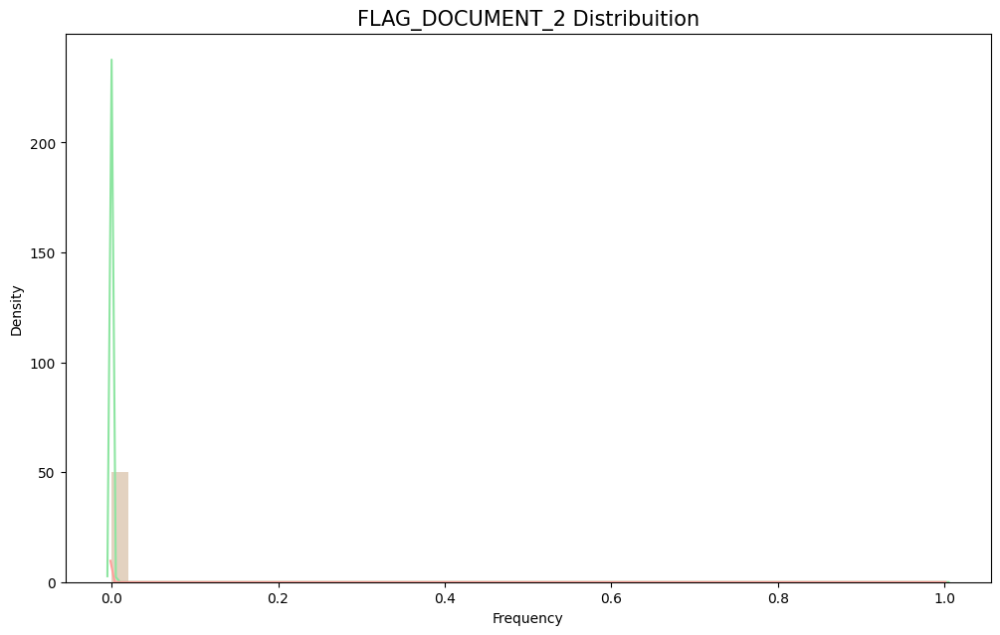




FLAG_DOCUMENT_3

         Count  TARGET_MEAN
TARGET                     
0       282686     0.704060
1        24825     0.777925


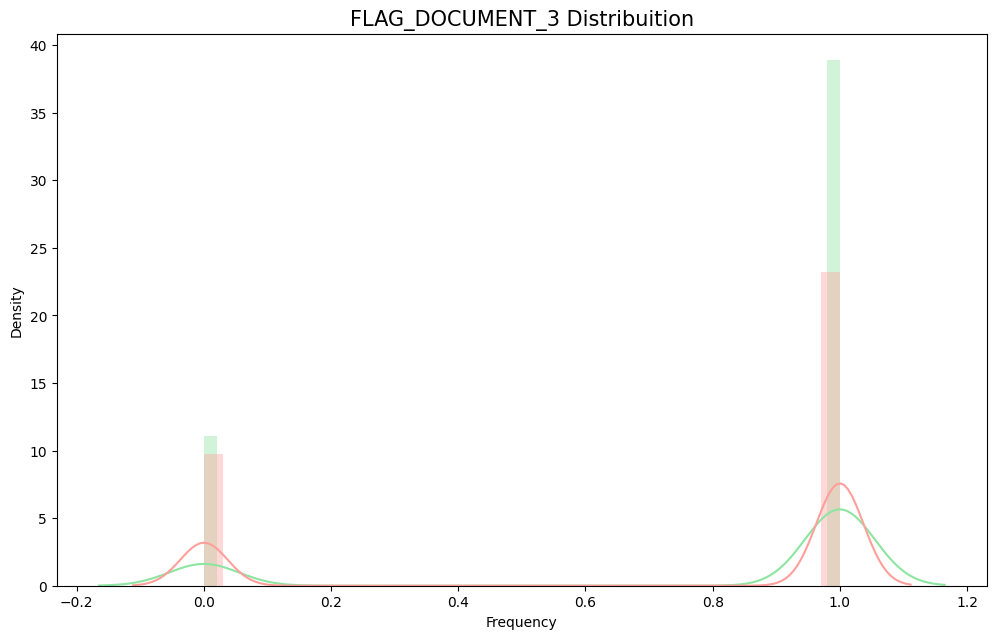




FLAG_DOCUMENT_4

         Count  TARGET_MEAN
TARGET                     
0       282686     0.000088
1        24825     0.000000


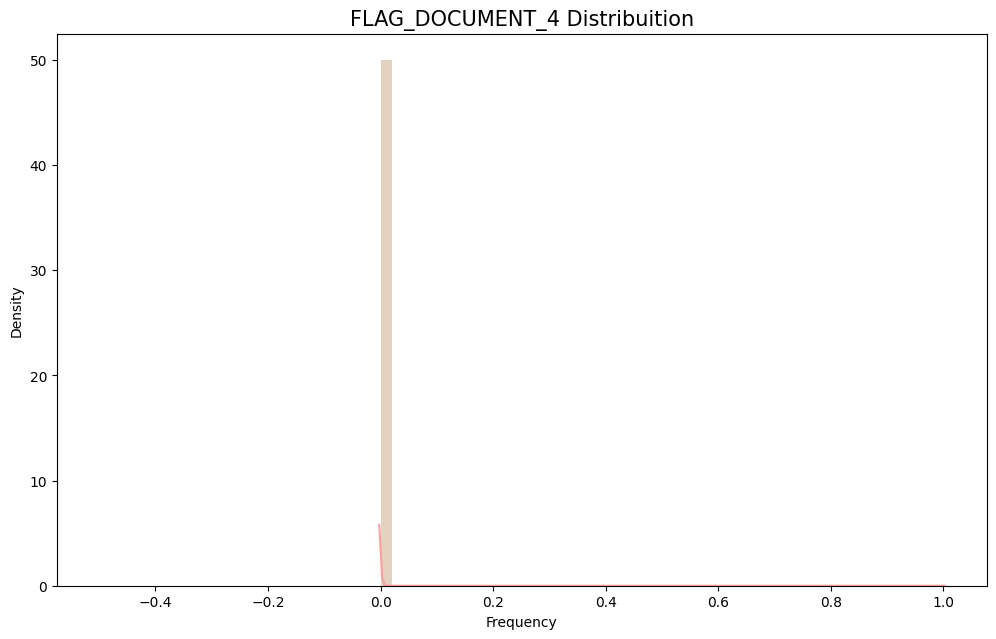




FLAG_DOCUMENT_5

         Count  TARGET_MEAN
TARGET                     
0       282686     0.015126
1        24825     0.014985


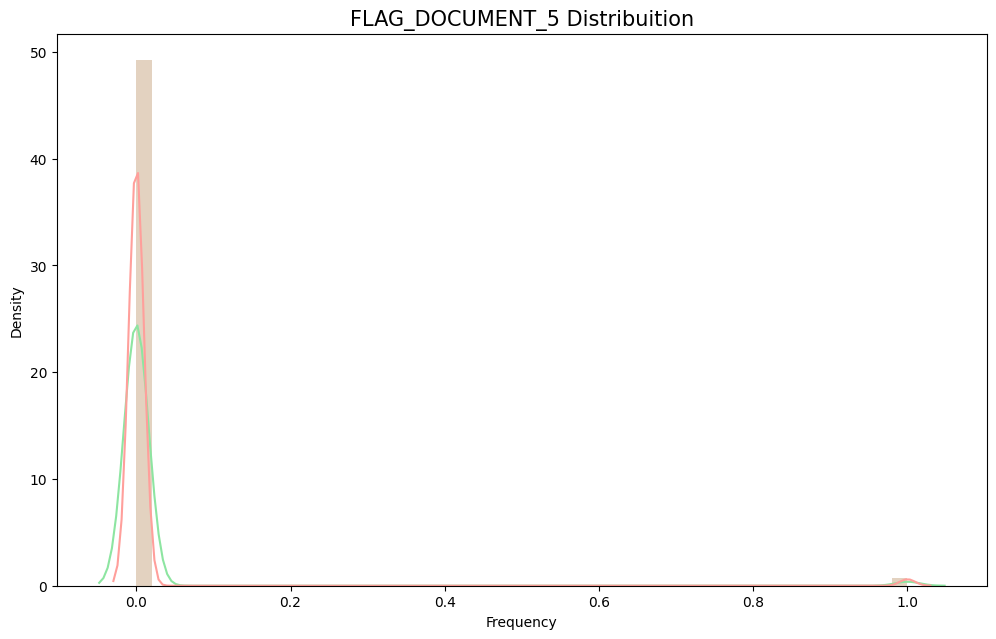




FLAG_DOCUMENT_6

         Count  TARGET_MEAN
TARGET                     
0       282686     0.090457
1        24825     0.060705


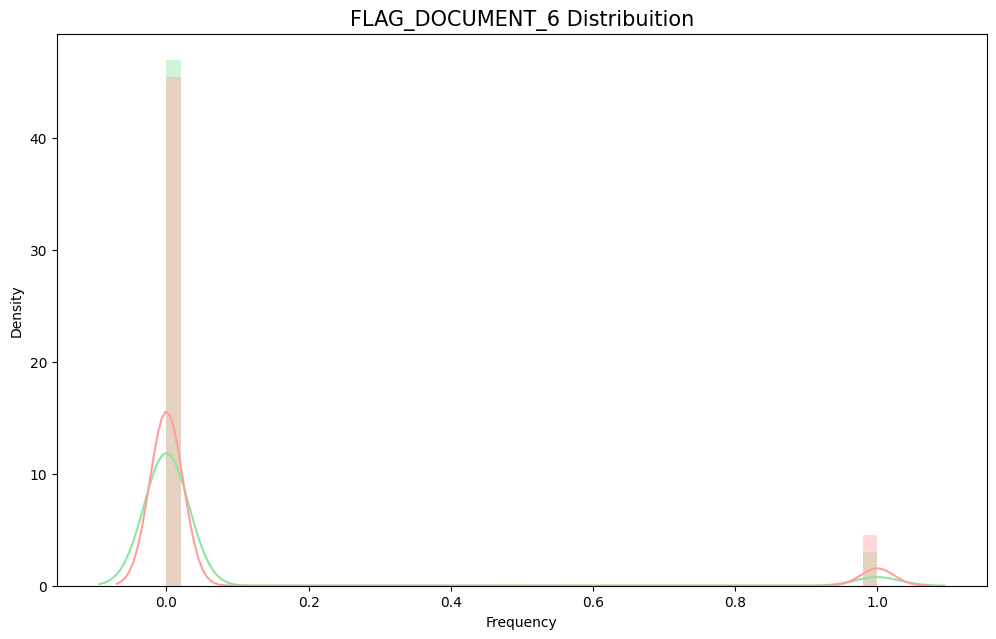




FLAG_DOCUMENT_7

         Count  TARGET_MEAN
TARGET                     
0       282686     0.000198
1        24825     0.000121


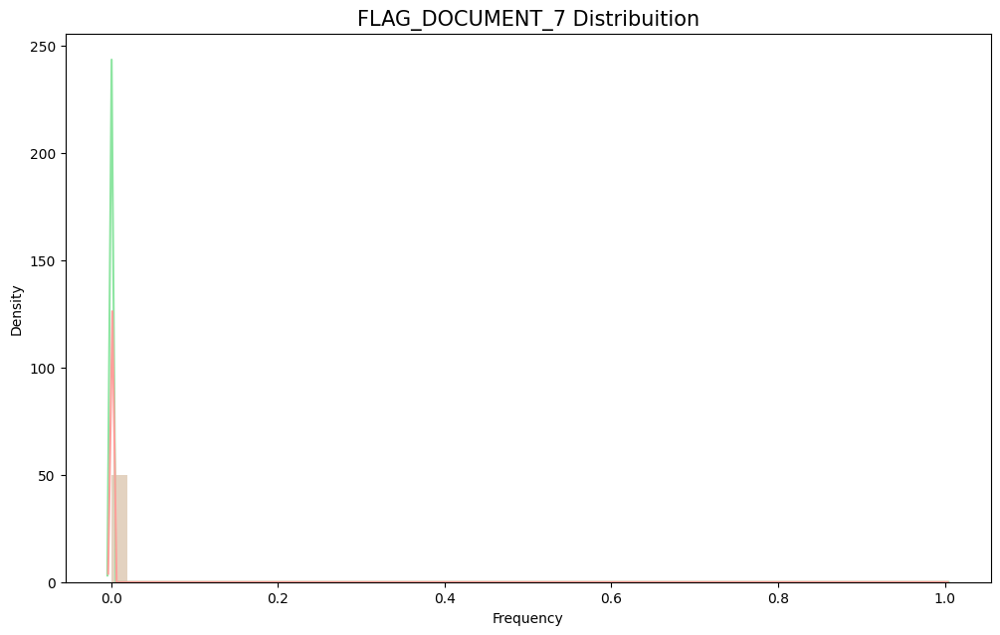




FLAG_DOCUMENT_8

         Count  TARGET_MEAN
TARGET                     
0       282686     0.082027
1        24825     0.073958


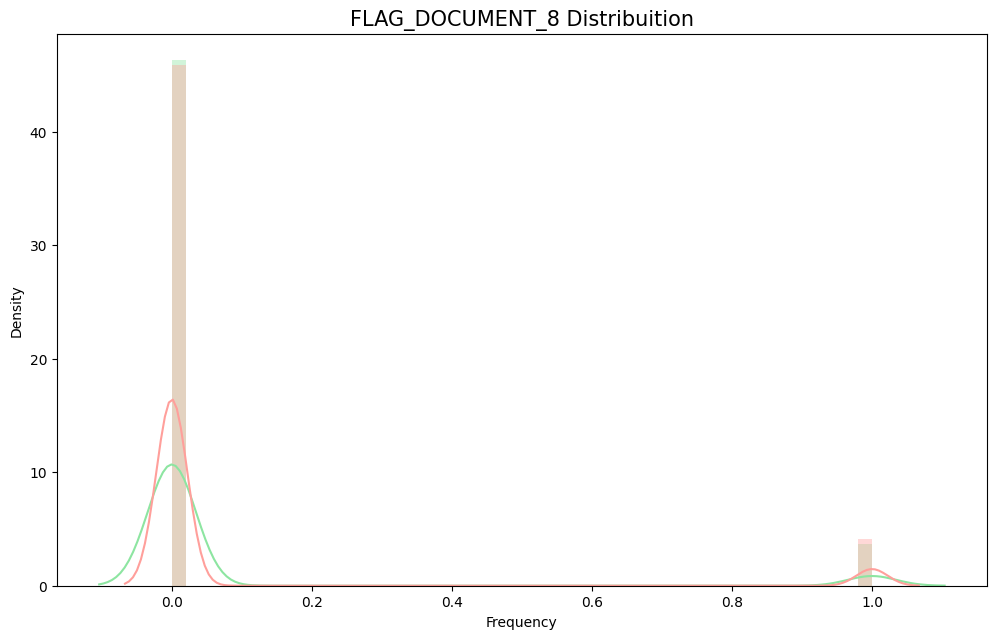




FLAG_DOCUMENT_9

         Count  TARGET_MEAN
TARGET                     
0       282686     0.003976
1        24825     0.002981


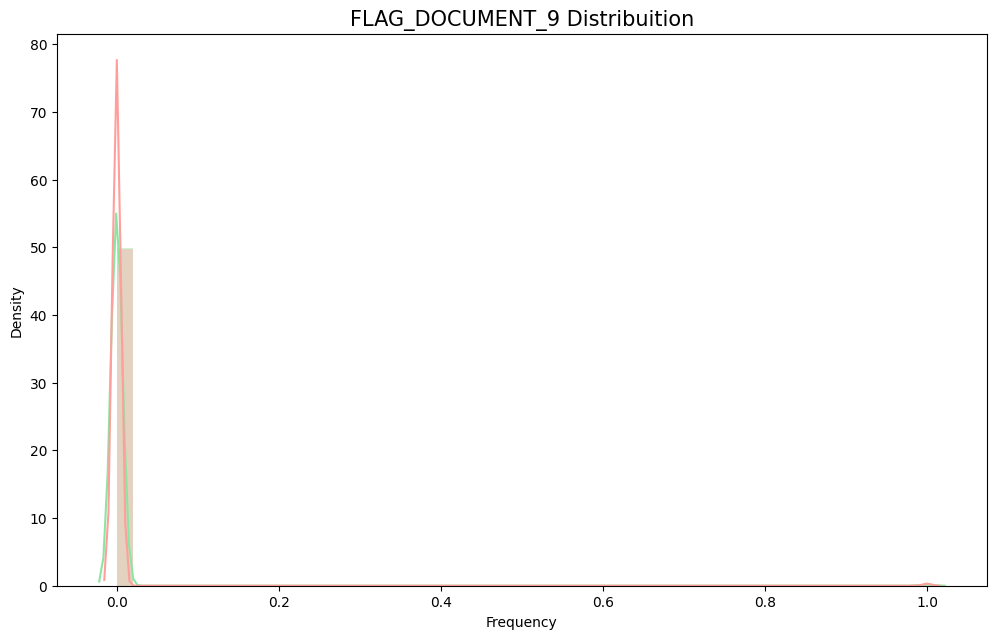




FLAG_DOCUMENT_10

         Count  TARGET_MEAN
TARGET                     
0       282686     0.000025
1        24825     0.000000


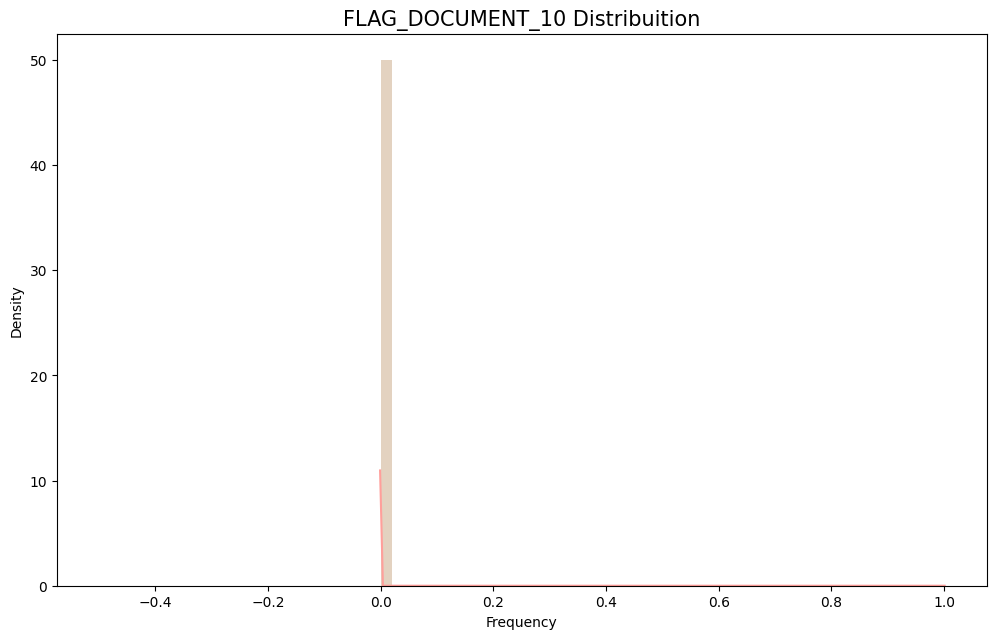




FLAG_DOCUMENT_11

         Count  TARGET_MEAN
TARGET                     
0       282686     0.003990
1        24825     0.003021


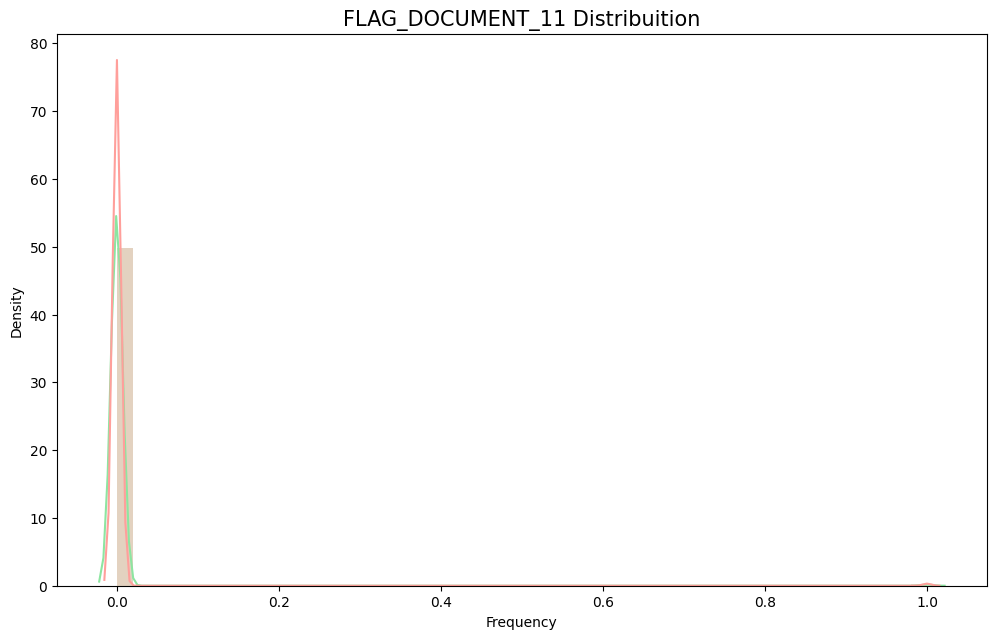




FLAG_DOCUMENT_12

         Count  TARGET_MEAN
TARGET                     
0       282686     0.000007
1        24825     0.000000


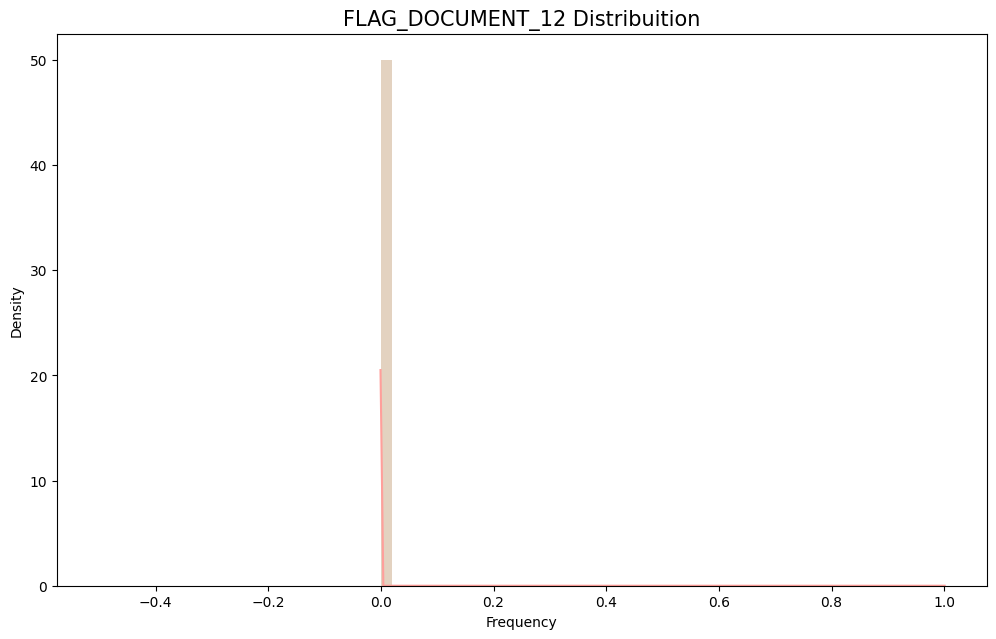




FLAG_DOCUMENT_13

         Count  TARGET_MEAN
TARGET                     
0       282686     0.003729
1        24825     0.001208


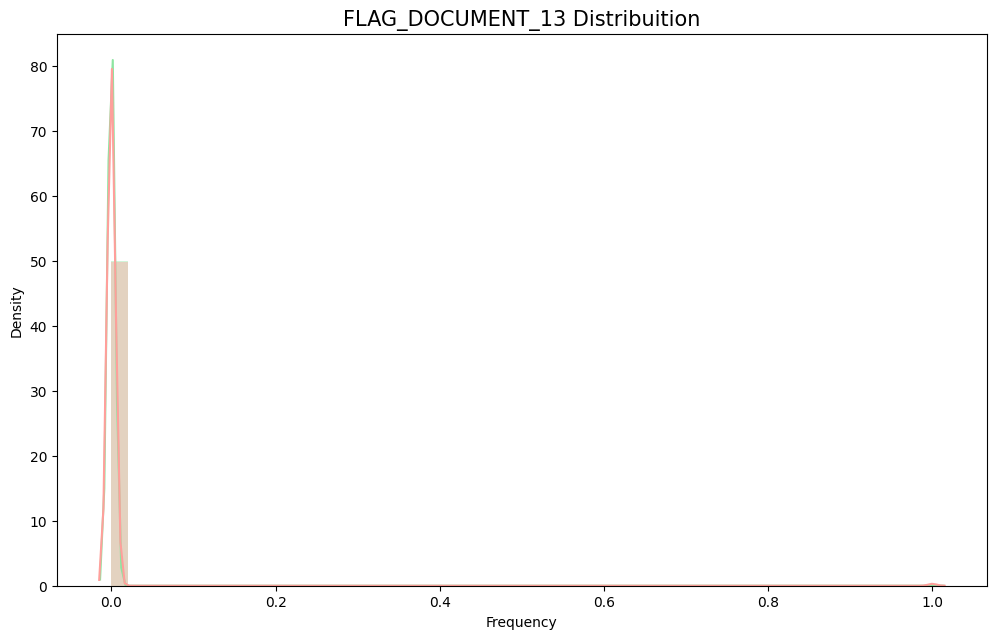




FLAG_DOCUMENT_14

         Count  TARGET_MEAN
TARGET                     
0       282686     0.003088
1        24825     0.001208


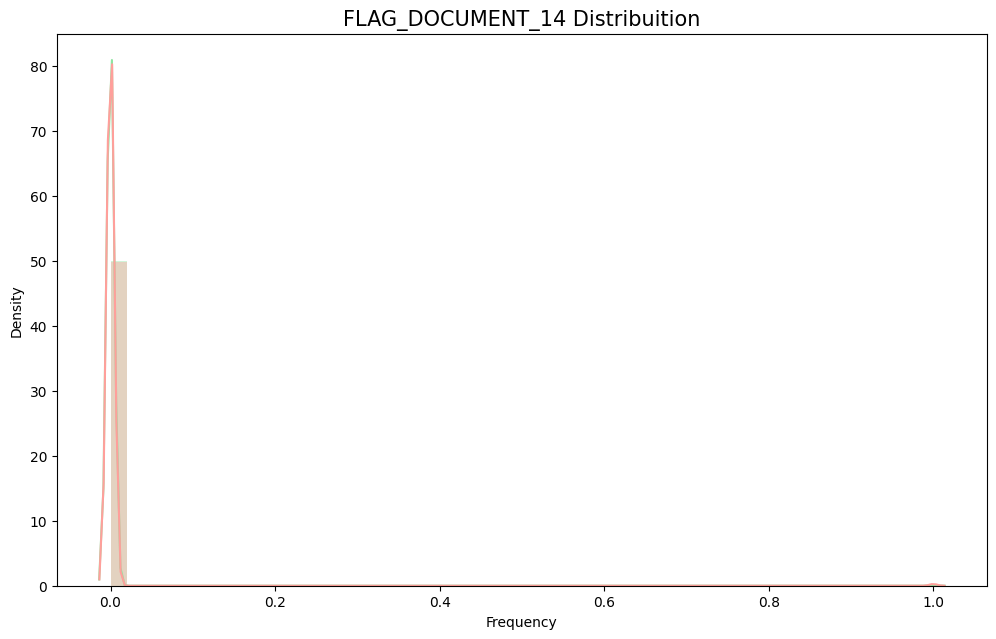




FLAG_DOCUMENT_15

         Count  TARGET_MEAN
TARGET                     
0       282686     0.001277
1        24825     0.000443


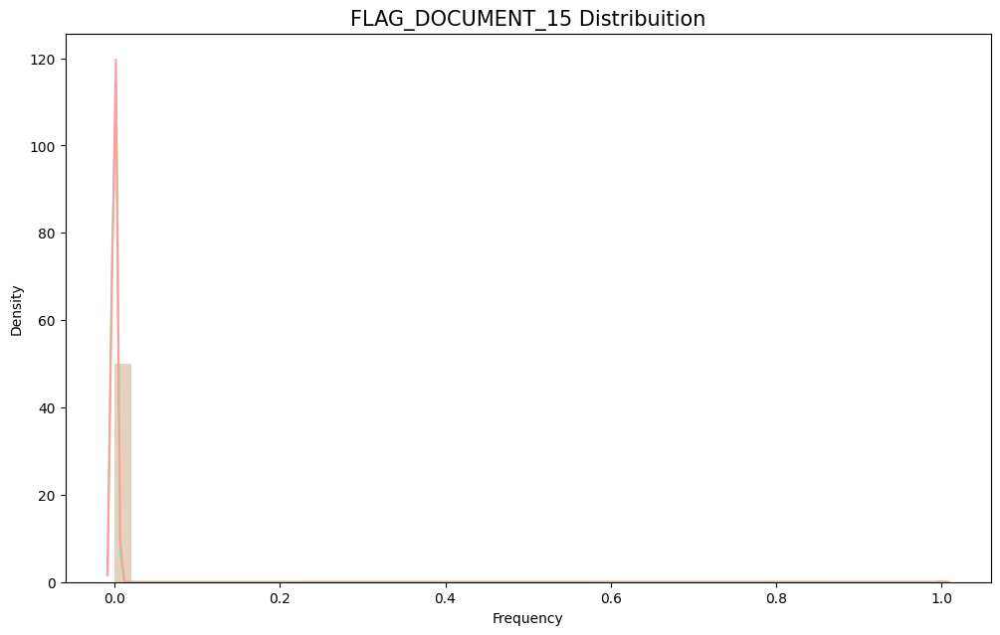




FLAG_DOCUMENT_16

         Count  TARGET_MEAN
TARGET                     
0       282686     0.010269
1        24825     0.006042


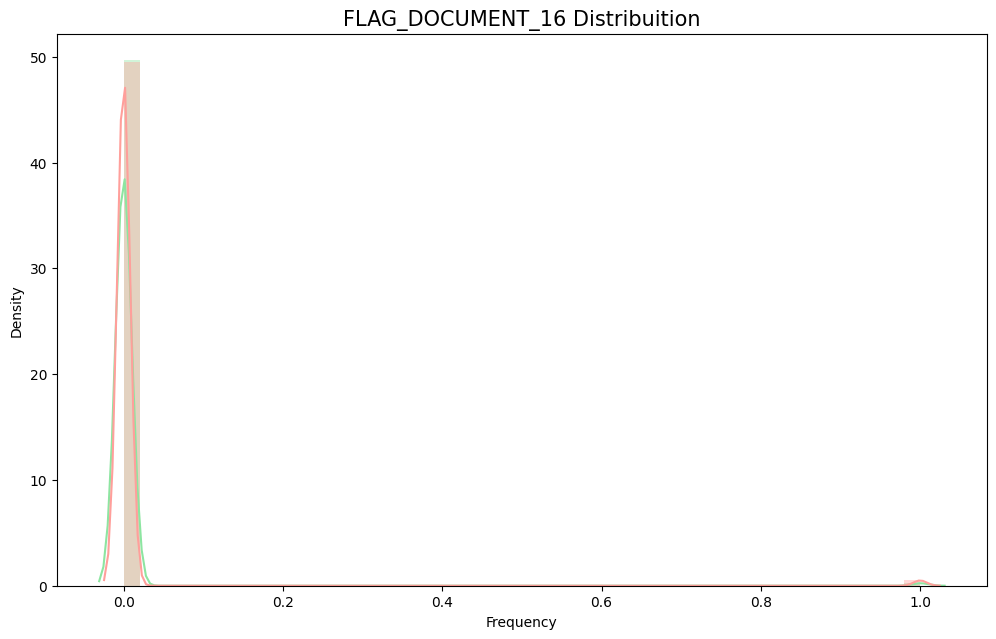




FLAG_DOCUMENT_17

         Count  TARGET_MEAN
TARGET                     
0       282686     0.000283
1        24825     0.000081


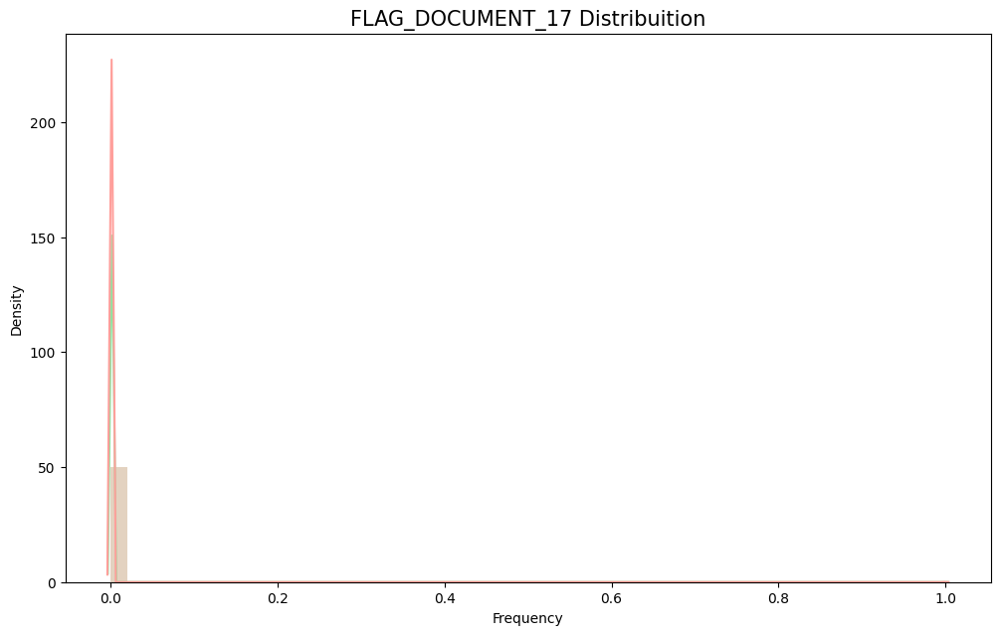




FLAG_DOCUMENT_18

         Count  TARGET_MEAN
TARGET                     
0       282686     0.008341
1        24825     0.005720


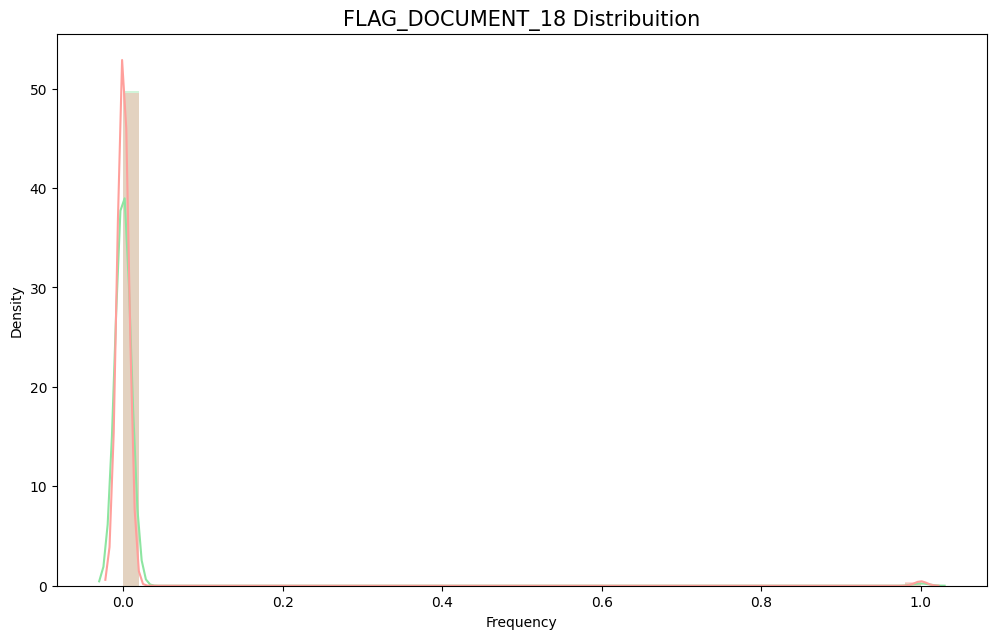




FLAG_DOCUMENT_19

         Count  TARGET_MEAN
TARGET                     
0       282686     0.000605
1        24825     0.000483


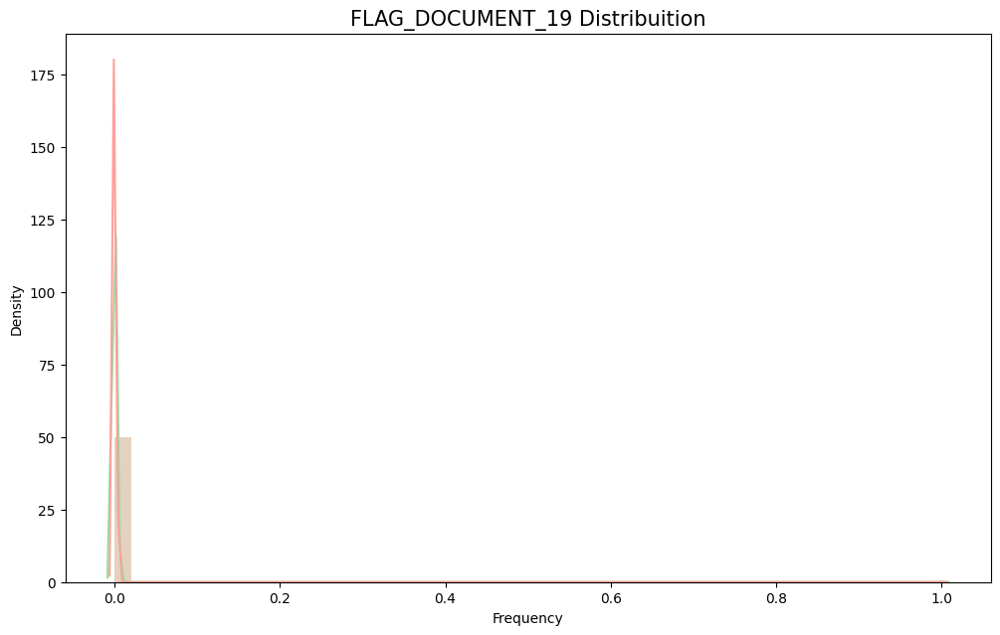




FLAG_DOCUMENT_20

         Count  TARGET_MEAN
TARGET                     
0       282686     0.000506
1        24825     0.000524


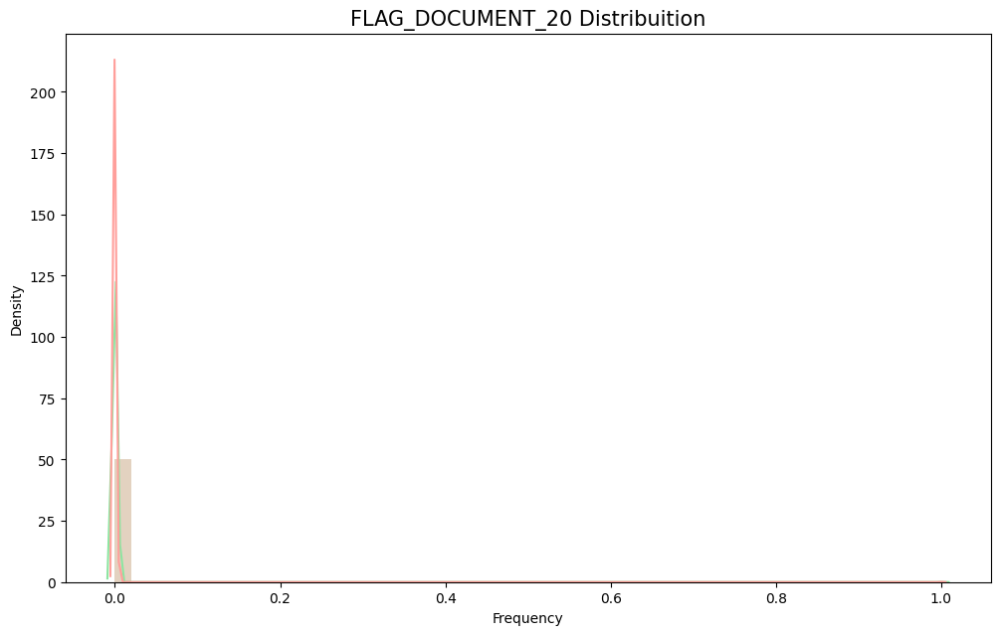




FLAG_DOCUMENT_21

         Count  TARGET_MEAN
TARGET                     
0       282686     0.000315
1        24825     0.000564


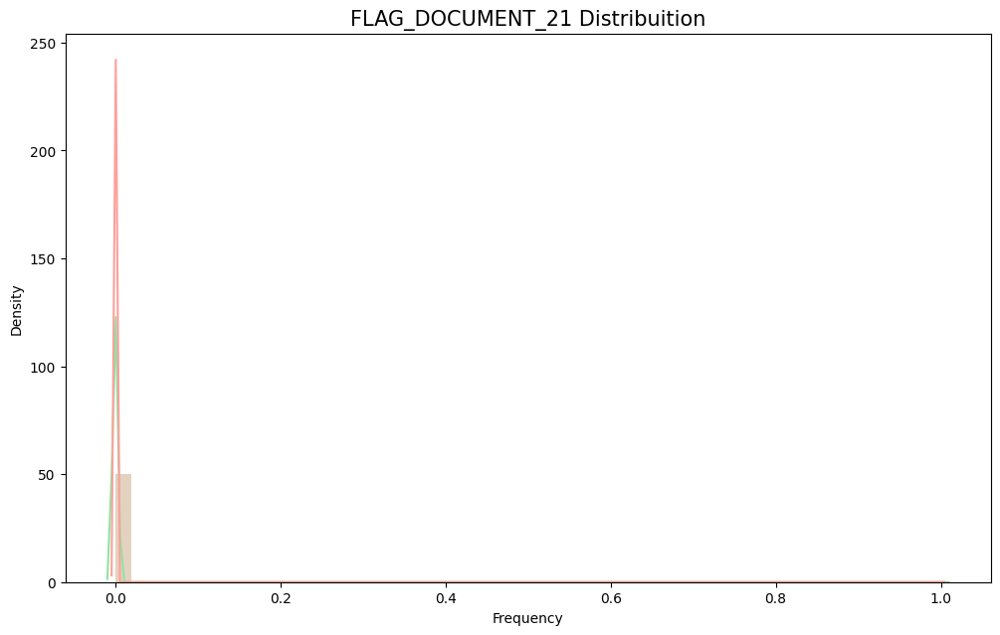




AMT_REQ_CREDIT_BUREAU_HOUR

         Count  TARGET_MEAN
TARGET                     
0       245459     0.006380
1        20533     0.006672


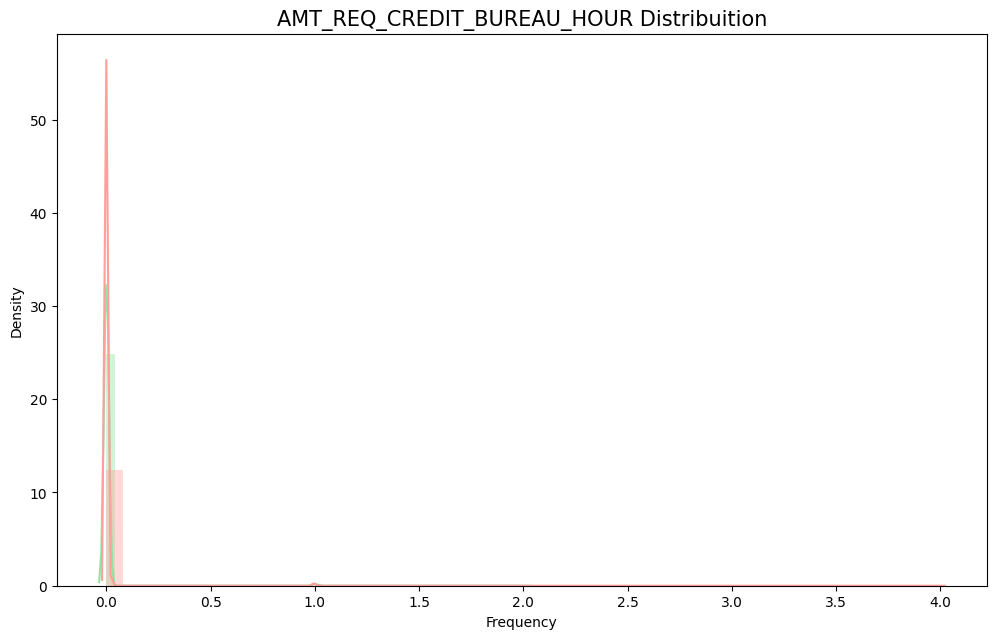




AMT_REQ_CREDIT_BUREAU_DAY

         Count  TARGET_MEAN
TARGET                     
0       245459     0.006914
1        20533     0.008036


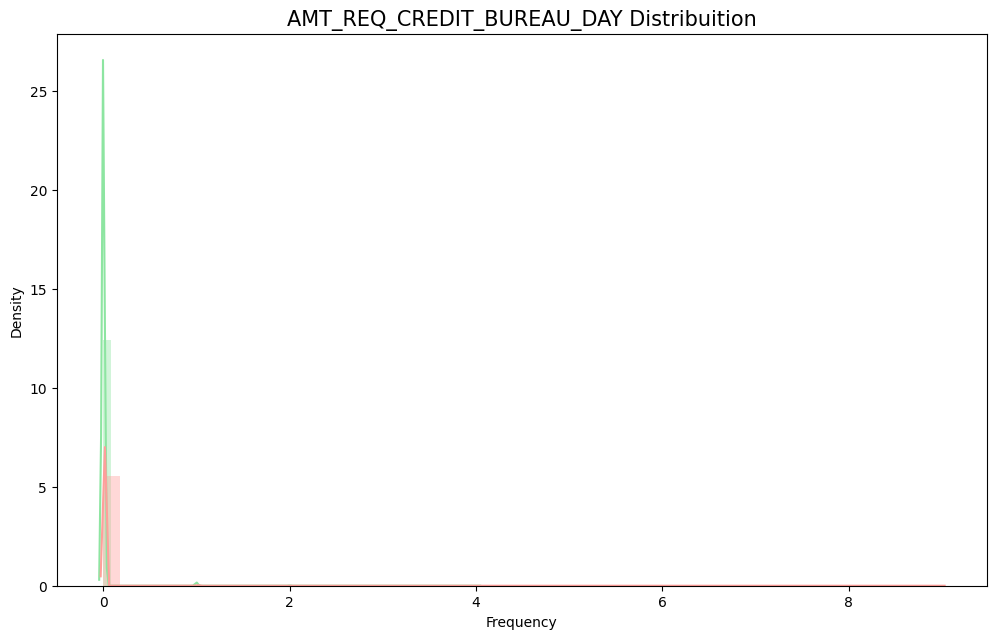




AMT_REQ_CREDIT_BUREAU_WEEK

         Count  TARGET_MEAN
TARGET                     
0       245459     0.034315
1        20533     0.034919


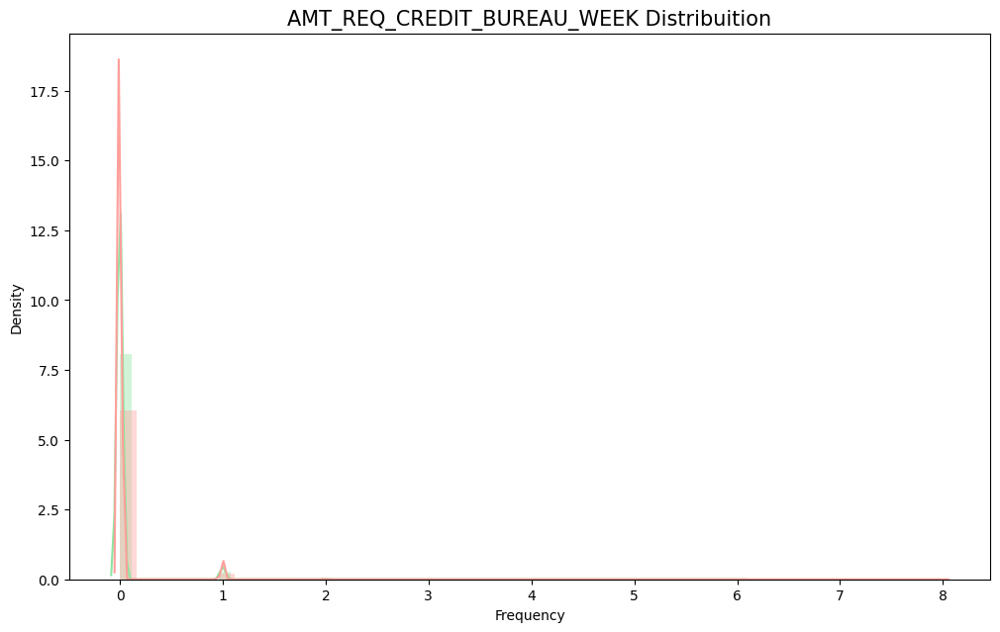




AMT_REQ_CREDIT_BUREAU_MON

         Count  TARGET_MEAN
TARGET                     
0       245459     0.270697
1        20533     0.227926


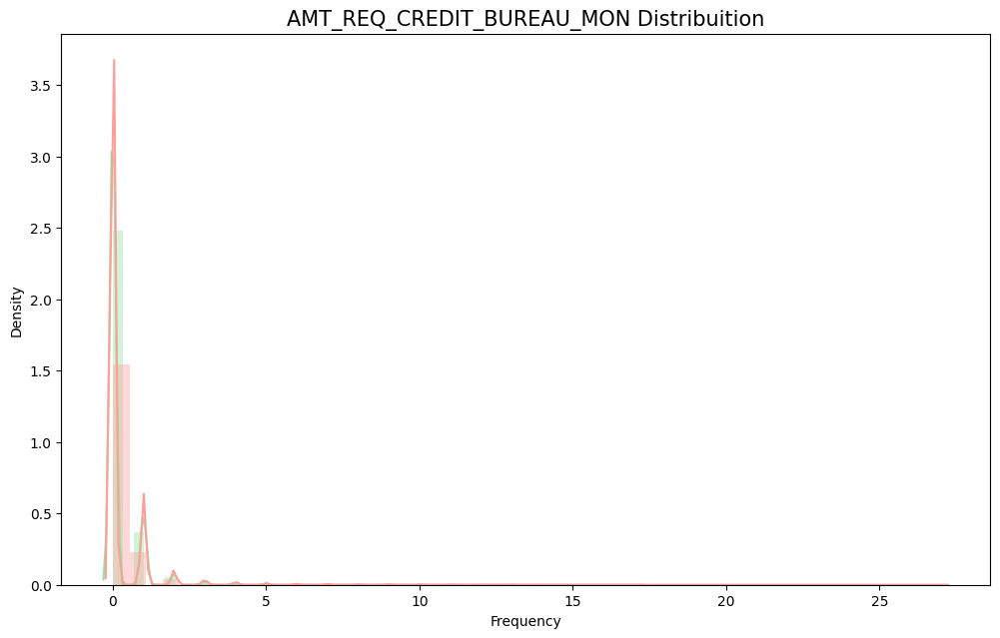




AMT_REQ_CREDIT_BUREAU_QRT

         Count  TARGET_MEAN
TARGET                     
0       245459     0.265939
1        20533     0.259923


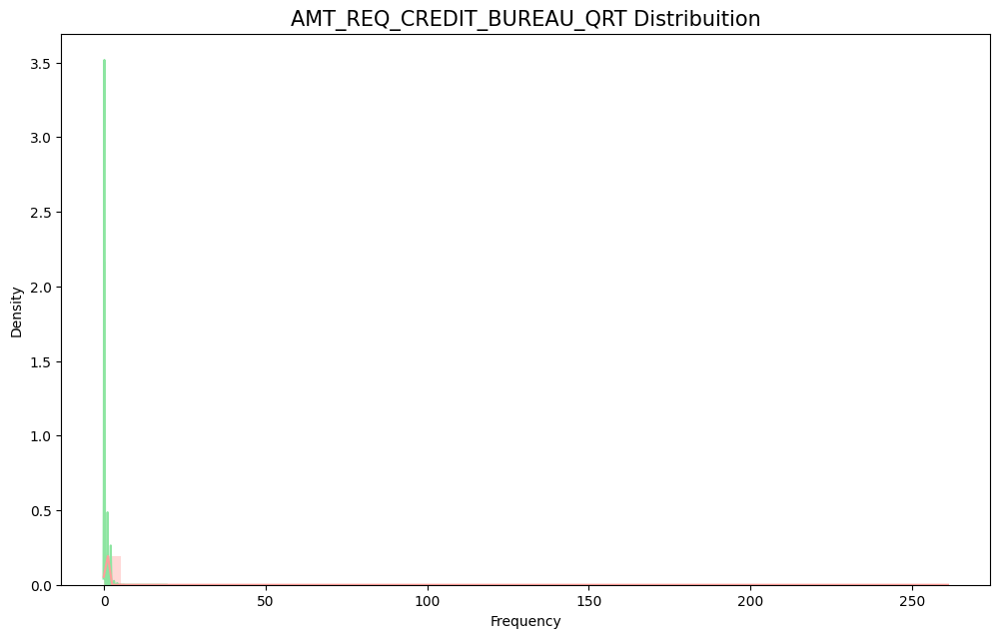




AMT_REQ_CREDIT_BUREAU_YEAR

         Count  TARGET_MEAN
TARGET                     
0       245459     1.889199
1        20533     2.028783


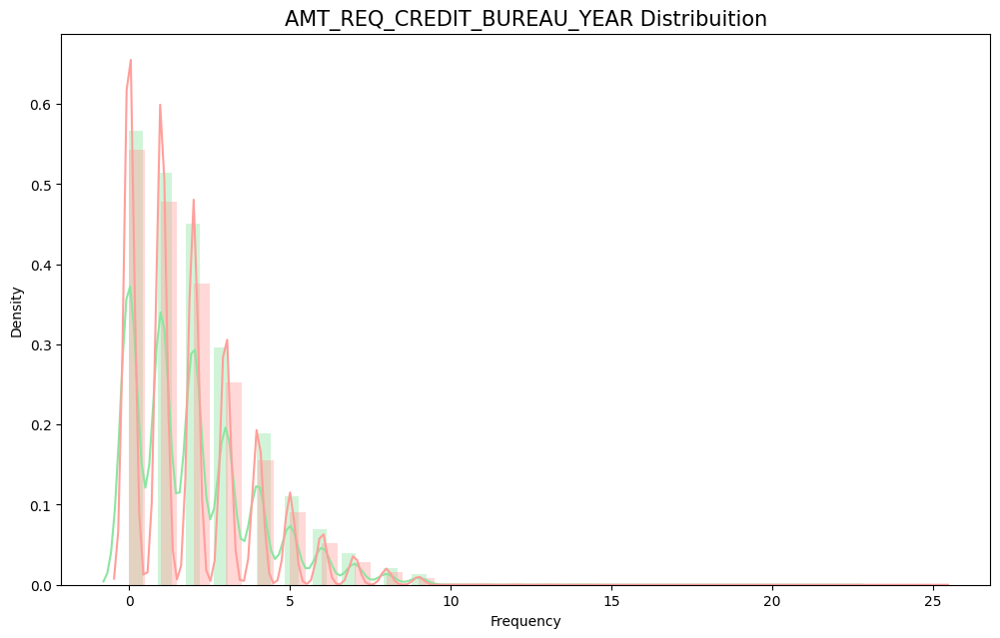

In [19]:
target_summary_with_nums(df, nums, "TARGET")

## Multivariate Analysis

In [25]:
correlations = df.corr()
correlations

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
SK_ID_CURR,1.000000,-0.002108,-0.001129,-0.001820,-0.000343,-0.000433,-0.000232,0.000849,-0.001500,0.001366,-0.000973,-0.000384,0.001818,0.002804,-0.001337,-0.000415,0.002815,0.002753,0.000281,-0.002895,-0.001075,-0.001138,0.000350,-0.000283,0.001097,0.002903,-0.001885,-0.001582,0.000067,0.000082,0.002342,0.000222,0.001556,-0.002070,0.001551,0.005900,-0.001463,0.004862,-0.002879,0.004851,0.003083,0.001465,0.003119,0.001770,-0.002575,0.003042,0.001961,-0.001411,0.001890,0.005245,-0.001058,0.005017,-0.002844,0.004386,0.002081,0.001548,0.003589,0.002156,-0.001923,0.001920,0.001988,-0.001647,0.001366,0.005777,-0.001036,0.005067,-0.002583,0.004588,0.002837,0.001699,0.003272,0.002205,-0.003020,0.002440,0.002288,-0.001409,-0.000082,-0.001423,0.001187,-0.000858,0.000700,-0.003411,-0.004139,-0.001097,0.002121,-0.002694,0.001809,0.001505,-0.000815,-0.002012,-0.001045,0.000896,-0.001077,0.002604,-0.000724,0.001450,0.000509,0.000167,0.001073,0.000282,-0.002672,-0.002193,0.002099,0.000485,0.001025,0.004659
TARGET,-0.002108,1.000000,0.019187,-0.003982,-0.030369,-0.012817,-0.039645,-0.037227,0.078239,-0.044932,0.041975,0.051457,0.037612,0.000534,0.045982,0.028524,0.000370,-0.023806,-0.001758,0.009308,0.058899,0.060893,-0.024166,0.005576,0.006942,0.002819,0.044395,0.050994,0.032518,-0.155317,-0.160472,-0.178919,-0.029498,-0.022746,-0.009728,-0.022149,-0.018550,-0.034199,-0.019172,-0.044003,-0.033614,-0.010885,-0.025031,-0.032997,-0.003176,-0.013578,-0.027284,-0.019952,-0.009036,-0.022068,-0.016340,-0.032131,-0.017387,-0.043226,-0.032698,-0.010174,-0.023393,-0.030685,-0.001557,-0.012711,-0.029184,-0.022081,-0.009993,-0.022326,-0.018573,-0.033863,-0.019025,-0.043768,-0.033394,-0.011256,-0.024621,-0.032739,-0.002757,-0.013337,-0.032596,0.009131,0.032248,0.009022,0.031276,0.055218,0.005417,0.044346,-0.002672,-0.000316,-0.028602,-0.001520,-0.008040,-0.004352,-0.001414,-0.004229,-0.000756,-0.011583,-0.009464,-0.006536,-0.011615,-0.003378,-0.007952,-0.001358,0.000215,0.003709,0.000930,0.002704,0.000788,-0.012462,-0.002022,0.019930
CNT_CHILDREN,-0.001129,0.019187,1.0000

In [ ]:
correlations = df.corr()['TARGET'].sort_values()
correlations

EXT_SOURCE_3                   -0.178919
EXT_SOURCE_2                   -0.160472
EXT_SOURCE_1                   -0.155317
DAYS_EMPLOYED                  -0.044932
FLOORSMAX_AVG                  -0.044003
FLOORSMAX_MEDI                 -0.043768
FLOORSMAX_MODE                 -0.043226
AMT_GOODS_PRICE                -0.039645
REGION_POPULATION_RELATIVE     -0.037227
ELEVATORS_AVG                  -0.034199
ELEVATORS_MEDI                 -0.033863
FLOORSMIN_AVG                  -0.033614
FLOORSMIN_MEDI                 -0.033394
LIVINGAREA_AVG                 -0.032997
LIVINGAREA_MEDI                -0.032739
FLOORSMIN_MODE                 -0.032698
TOTALAREA_MODE                 -0.032596
ELEVATORS_MODE                 -0.032131
LIVINGAREA_MODE                -0.030685
AMT_CREDIT                     -0.030369
APARTMENTS_AVG                 -0.029498
APARTMENTS_MEDI                -0.029184
FLAG_DOCUMENT_6                -0.028602
APARTMENTS_MODE                -0.027284
LIVINGAPARTMENTS

<Axes: >

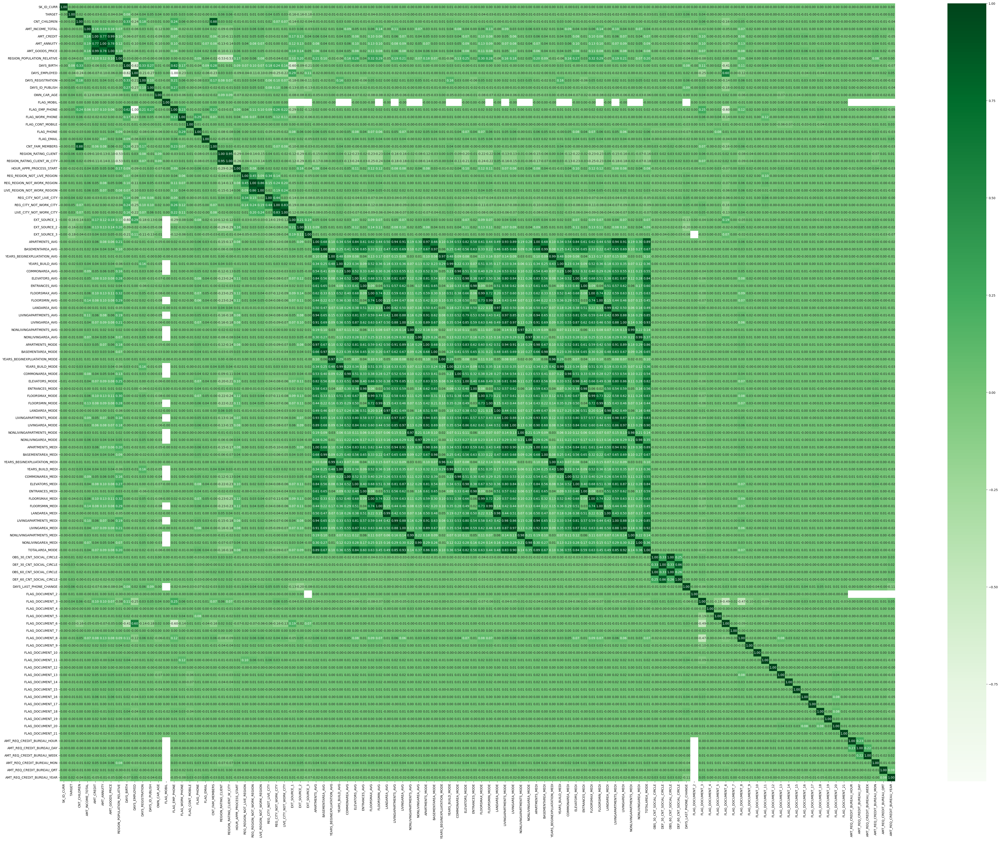

In [ ]:
plt.figure(figsize=(60,45))
sns.heatmap(df.corr(), cmap='Greens', annot=True, fmt='.2f')

In [ ]:
# Install library ppscore to calculate correlation between variable
!pip install -U ppscore

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
  Created wheel for ppscore: filename=ppscore-1.3.0-py2.py3-none-any.whl size=13165 sha256=6d0a8434f6ebf51165df167d0743e422bb1796f12f7fdf565247c633e822d9c6
  Stored in directory: /root/.cache/pip/wheels/42/87/10/00056aa2d2624f1b9374db6a0d5245da9a3d87bdc9247c1a56
Successfully built ppscore


<Axes: xlabel='x', ylabel='y'>

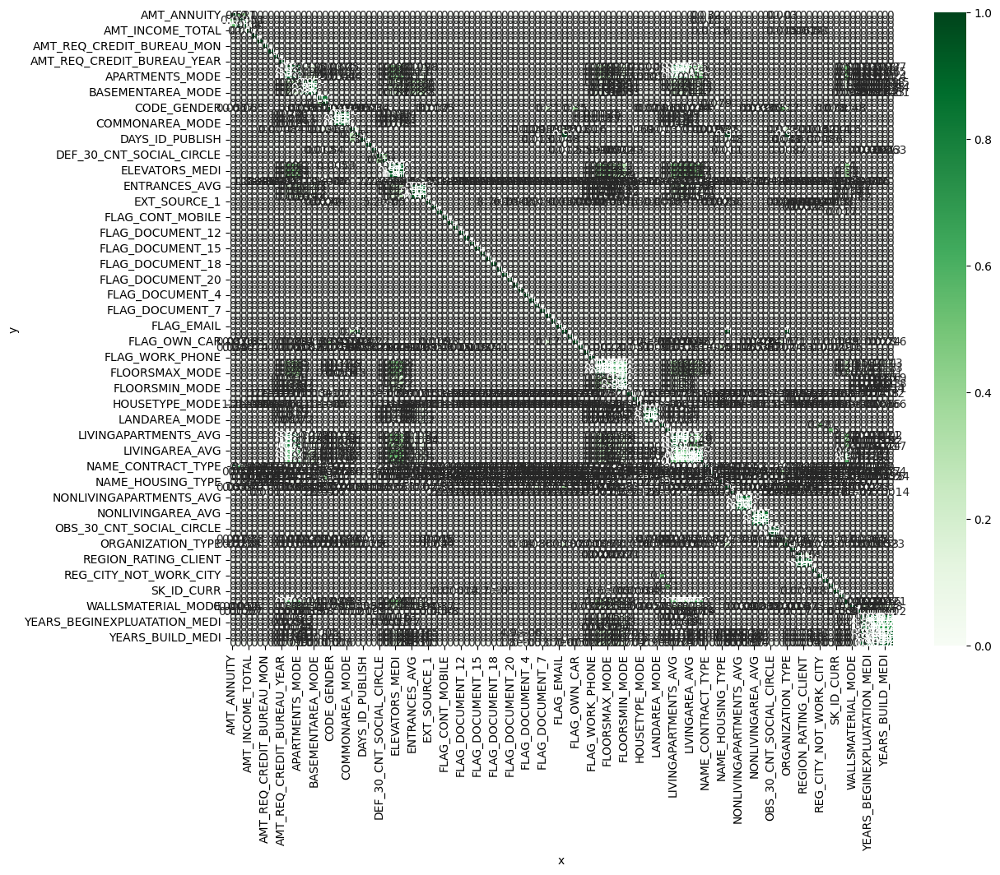

In [ ]:
numsimport ppscore as pps
df_pps = pps.matrix(df)
matrix_df = df_pps[["x", "y", "ppscore"]].pivot(columns="x", index="y", values="ppscore")
plt.figure(figsize=(30,15))
sns.heatmap(matrix_df, vmin=0, vmax=1, cmap='Greens', linewidth=0.5, annot=True)